In [1]:
# Setup: install required packages for this notebook
# Note: This installs into the currently active kernel environment.
# If you get permission errors, restart the kernel and run again.
import sys, subprocess, os, json, platform, shlex

# Helper to run pip with full output and error handling

def run_pip(args_list, desc=None):
    cmd = [sys.executable, '-m', 'pip'] + args_list
    print('RUN:', ' '.join(shlex.quote(c) for c in cmd))
    if desc:
        print('->', desc)
    proc = subprocess.run(cmd, capture_output=True, text=True)
    if proc.stdout:
        print(proc.stdout)
    if proc.stderr:
        print(proc.stderr)
    if proc.returncode != 0:
        print(f'pip command failed with exit code {proc.returncode}')
        return False
    return True

# Determine package list
req_path = os.path.join(os.path.dirname(__file__) if '__file__' in globals() else os.getcwd(), 'requirements.txt')
use_directml = (platform.system() == 'Windows' and sys.version_info[:2] == (3, 11))
base_pkgs = []
tf_pkg = None

if os.path.exists(req_path):
    print('requirements.txt found at:', req_path)
    with open(req_path, 'r', encoding='utf-8') as f:
        for line in f:
            line = line.strip()
            if not line or line.startswith('#'):
                continue
            low = line.lower()
            if low.startswith('tensorflow'):
                tf_pkg = 'tensorflow-directml' if use_directml else line
            else:
                base_pkgs.append(line)
else:
    print('requirements.txt not found; using a minimal default set...')
    base_pkgs = ['numpy', 'matplotlib', 'seaborn', 'jupyter']
    tf_pkg = 'tensorflow-directml' if use_directml else 'tensorflow'

print('Python:', sys.version)
print('Base packages:', base_pkgs)
print('TF package:', tf_pkg)

# Upgrade pip/setuptools/wheel first for best chance of wheels
run_pip(['install', '--upgrade', 'pip', 'setuptools', 'wheel'], desc='Upgrade pip/setuptools/wheel')

# Install base packages first (to avoid failing the whole batch on TF)
if base_pkgs:
    run_pip(['install', *base_pkgs], desc='Install base packages')

# Try installing TensorFlow package with retries/fallbacks

def try_install_tf(tf_name):
    ok = run_pip(['install', tf_name], desc=f'Install {tf_name}')
    return ok

installed_tf = False
if tf_pkg:
    # Attempt TF package
    if try_install_tf(tf_pkg):
        installed_tf = True
    else:
        if tf_pkg == 'tensorflow-directml':
            print('tensorflow-directml install failed. Retrying after ensuring build tools...')
            run_pip(['install', '--upgrade', 'pip', 'setuptools', 'wheel'])
            if try_install_tf('tensorflow-directml'):
                installed_tf = True
            else:
                print('Falling back to CPU TensorFlow (tensorflow). GPU acceleration will not be available in this kernel.')
                if try_install_tf('tensorflow'):
                    installed_tf = True
        else:
            # If normal tensorflow failed, nothing else to do here.
            print('tensorflow install failed. See logs above for details.')

# Print versions to confirm

def show_ver(mod_name, attr='__version__'):
    try:
        m = __import__(mod_name)
        ver = getattr(m, attr, 'N/A')
        print(f'{mod_name} version:', ver)
        return True
    except Exception as e:
        print(f'Failed to import {mod_name}:', e)
        return False

show_ver('numpy')
show_ver('matplotlib')
show_ver('seaborn')
# TensorFlow import may take longer
show_ver('tensorflow')

# Optional: show if TF sees GPU (DirectML or CUDA)
try:
    import tensorflow as tf
    built_with_cuda = getattr(tf.test, 'is_built_with_cuda', lambda: 'N/A')()
    print('TF built with CUDA:', built_with_cuda)
    print('Available devices:', tf.config.list_physical_devices())
    print('TF GPUs:', tf.config.list_physical_devices('GPU'))
except Exception as e:
    print('TensorFlow GPU check error:', e)


requirements.txt found at: c:\Users\abdal\Desktop\outils de programation avanace\requirements.txt
Python: 3.11.9 (tags/v3.11.9:de54cf5, Apr  2 2024, 10:12:12) [MSC v.1938 64 bit (AMD64)]
Base packages: ['numpy', 'matplotlib', 'seaborn', 'jupyter']
TF package: tensorflow-directml
RUN: 'c:\Users\abdal\AppData\Local\Programs\Python\Python311\python.exe' -m pip install --upgrade pip setuptools wheel
-> Upgrade pip/setuptools/wheel

RUN: 'c:\Users\abdal\AppData\Local\Programs\Python\Python311\python.exe' -m pip install numpy matplotlib seaborn jupyter
-> Install base packages

RUN: 'c:\Users\abdal\AppData\Local\Programs\Python\Python311\python.exe' -m pip install tensorflow-directml
-> Install tensorflow-directml
ERROR: Could not find a version that satisfies the requirement tensorflow-directml (from versions: none)
ERROR: No matching distribution found for tensorflow-directml

pip command failed with exit code 1
tensorflow-directml install failed. Retrying after ensuring build tools...
RUN

## Why TensorFlow is not using the GPU and how to fix it

From the setup cell output above:
- TensorFlow version: 2.20.0
- TF built with CUDA: False
- TF GPUs: []

This means the TensorFlow wheel that got installed is a CPU-only build. In this current environment (Python 3.12 on Windows), the prebuilt GPU-enabled TensorFlow package isn’t available, so pip defaults to the CPU build.

What this implies:
- Your NVIDIA GPU is fine, but TensorFlow in this kernel wasn’t compiled with CUDA/cuDNN support, so it can’t see or use the GPU.

How to enable GPU for TensorFlow (recommended path):
1) Create a fresh environment with Python 3.11 (GPU builds are available there more reliably).
2) Install a GPU-enabled TensorFlow that matches your Python version.
3) Register that environment as a Jupyter kernel and switch this notebook to it.

Example using Conda (Windows PowerShell):
```powershell
# Create and activate a Python 3.11 environment
conda create -n tf-gpu-311 python=3.11 -y
conda activate tf-gpu-311

# Install TensorFlow (GPU build will be picked when available for this combo)
pip install --upgrade pip
pip install tensorflow

# Optional: verify GPU
python -c "import tensorflow as tf; print(tf.__version__); print('built_with_cuda:', tf.test.is_built_with_cuda()); print('GPUs:', tf.config.list_physical_devices('GPU'))"

# Make this env visible in Jupyter
pip install ipykernel
python -m ipykernel install --user --name tf-gpu-311 --display-name "Python 3.11 (tf-gpu)"
```
Then, in the notebook, change the kernel to "Python 3.11 (tf-gpu)" and re-run the setup check.

Notes:
- TensorFlow GPU support requires specific CUDA/cuDNN versions baked into the wheel. Using the right Python version avoids manual CUDA installs.
- For this educational notebook (small arrays and heatmaps), GPU isn’t necessary for correctness or speed. You can continue on CPU and switch to GPU later when training larger models.


# From Self-Attention mechanism to Transformers

This notebook aims to provide a comprehensive and practical understanding of the self-attention mechanism and its applications in various contexts, through detailed explanations, visualizations and interactive exercises.

## Self-Attention mechanism: basic implementation

Here is an example of Python code using TensorFlow and Matplotlib to explain and visualize the Self-Attention mechanism. This code shows intermediate steps such as generating queries, keys, and values ​​matrices, as well as calculating attention scores and applying attention weights to values. .

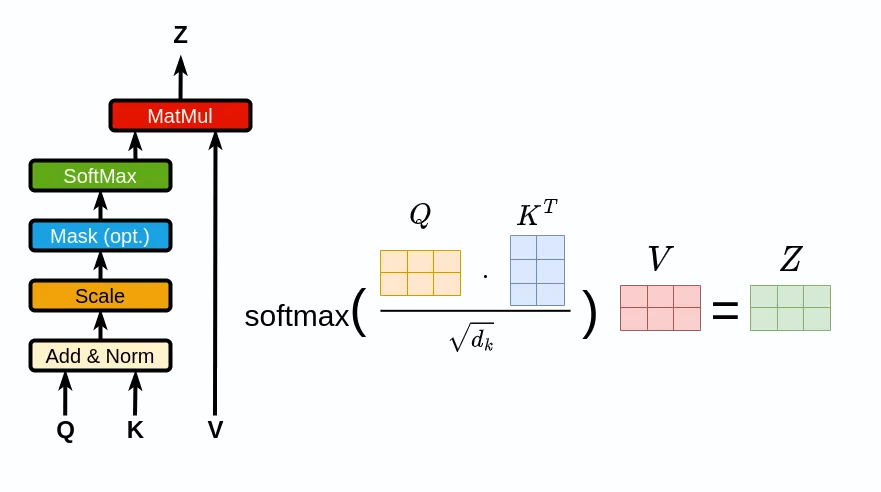

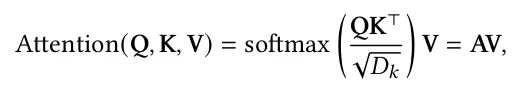

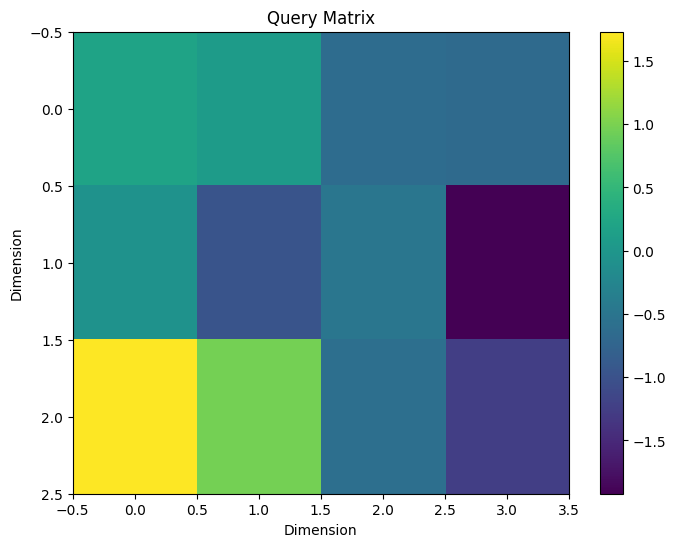

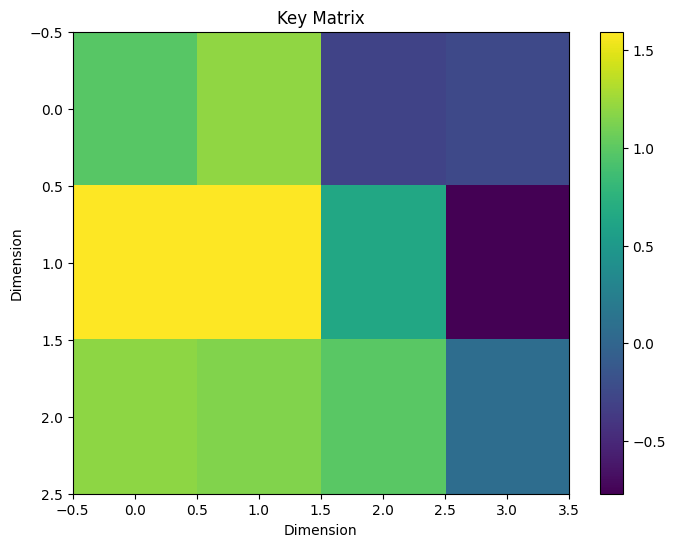

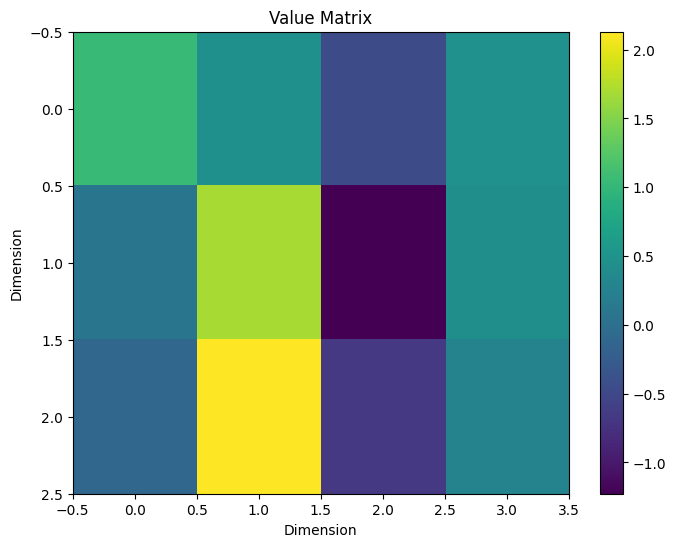

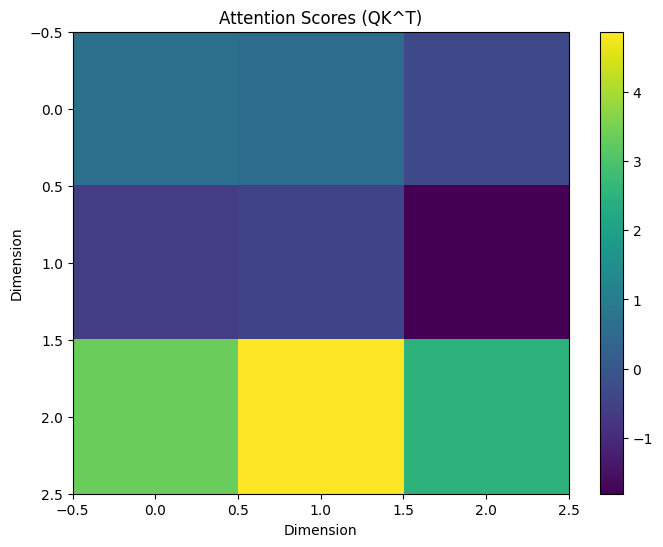

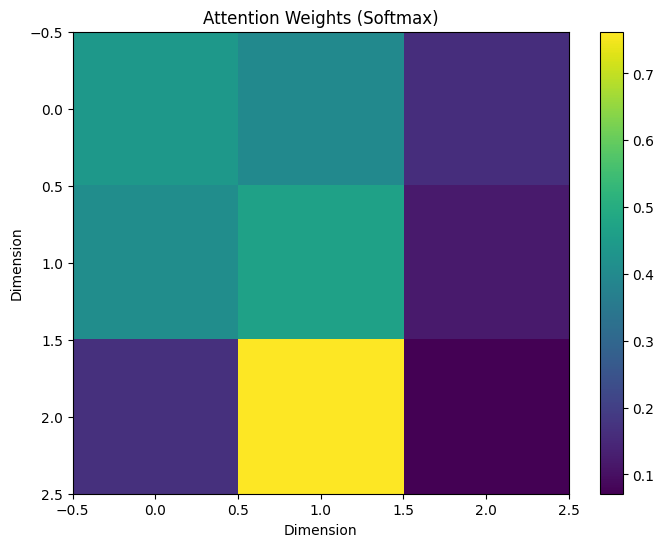

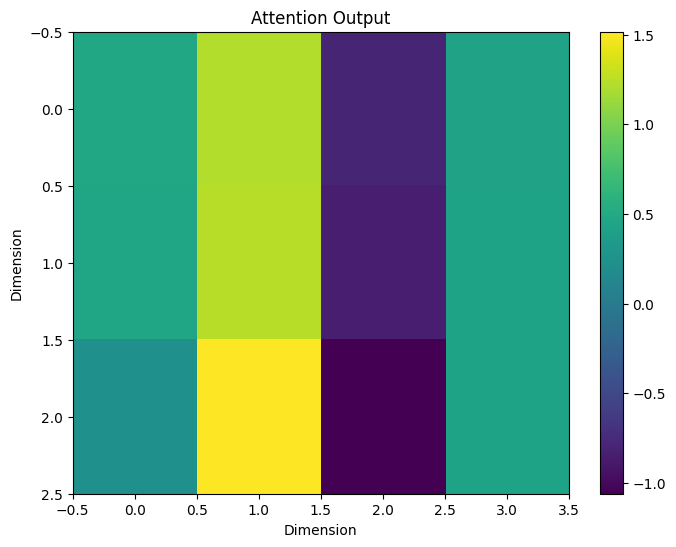

Input Sequence:
 [[1 0 1 0]
 [0 2 1 0]
 [1 1 0 1]]
Query Matrix:
 [[ 0.20360404  0.08474499 -0.63665634 -0.6618855 ]
 [-0.05542481 -0.96868217 -0.49321693 -1.920951  ]
 [ 1.731055    0.9649825  -0.5915951  -1.2461803 ]]
Key Matrix:
 [[ 0.98238564  1.2064893  -0.29336497 -0.24958098]
 [ 1.5943911   1.5900702   0.6463456  -0.76942736]
 [ 1.1961594   1.1462808   0.9851584   0.07685265]]
Value Matrix:
 [[ 1.0431122   0.4610433  -0.45317614  0.47214335]
 [ 0.08285403  1.6884431  -1.2276869   0.4403823 ]
 [-0.11727771  2.130686   -0.67198926  0.2758873 ]]
Attention Scores:
 [[ 0.6542283   0.55714774 -0.33739057]
 [-0.5990279  -0.46939787 -1.8102057 ]
 [ 3.3493807   4.870839    2.4981713 ]]
Attention Weights:
 [[0.4388932  0.39828804 0.1628187 ]
 [0.4104663  0.46727777 0.12225586]
 [0.1665058  0.76241314 0.07108106]]
Attention Output:
 [[ 0.47171962  1.221751   -0.7972814   0.4275391 ]
 [ 0.45254034  1.2387035  -0.84183896  0.43330866]
 [ 0.228517    1.515509   -1.0592269   0.43397823]]


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

def plot_matrix(matrix, title):
    plt.figure(figsize=(8, 6))
    plt.imshow(matrix, cmap='viridis', aspect='auto')
    plt.colorbar()
    plt.title(title)
    plt.xlabel('Dimension')
    plt.ylabel('Dimension')
    plt.show()

# Input sequence: a matrix where each row represents a feature vector for a sequence element
input_sequence = np.array([[1, 0, 1, 0],
                           [0, 2, 1, 0],
                           [1, 1, 0, 1]])

# Model parameters
d_model = input_sequence.shape[1]  # Dimension of the embeddings
num_heads = 1  # Number of attention heads (single head for simplicity)

# Create query, key, and value matrices using linear transformations (Dense layers)
query = tf.keras.layers.Dense(d_model)(input_sequence)
key = tf.keras.layers.Dense(d_model)(input_sequence)
value = tf.keras.layers.Dense(d_model)(input_sequence)

# Visualize the query, key, and value matrices
plot_matrix(query, "Query Matrix")
plot_matrix(key, "Key Matrix")
plot_matrix(value, "Value Matrix")

# Compute attention scores by performing dot product of queries and transposed keys
scores = tf.matmul(query, key, transpose_b=True)
plot_matrix(scores, "Attention Scores (QK^T)")

# Apply softmax to the scores to obtain attention weights
attention_weights = tf.nn.softmax(scores, axis=-1)
plot_matrix(attention_weights, "Attention Weights (Softmax)")

# Apply attention weights to the values to get the final attention output
attention_output = tf.matmul(attention_weights, value)
plot_matrix(attention_output, "Attention Output")

# Print the results for reference
print("Input Sequence:\n", input_sequence)
print("Query Matrix:\n", query.numpy())
print("Key Matrix:\n", key.numpy())
print("Value Matrix:\n", value.numpy())
print("Attention Scores:\n", scores.numpy())
print("Attention Weights:\n", attention_weights.numpy())
print("Attention Output:\n", attention_output.numpy())

### Detailed Explanations of Each Step
#### Input Sequence: The input sequence is a matrix where each row represents a feature vector for an element of the sequence. This is the data we want to apply self-attention to.

#### Query, Key, and Value Matrices: These matrices are created by applying linear transformations (Dense layers) to the input sequence.
- Queries: Used to compare against keys to measure similarity.
- Keys: Used in conjunction with queries to compute attention scores.
- Values: Contain the information we want to focus on and extract based on the computed attention scores.

#### Attention Scores:

- Calculated by taking the dot product of the query matrix and the transposed key matrix.
- This gives a measure of similarity between elements of the sequence.

#### Attention Weights:

- The scores are passed through a softmax function to convert them into probabilities (attention weights).
- These weights determine the relative importance of each element in the sequence.

#### Attention Output:

- The attention weights are applied to the value matrix to compute the final attention output.
- This output represents the weighted sum of values based on their attention weights, capturing the relevant information from the input sequence.

### Visualizations
- Query, Key, and Value Matrices: Visualized to understand how the input sequence is transformed.
- Attention Scores: Show the similarity measures between different elements of the sequence.
- Attention Weights: Show the normalized importance of each element in the sequence.
- Attention Output: The final weighted output that captures the important information based on the attention mechanism.

## Self-Attention mechanism: Using a sentence as input

The sentence "I love tennis" is represented using embeddings, and the self-attention mechanism is applied to transform these embeddings.

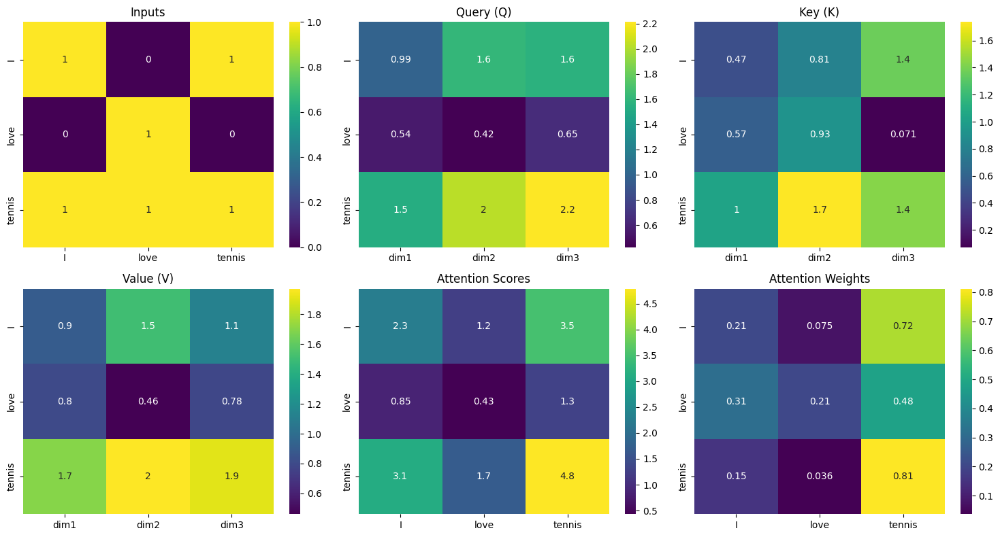

Phrase: ['I', 'love', 'tennis']

Inputs:
 [[1 0 1]
 [0 1 0]
 [1 1 1]]

Query (Q):
 [[0.98640072 1.60696237 1.56642614]
 [0.54488318 0.4236548  0.64589411]
 [1.5312839  2.03061717 2.21232025]]

Key (K):
 [[0.47057082 0.81194344 1.36151477]
 [0.56804456 0.92559664 0.07103606]
 [1.03861538 1.73754007 1.43255082]]

Value (V):
 [[0.89643118 1.50993317 1.12197163]
 [0.79915856 0.46147936 0.78052918]
 [1.69558974 1.97141253 1.90250081]]

Attention Scores:
 [[2.25261651 1.24649419 3.4991107 ]
 [0.85435382 0.43158847 1.28594229]
 [3.10697034 1.67808266 4.78505299]]

Attention Weights:
 [[0.2064511  0.07548555 0.71806334]
 [0.31299554 0.20508481 0.48191965]
 [0.15163339 0.03632761 0.812039  ]]

Output:
 [[1.46293497 1.76216147 1.65666705]
 [1.26161226 1.5173072  1.42809932]
 [1.54184542 1.84658459 1.74338797]]


In [4]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def softmax(x):
    return np.exp(x) / np.sum(np.exp(x), axis=-1, keepdims=True)

# Example sentence embeddings (3 dimensions per word)
embeddings = {
    "I": [1, 0, 1],
    "love": [0, 1, 0],
    "tennis": [1, 1, 1]
}

# Convert sentence to sequence of embeddings
sentence = ["I", "love", "tennis"]
inputs = np.array([embeddings[word] for word in sentence])

# Initialize weights for Query, Key, and Value matrices
np.random.seed(0)
Wq = np.random.rand(3, 3)
Wk = np.random.rand(3, 3)
Wv = np.random.rand(3, 3)

# Compute Query, Key, and Value matrices
Q = np.dot(inputs, Wq)
K = np.dot(inputs, Wk)
V = np.dot(inputs, Wv)

# Compute attention scores
scores = np.dot(Q, K.T) / np.sqrt(K.shape[1])

# Apply softmax to get attention weights
attention_weights = softmax(scores)

# Compute the output of the self-attention mechanism
output = np.dot(attention_weights, V)

# Plotting the inputs
plt.figure(figsize=(15, 8))
plt.subplot(2, 3, 1)
sns.heatmap(inputs, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Inputs')

# Plotting Query (Q) matrix
plt.subplot(2, 3, 2)
sns.heatmap(Q, annot=True, cmap='viridis', xticklabels=['dim1', 'dim2', 'dim3'], yticklabels=sentence)
plt.title('Query (Q)')

# Plotting Key (K) matrix
plt.subplot(2, 3, 3)
sns.heatmap(K, annot=True, cmap='viridis', xticklabels=['dim1', 'dim2', 'dim3'], yticklabels=sentence)
plt.title('Key (K)')

# Plotting Value (V) matrix
plt.subplot(2, 3, 4)
sns.heatmap(V, annot=True, cmap='viridis', xticklabels=['dim1', 'dim2', 'dim3'], yticklabels=sentence)
plt.title('Value (V)')

# Plotting Attention Scores
plt.subplot(2, 3, 5)
sns.heatmap(scores, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Attention Scores')

# Plotting Attention Weights
plt.subplot(2, 3, 6)
sns.heatmap(attention_weights, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Attention Weights')

plt.tight_layout()
plt.show()

print("Phrase:", sentence)
print("\nInputs:\n", inputs)
print("\nQuery (Q):\n", Q)
print("\nKey (K):\n", K)
print("\nValue (V):\n", V)
print("\nAttention Scores:\n", scores)
print("\nAttention Weights:\n", attention_weights)
print("\nOutput:\n", output)

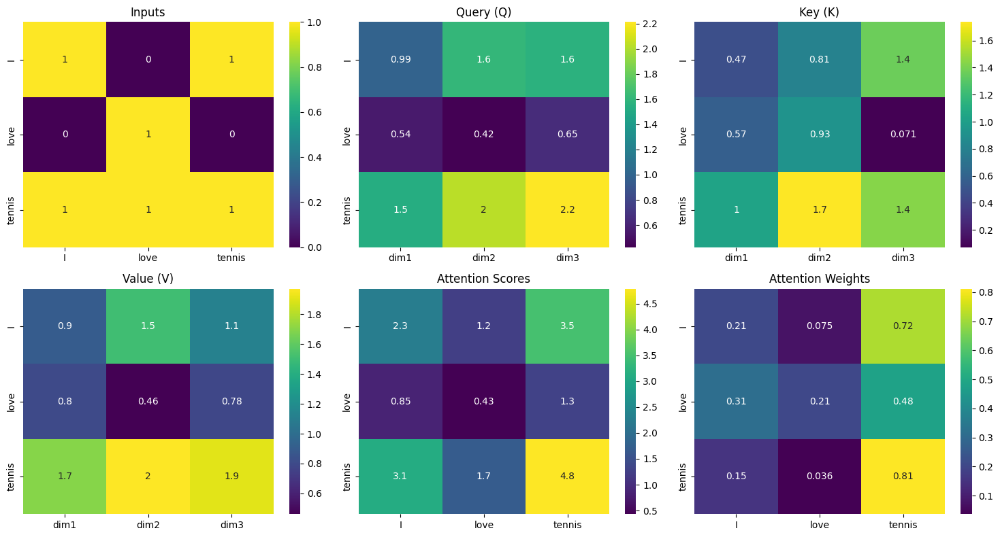

## Self-Attention mechanism: Word embeddings computing

To demonstrate a basic self-attention mechanism with real embeddings, we'll use a simple approach to compute word embeddings based on co-occurrence statistics from the given sentence. Here, I'll provide a complete example including the calculation of basic word embeddings and applying the self-attention mechanism.

### Step-by-Step Process
 - Tokenize the Sentence: We'll split the sentence into individual words (tokens).

 - Calculate Word Embeddings: We'll use a basic technique to create embeddings based on the context of each word. In this case, we'll use one-hot encoding as the simplest form of embedding.

 - Apply Self-Attention: Using the calculated embeddings, we'll apply the self-attention mechanism and visualize the intermediate results.

 - Initialize Weights: Random weights for Query (Q), Key (K), and Value (V) matrices are initialized.

 - Compute Q, K, and V Matrices: The input embeddings are transformed into Q, K, and V matrices using the initialized weights.

 - Compute Attention Scores: Attention scores are calculated by taking the dot product of Q and K transpose, then normalizing by the square root of the key dimension.

 - Apply Softmax to Get Attention Weights: The softmax function is applied to the attention scores to obtain the attention weights.

- Compute the Output: The final output is calculated by multiplying the attention weights with the value matrix V.

 - Visualization: Various stages of the self-attention mechanism (inputs, Q, K, V matrices, attention scores, and attention weights) are visualized using heatmaps.

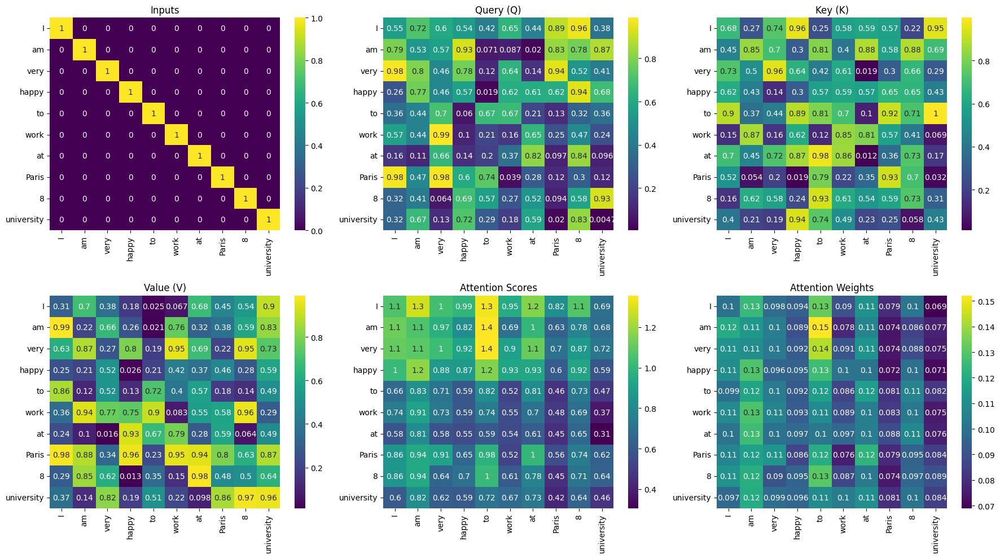

Sentence: ['I', 'am', 'very', 'happy', 'to', 'work', 'at', 'Paris', '8', 'university']

Inputs:
 [[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]

Query (Q):
 [[0.5488135  0.71518937 0.60276338 0.54488318 0.4236548  0.64589411
  0.43758721 0.891773   0.96366276 0.38344152]
 [0.79172504 0.52889492 0.56804456 0.92559664 0.07103606 0.0871293
  0.0202184  0.83261985 0.77815675 0.87001215]
 [0.97861834 0.79915856 0.46147936 0.78052918 0.11827443 0.63992102
  0.14335329 0.94466892 0.52184832 0.41466194]
 [0.26455561 0.77423369 0.45615033 0.56843395 0.0187898  0.6176355
  0.61209572 0.616934   0.94374808 0.6818203 ]
 [0.3595079  0.43703195 0.6976312  0.06022547 0.66676672 0.67063787
  0.21038256 0.1289263  0.3154283

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def softmax(x):
    return np.exp(x) / np.sum(np.exp(x), axis=-1, keepdims=True)

# Tokenize the sentence
sentence = "I am very happy to work at Paris 8 university".split()
vocab_size = len(sentence)

# Create one-hot embeddings for each word
word_to_index = {word: idx for idx, word in enumerate(sentence)}
embeddings = np.eye(vocab_size)

# Convert sentence to sequence of embeddings
inputs = np.array([embeddings[word_to_index[word]] for word in sentence])

# Initialize weights for Query, Key, and Value matrices
np.random.seed(0)
Wq = np.random.rand(vocab_size, vocab_size)
Wk = np.random.rand(vocab_size, vocab_size)
Wv = np.random.rand(vocab_size, vocab_size)

# Compute Query, Key, and Value matrices
Q = np.dot(inputs, Wq)
K = np.dot(inputs, Wk)
V = np.dot(inputs, Wv)

# Compute attention scores
scores = np.dot(Q, K.T) / np.sqrt(K.shape[1])

# Apply softmax to get attention weights
attention_weights = softmax(scores)

# Compute the output of the self-attention mechanism
output = np.dot(attention_weights, V)

# Visualization
plt.figure(figsize=(18, 10))

# Plotting the inputs
plt.subplot(2, 3, 1)
sns.heatmap(inputs, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Inputs')

# Plotting Query (Q) matrix
plt.subplot(2, 3, 2)
sns.heatmap(Q, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Query (Q)')

# Plotting Key (K) matrix
plt.subplot(2, 3, 3)
sns.heatmap(K, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Key (K)')

# Plotting Value (V) matrix
plt.subplot(2, 3, 4)
sns.heatmap(V, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Value (V)')

# Plotting Attention Scores
plt.subplot(2, 3, 5)
sns.heatmap(scores, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Attention Scores')

# Plotting Attention Weights
plt.subplot(2, 3, 6)
sns.heatmap(attention_weights, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Attention Weights')

plt.tight_layout()
plt.show()

print("Sentence:", sentence)
print("\nInputs:\n", inputs)
print("\nQuery (Q):\n", Q)
print("\nKey (K):\n", K)
print("\nValue (V):\n", V)
print("\nAttention Scores:\n", scores)
print("\nAttention Weights:\n", attention_weights)
print("\nOutput:\n", output)

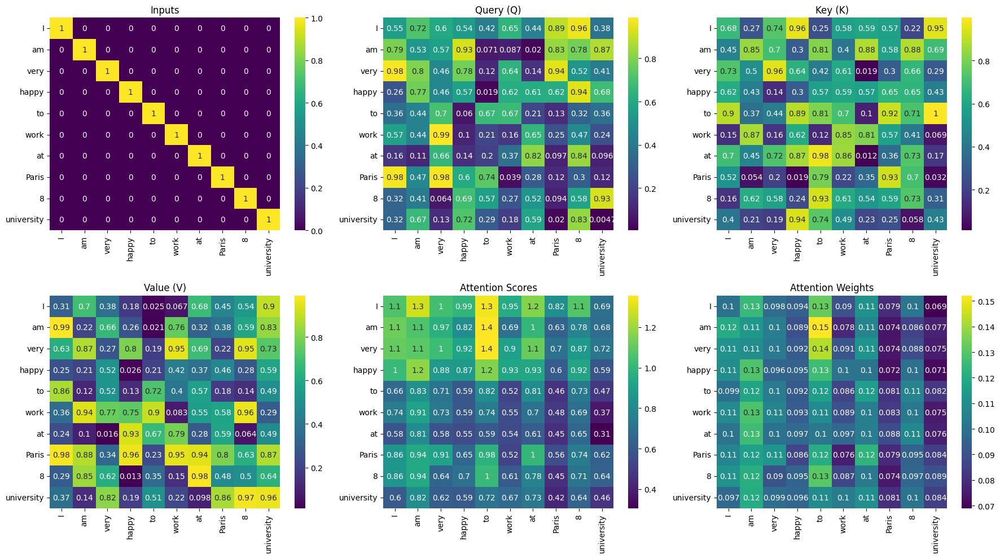

## Complete Encoder Implementation

The encoder implementation involves several key steps, each contributing to transforming the input data and capturing relationships and context within a sentence. Here’s a detailed explanation of each step:


1. Tokenization and Embedding

 - Tokenization: The input sentence "I am very happy to work at Paris 8 university" is split into individual words (tokens), creating a list of tokens.

 - Embedding: Each word in the sentence is represented using one-hot encoding, which is a basic form of word embedding. In one-hot encoding, each word is represented by a unique vector where only one element is 1 (indicating the presence of the word), and all other elements are 0.

2. Initialize Weights

 - Weight Initialization: Random weights are initialized for the Query (Q), Key (K), and Value (V) matrices, as well as for the feed-forward neural network layers. These weights will be used to transform the input embeddings during the self-attention and feed-forward processes.

3. Self-Attention Layer

 - Compute Q, K, and V Matrices: The input embeddings are multiplied by the respective weight matrices to obtain the Q, K, and V matrices. These matrices are essential for calculating attention scores.

 - Calculate Attention Scores: The attention scores are calculated by taking the dot product of the Q matrix and the transpose of the K matrix. The resulting scores are then scaled by the square root of the dimension of the key vectors to ensure stable gradients.

 - Softmax Application: The softmax function is applied to the attention scores to convert them into probabilities, which represent the attention weights. These weights indicate how much attention each word should pay to other words in the sentence.

 - Compute Attention Output: The attention weights are multiplied by the V matrix to obtain the attention output. This output is a weighted sum of the value vectors, capturing the context and relationships between words.

4. Add & Norm Layer (Self-Attention)

 - Residual Connection and Layer Normalization: The attention output is added to the original input embeddings (residual connection) to preserve the initial information. Layer normalization is then applied to the result, ensuring stable and normalized outputs.

5. Feed-Forward Layer

 - Feed-Forward Neural Network: The output from the self-attention layer is passed through a feed-forward neural network, which typically consists of two linear transformations with a ReLU activation function in between. This layer further transforms the data, capturing more complex relationships.

6. Add & Norm Layer (Feed-Forward)

 - Residual Connection and Layer Normalization: The output from the feed-forward layer is added to the self-attention output (residual connection) and normalized again using layer normalization. This step helps in maintaining the stability and richness of the transformed data.


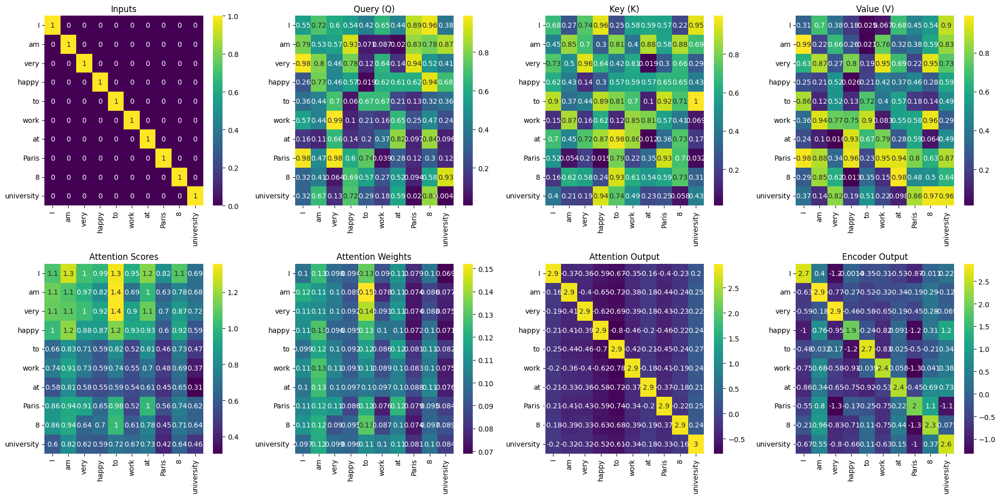

Sentence: ['I', 'am', 'very', 'happy', 'to', 'work', 'at', 'Paris', '8', 'university']

Inputs:
 [[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]

Query (Q):
 [[0.5488135  0.71518937 0.60276338 0.54488318 0.4236548  0.64589411
  0.43758721 0.891773   0.96366276 0.38344152]
 [0.79172504 0.52889492 0.56804456 0.92559664 0.07103606 0.0871293
  0.0202184  0.83261985 0.77815675 0.87001215]
 [0.97861834 0.79915856 0.46147936 0.78052918 0.11827443 0.63992102
  0.14335329 0.94466892 0.52184832 0.41466194]
 [0.26455561 0.77423369 0.45615033 0.56843395 0.0187898  0.6176355
  0.61209572 0.616934   0.94374808 0.6818203 ]
 [0.3595079  0.43703195 0.6976312  0.06022547 0.66676672 0.67063787
  0.21038256 0.1289263  0.3154283

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Softmax function
def softmax(x):
    return np.exp(x) / np.sum(np.exp(x), axis=-1, keepdims=True)

# Layer normalization function
def layer_norm(x):
    return (x - np.mean(x, axis=-1, keepdims=True)) / np.std(x, axis=-1, keepdims=True)

# Tokenize the sentence
sentence = "I am very happy to work at Paris 8 university".split()
vocab_size = len(sentence)

# Create one-hot embeddings for each word
word_to_index = {word: idx for idx, word in enumerate(sentence)}
embeddings = np.eye(vocab_size)

# Convert sentence to sequence of embeddings
inputs = np.array([embeddings[word_to_index[word]] for word in sentence])

# Initialize weights for Query, Key, Value, and Feed-Forward matrices
np.random.seed(0)
Wq = np.random.rand(vocab_size, vocab_size)
Wk = np.random.rand(vocab_size, vocab_size)
Wv = np.random.rand(vocab_size, vocab_size)
W1 = np.random.rand(vocab_size, vocab_size)  # Feed-Forward layer 1 weights
W2 = np.random.rand(vocab_size, vocab_size)  # Feed-Forward layer 2 weights

# Self-Attention Layer
Q = np.dot(inputs, Wq)
K = np.dot(inputs, Wk)
V = np.dot(inputs, Wv)

scores = np.dot(Q, K.T) / np.sqrt(K.shape[1])
attention_weights = softmax(scores)
attention_output = np.dot(attention_weights, V)

# Add & Norm Layer (Self-Attention Output + Inputs)
attention_output = layer_norm(attention_output + inputs)

# Feed-Forward Layer
ffn_output = np.dot(attention_output, W1)
ffn_output = np.maximum(0, ffn_output)  # ReLU activation
ffn_output = np.dot(ffn_output, W2)

# Add & Norm Layer (Feed-Forward Output + Self-Attention Output)
encoder_output = layer_norm(ffn_output + attention_output)

# Visualization
plt.figure(figsize=(20, 10))

# Plotting the inputs
plt.subplot(2, 4, 1)
sns.heatmap(inputs, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Inputs')

# Plotting Query (Q) matrix
plt.subplot(2, 4, 2)
sns.heatmap(Q, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Query (Q)')

# Plotting Key (K) matrix
plt.subplot(2, 4, 3)
sns.heatmap(K, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Key (K)')

# Plotting Value (V) matrix
plt.subplot(2, 4, 4)
sns.heatmap(V, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Value (V)')

# Plotting Attention Scores
plt.subplot(2, 4, 5)
sns.heatmap(scores, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Attention Scores')

# Plotting Attention Weights
plt.subplot(2, 4, 6)
sns.heatmap(attention_weights, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Attention Weights')

# Plotting Attention Output
plt.subplot(2, 4, 7)
sns.heatmap(attention_output, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Attention Output')

# Plotting Encoder Output
plt.subplot(2, 4, 8)
sns.heatmap(encoder_output, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Encoder Output')

plt.tight_layout()
plt.show()

print("Sentence:", sentence)
print("\nInputs:\n", inputs)
print("\nQuery (Q):\n", Q)
print("\nKey (K):\n", K)
print("\nValue (V):\n", V)
print("\nAttention Scores:\n", scores)
print("\nAttention Weights:\n", attention_weights)
print("\nAttention Output:\n", attention_output)
print("\nFeed-Forward Output:\n", ffn_output)
print("\nEncoder Output:\n", encoder_output)

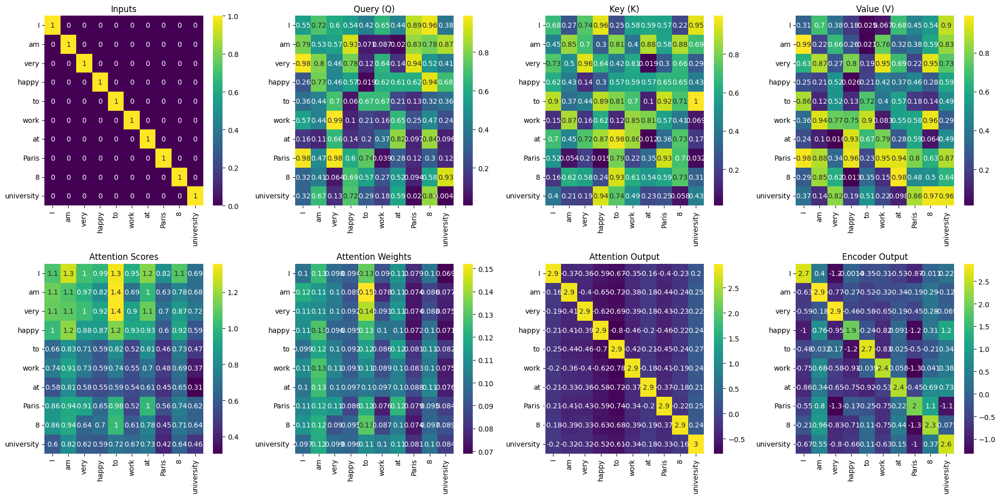

## Complete Encoder-Decoder Implementation Using Self-Attention

To implement a complete encoder-decoder model using self-attention, we'll extend the previous encoder implementation by adding a decoder component. The decoder will also include self-attention and cross-attention layers to process the encoder outputs and generate predictions.

1. Tokenization and Embedding

 - Tokenization: Both the source (encoder) sentence "I am very happy to work at Paris 8 university" and the target (decoder) sentence "Je suis très heureux de travailler à l'université Paris 8" are tokenized into individual words.

 - Embedding: Each word is converted into a one-hot vector representation. This simple embedding method is used to map each word to a unique vector.

2. Initialize Weights

 - Random weights are initialized for the Query (Q), Key (K), and Value (V) matrices for both the encoder and decoder. Additionally, weights are initialized for the feed-forward layers in both the encoder and decoder.

3. Encoder

 - Self-Attention Layer: The input embeddings are transformed using the Q, K, and V matrices. Attention scores are computed and normalized using softmax to obtain attention weights. These weights are then used to compute the self-attention output.

 - Add & Norm Layer (Self-Attention): Residual connections are added to the self-attention output, and layer normalization is applied.

 - Feed-Forward Layer: The output of the self-attention layer is passed through a feed-forward neural network with ReLU activation.

 - Add & Norm Layer (Feed-Forward): Residual connections are added to the feed-forward output, and layer normalization is applied, resulting in the final encoder output.

4. Decoder

 - Self-Attention Layer: The decoder inputs are transformed using their own Q, K, and V matrices. Attention scores are computed and normalized using softmax to obtain attention weights. These weights are then used to compute the self-attention output for the decoder.

 - Add & Norm Layer (Self-Attention): Residual connections are added to the self-attention output, and layer normalization is applied.

 - Cross-Attention Layer: The decoder's self-attention output interacts with the encoder's output using Q matrices from the decoder and K, V matrices from the encoder. This step allows the decoder to attend to the encoder's outputs. Attention scores are computed and normalized using softmax to obtain cross-attention weights.

 - Add & Norm Layer (Cross-Attention): Residual connections are added to the cross-attention output, and layer normalization is applied.

 - Feed-Forward Layer: The output of the cross-attention layer is passed through a feed-forward neural network with ReLU activation.

 - Add & Norm Layer (Feed-Forward): Residual connections are added to the feed-forward output, and layer normalization is applied, resulting in the final decoder output.

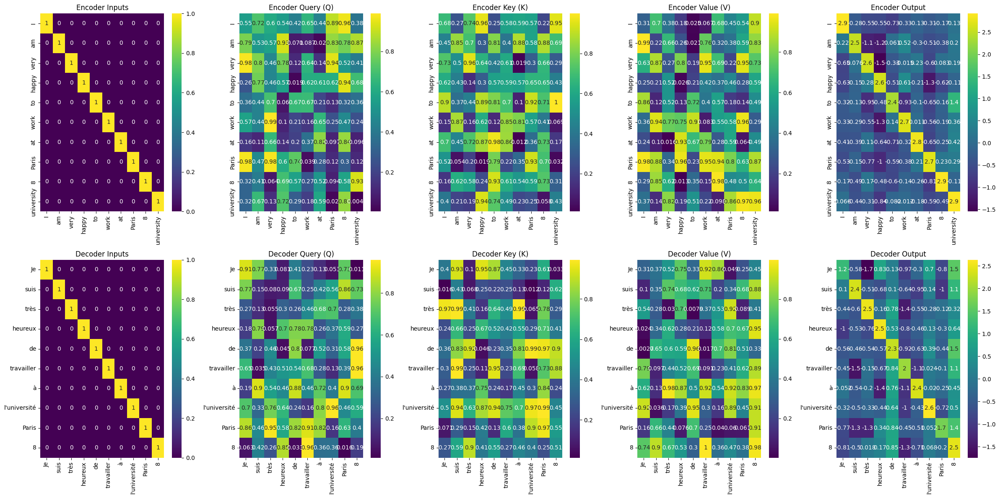

Encoder Sentence: ['I', 'am', 'very', 'happy', 'to', 'work', 'at', 'Paris', '8', 'university']

Encoder Inputs:
 [[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]

Encoder Query (Q):
 [[0.5488135  0.71518937 0.60276338 0.54488318 0.4236548  0.64589411
  0.43758721 0.891773   0.96366276 0.38344152]
 [0.79172504 0.52889492 0.56804456 0.92559664 0.07103606 0.0871293
  0.0202184  0.83261985 0.77815675 0.87001215]
 [0.97861834 0.79915856 0.46147936 0.78052918 0.11827443 0.63992102
  0.14335329 0.94466892 0.52184832 0.41466194]
 [0.26455561 0.77423369 0.45615033 0.56843395 0.0187898  0.6176355
  0.61209572 0.616934   0.94374808 0.6818203 ]
 [0.3595079  0.43703195 0.6976312  0.06022547 0.66676672 0.67063787
  0.21038

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Softmax function
def softmax(x):
    return np.exp(x) / np.sum(np.exp(x), axis=-1, keepdims=True)

# Layer normalization function
def layer_norm(x):
    return (x - np.mean(x, axis=-1, keepdims=True)) / np.std(x, axis=-1, keepdims=True)

# Tokenize the sentences
encoder_sentence = "I am very happy to work at Paris 8 university".split()
decoder_sentence = "Je suis très heureux de travailler à l'université Paris 8".split()

# Vocabulary sizes
encoder_vocab_size = len(encoder_sentence)
decoder_vocab_size = len(decoder_sentence)

# Create one-hot embeddings for each word
encoder_word_to_index = {word: idx for idx, word in enumerate(encoder_sentence)}
decoder_word_to_index = {word: idx for idx, word in enumerate(decoder_sentence)}
encoder_embeddings = np.eye(encoder_vocab_size)
decoder_embeddings = np.eye(decoder_vocab_size)

# Convert sentences to sequences of embeddings
encoder_inputs = np.array([encoder_embeddings[encoder_word_to_index[word]] for word in encoder_sentence])
decoder_inputs = np.array([decoder_embeddings[decoder_word_to_index[word]] for word in decoder_sentence])

# Initialize weights for Query, Key, Value, and Feed-Forward matrices
np.random.seed(0)
Wq_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)
Wk_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)
Wv_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)

Wq_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)
Wk_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)
Wv_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)

W1_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)  # Feed-Forward layer 1 weights for encoder
W2_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)  # Feed-Forward layer 2 weights for encoder

W1_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)  # Feed-Forward layer 1 weights for decoder
W2_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)  # Feed-Forward layer 2 weights for decoder

# Encoder Self-Attention Layer
Q_encoder = np.dot(encoder_inputs, Wq_encoder)
K_encoder = np.dot(encoder_inputs, Wk_encoder)
V_encoder = np.dot(encoder_inputs, Wv_encoder)

scores_encoder = np.dot(Q_encoder, K_encoder.T) / np.sqrt(K_encoder.shape[1])
attention_weights_encoder = softmax(scores_encoder)
attention_output_encoder = np.dot(attention_weights_encoder, V_encoder)

# Add & Norm Layer (Encoder Self-Attention Output + Inputs)
attention_output_encoder = layer_norm(attention_output_encoder + encoder_inputs)

# Encoder Feed-Forward Layer
ffn_output_encoder = np.dot(attention_output_encoder, W1_encoder)
ffn_output_encoder = np.maximum(0, ffn_output_encoder)  # ReLU activation
ffn_output_encoder = np.dot(ffn_output_encoder, W2_encoder)

# Add & Norm Layer (Feed-Forward Output + Self-Attention Output)
encoder_output = layer_norm(ffn_output_encoder + attention_output_encoder)

# Decoder Self-Attention Layer
Q_decoder = np.dot(decoder_inputs, Wq_decoder)
K_decoder = np.dot(decoder_inputs, Wk_decoder)
V_decoder = np.dot(decoder_inputs, Wv_decoder)

scores_decoder = np.dot(Q_decoder, K_decoder.T) / np.sqrt(K_decoder.shape[1])
attention_weights_decoder = softmax(scores_decoder)
attention_output_decoder = np.dot(attention_weights_decoder, V_decoder)

# Add & Norm Layer (Decoder Self-Attention Output + Inputs)
attention_output_decoder = layer_norm(attention_output_decoder + decoder_inputs)

# Decoder Cross-Attention Layer (using encoder outputs)
Q_cross = np.dot(attention_output_decoder, Wq_decoder)
K_cross = np.dot(encoder_output, Wk_encoder)
V_cross = np.dot(encoder_output, Wv_encoder)

scores_cross = np.dot(Q_cross, K_cross.T) / np.sqrt(K_cross.shape[1])
attention_weights_cross = softmax(scores_cross)
cross_attention_output = np.dot(attention_weights_cross, V_cross)

# Add & Norm Layer (Cross-Attention Output + Decoder Self-Attention Output)
cross_attention_output = layer_norm(cross_attention_output + attention_output_decoder)

# Decoder Feed-Forward Layer
ffn_output_decoder = np.dot(cross_attention_output, W1_decoder)
ffn_output_decoder = np.maximum(0, ffn_output_decoder)  # ReLU activation
ffn_output_decoder = np.dot(ffn_output_decoder, W2_decoder)

# Add & Norm Layer (Feed-Forward Output + Cross-Attention Output)
decoder_output = layer_norm(ffn_output_decoder + cross_attention_output)

# Visualization
plt.figure(figsize=(24, 12))

# Plotting the encoder inputs
plt.subplot(2, 5, 1)
sns.heatmap(encoder_inputs, annot=True, cmap='viridis', xticklabels=encoder_sentence, yticklabels=encoder_sentence)
plt.title('Encoder Inputs')

# Plotting encoder Query (Q) matrix
plt.subplot(2, 5, 2)
sns.heatmap(Q_encoder, annot=True, cmap='viridis', xticklabels=encoder_sentence, yticklabels=encoder_sentence)
plt.title('Encoder Query (Q)')

# Plotting encoder Key (K) matrix
plt.subplot(2, 5, 3)
sns.heatmap(K_encoder, annot=True, cmap='viridis', xticklabels=encoder_sentence, yticklabels=encoder_sentence)
plt.title('Encoder Key (K)')

# Plotting encoder Value (V) matrix
plt.subplot(2, 5, 4)
sns.heatmap(V_encoder, annot=True, cmap='viridis', xticklabels=encoder_sentence, yticklabels=encoder_sentence)
plt.title('Encoder Value (V)')

# Plotting encoder output
plt.subplot(2, 5, 5)
sns.heatmap(encoder_output, annot=True, cmap='viridis', xticklabels=encoder_sentence, yticklabels=encoder_sentence)
plt.title('Encoder Output')

# Plotting the decoder inputs
plt.subplot(2, 5, 6)
sns.heatmap(decoder_inputs, annot=True, cmap='viridis', xticklabels=decoder_sentence, yticklabels=decoder_sentence)
plt.title('Decoder Inputs')

# Plotting decoder Query (Q) matrix
plt.subplot(2, 5, 7)
sns.heatmap(Q_decoder, annot=True, cmap='viridis', xticklabels=decoder_sentence, yticklabels=decoder_sentence)
plt.title('Decoder Query (Q)')

# Plotting decoder Key (K) matrix
plt.subplot(2, 5, 8)
sns.heatmap(K_decoder, annot=True, cmap='viridis', xticklabels=decoder_sentence, yticklabels=decoder_sentence)
plt.title('Decoder Key (K)')

# Plotting decoder Value (V) matrix
plt.subplot(2, 5, 9)
sns.heatmap(V_decoder, annot=True, cmap='viridis', xticklabels=decoder_sentence, yticklabels=decoder_sentence)
plt.title('Decoder Value (V)')

# Plotting decoder output
plt.subplot(2, 5, 10)
sns.heatmap(decoder_output, annot=True, cmap='viridis', xticklabels=decoder_sentence, yticklabels=decoder_sentence)
plt.title('Decoder Output')

plt.tight_layout()
plt.show()

print("Encoder Sentence:", encoder_sentence)
print("\nEncoder Inputs:\n", encoder_inputs)
print("\nEncoder Query (Q):\n", Q_encoder)
print("\nEncoder Key (K):\n", K_encoder)
print("\nEncoder Value (V):\n", V_encoder)
print("\nEncoder Output:\n", encoder_output)

print("\nDecoder Sentence:", decoder_sentence)
print("\nDecoder Inputs:\n", decoder_inputs)
print("\nDecoder Query (Q):\n", Q_decoder)
print("\nDecoder Key (K):\n", K_decoder)
print("\nDecoder Value (V):\n", V_decoder)
print("\nDecoder Output:\n", decoder_output)

## Complete Encoder-Decoder Implementation Using Multi-Head Self-Attention : A transformer !

This encoder-decoder implementation with multi-head self-attention includes both self-attention and cross-attention mechanisms, residual connections, and layer normalization, demonstrating how the input sentence is transformed and how the decoder attends to the encoder's output to generate the final result. The multi-head attention mechanism allows the model to focus on different parts of the input sentence simultaneously, capturing more complex relationships and context.

1. Tokenization and Embedding

 - Tokenization: Both the source (encoder) sentence "I am very happy to work at Paris 8 university" and the target (decoder) sentence "Je suis très heureux de travailler à l'université Paris 8" are tokenized into individual words.

 - Embedding: Each word is converted into a one-hot vector representation. This simple embedding method is used to map each word to a unique vector.

2. Initialize Weights

 - Random weights are initialized for the Query (Q), Key (K), and Value (V) matrices for both the encoder and decoder, as well as for the feed-forward neural network layers. These weights are necessary for transforming the input embeddings during self-attention and feed-forward processes.

3. Multi-Head Self-Attention

 - Function Definition: The multi_head_attention function splits Q, K, and V matrices into multiple heads, performs self-attention on each head independently, and concatenates the outputs.

4. Encoder

 - Multi-Head Self-Attention Layer: The input embeddings are transformed using the Q, K, and V matrices. The multi_head_attention function is used to compute the self-attention output across multiple heads.

 - Add & Norm Layer (Self-Attention): Residual connections are added to the self-attention output, and layer normalization is applied.

 - Feed-Forward Layer: The output of the self-attention layer is passed through a feed-forward neural network with ReLU activation.

 - Add & Norm Layer (Feed-Forward): Residual connections are added to the feed-forward output, and layer normalization is applied, resulting in the final encoder output.

5. Decoder

 - Multi-Head Self-Attention Layer: The decoder inputs are transformed using their own Q, K, and V matrices. The multi_head_attention function is used to compute the self-attention output across multiple heads for the decoder.

 - Add & Norm Layer (Self-Attention): Residual connections are added to the self-attention output, and layer normalization is applied.

 - Cross-Attention Layer: The decoder's self-attention output interacts with the encoder's output using Q matrices from the decoder and K, V matrices from the encoder. The multi_head_attention function is used to compute the cross-attention output across multiple heads, allowing the decoder to attend to the encoder's outputs.

 - Add & Norm Layer (Cross-Attention): Residual connections are added to the cross-attention output, and layer normalization is applied.

 - Feed-Forward Layer: The output of the cross-attention layer is passed through a feed-forward neural network with ReLU activation.

 - Add & Norm Layer (Feed-Forward): Residual connections are added to the feed-forward output, and layer normalization is applied, resulting in the final decoder output.

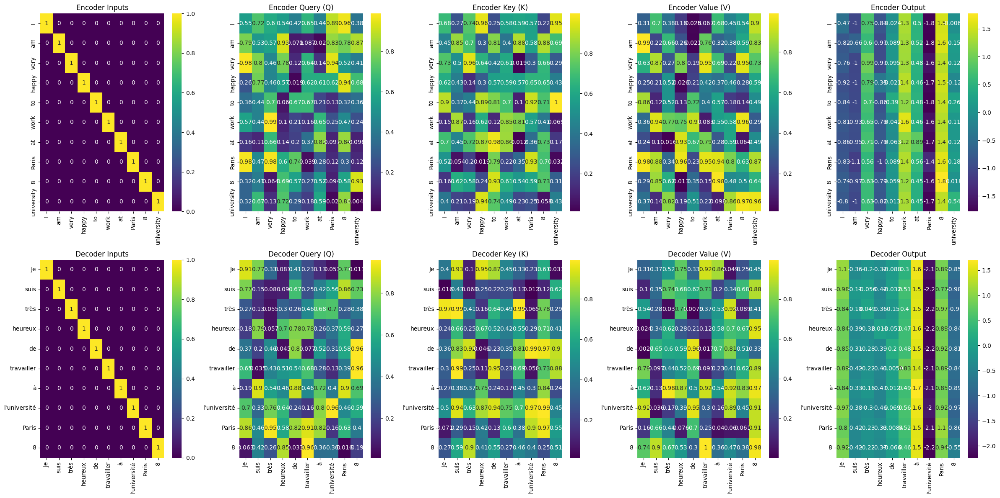

Encoder Sentence: ['I', 'am', 'very', 'happy', 'to', 'work', 'at', 'Paris', '8', 'university']

Encoder Inputs:
 [[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]

Encoder Query (Q):
 [[0.5488135  0.71518937 0.60276338 0.54488318 0.4236548  0.64589411
  0.43758721 0.891773   0.96366276 0.38344152]
 [0.79172504 0.52889492 0.56804456 0.92559664 0.07103606 0.0871293
  0.0202184  0.83261985 0.77815675 0.87001215]
 [0.97861834 0.79915856 0.46147936 0.78052918 0.11827443 0.63992102
  0.14335329 0.94466892 0.52184832 0.41466194]
 [0.26455561 0.77423369 0.45615033 0.56843395 0.0187898  0.6176355
  0.61209572 0.616934   0.94374808 0.6818203 ]
 [0.3595079  0.43703195 0.6976312  0.06022547 0.66676672 0.67063787
  0.21038

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Softmax function
def softmax(x):
    return np.exp(x) / np.sum(np.exp(x), axis=-1, keepdims=True)

# Layer normalization function
def layer_norm(x):
    return (x - np.mean(x, axis=-1, keepdims=True)) / np.std(x, axis=-1, keepdims=True)

# Multi-head attention function
def multi_head_attention(Q, K, V, num_heads):
    d_model = Q.shape[-1] # Get the embedding dimension
    d_k = d_model // num_heads # Calculate the dimension of each head
    
    # Linear transformations for each head
    Q_heads = [np.dot(Q, np.random.rand(d_model, d_k)) for _ in range(num_heads)] 
    K_heads = [np.dot(K, np.random.rand(d_model, d_k)) for _ in range(num_heads)]
    V_heads = [np.dot(V, np.random.rand(d_model, d_k)) for _ in range(num_heads)]
    
    attention_outputs = []
    for i in range(num_heads):
        scores = np.dot(Q_heads[i], K_heads[i].T) / np.sqrt(d_k)
        attention_weights = softmax(scores)
        attention_output = np.dot(attention_weights, V_heads[i])
        attention_outputs.append(attention_output)
    
    # Concatenate all the heads
    concatenated_output = np.concatenate(attention_outputs, axis=-1)
    
    # Linear transformation to map the concatenated output back to the original dimension
    output = np.dot(concatenated_output, np.random.rand(concatenated_output.shape[-1], d_model))
    return output

# Tokenize the sentences
encoder_sentence = "I am very happy to work at Paris 8 university".split()
decoder_sentence = "Je suis très heureux de travailler à l'université Paris 8".split()

# Vocabulary sizes
encoder_vocab_size = len(encoder_sentence)
decoder_vocab_size = len(decoder_sentence)

# Create one-hot embeddings for each word
encoder_word_to_index = {word: idx for idx, word in enumerate(encoder_sentence)}
decoder_word_to_index = {word: idx for idx, word in enumerate(decoder_sentence)}
encoder_embeddings = np.eye(encoder_vocab_size)
decoder_embeddings = np.eye(decoder_vocab_size)

# Convert sentences to sequences of embeddings
encoder_inputs = np.array([encoder_embeddings[encoder_word_to_index[word]] for word in encoder_sentence])
decoder_inputs = np.array([decoder_embeddings[decoder_word_to_index[word]] for word in decoder_sentence])

# Initialize weights for Query, Key, Value, and Feed-Forward matrices
num_heads = 4
np.random.seed(0)
Wq_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)
Wk_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)
Wv_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)

Wq_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)
Wk_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)
Wv_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)

W1_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)  # Feed-Forward layer 1 weights for encoder
W2_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)  # Feed-Forward layer 2 weights for encoder

W1_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)  # Feed-Forward layer 1 weights for decoder
W2_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)  # Feed-Forward layer 2 weights for decoder

# Encoder Multi-Head Self-Attention Layer
Q_encoder = np.dot(encoder_inputs, Wq_encoder)
K_encoder = np.dot(encoder_inputs, Wk_encoder)
V_encoder = np.dot(encoder_inputs, Wv_encoder)

attention_output_encoder = multi_head_attention(Q_encoder, K_encoder, V_encoder, num_heads)

# Add & Norm Layer (Encoder Self-Attention Output + Inputs)
attention_output_encoder = layer_norm(attention_output_encoder + encoder_inputs)

# Encoder Feed-Forward Layer
ffn_output_encoder = np.dot(attention_output_encoder, W1_encoder)
ffn_output_encoder = np.maximum(0, ffn_output_encoder)  # ReLU activation
ffn_output_encoder = np.dot(ffn_output_encoder, W2_encoder)

# Add & Norm Layer (Feed-Forward Output + Self-Attention Output)
encoder_output = layer_norm(ffn_output_encoder + attention_output_encoder)

# Decoder Multi-Head Self-Attention Layer
Q_decoder = np.dot(decoder_inputs, Wq_decoder)
K_decoder = np.dot(decoder_inputs, Wk_decoder)
V_decoder = np.dot(decoder_inputs, Wv_decoder)

attention_output_decoder = multi_head_attention(Q_decoder, K_decoder, V_decoder, num_heads)

# Add & Norm Layer (Decoder Self-Attention Output + Inputs)
attention_output_decoder = layer_norm(attention_output_decoder + decoder_inputs)

# Decoder Cross-Attention Layer (using encoder outputs)
Q_cross = np.dot(attention_output_decoder, Wq_decoder)
K_cross = np.dot(encoder_output, Wk_encoder)
V_cross = np.dot(encoder_output, Wv_encoder)

cross_attention_output = multi_head_attention(Q_cross, K_cross, V_cross, num_heads)

# Add & Norm Layer (Cross-Attention Output + Decoder Self-Attention Output)
cross_attention_output = layer_norm(cross_attention_output + attention_output_decoder)

# Decoder Feed-Forward Layer
ffn_output_decoder = np.dot(cross_attention_output, W1_decoder)
ffn_output_decoder = np.maximum(0, ffn_output_decoder)  # ReLU activation
ffn_output_decoder = np.dot(ffn_output_decoder, W2_decoder)

# Add & Norm Layer (Feed-Forward Output + Cross-Attention Output)
decoder_output = layer_norm(ffn_output_decoder + cross_attention_output)

# Visualization
plt.figure(figsize=(24, 12))

# Plotting the encoder inputs
plt.subplot(2, 5, 1)
sns.heatmap(encoder_inputs, annot=True, cmap='viridis', xticklabels=encoder_sentence, yticklabels=encoder_sentence)
plt.title('Encoder Inputs')

# Plotting encoder Query (Q) matrix
plt.subplot(2, 5, 2)
sns.heatmap(Q_encoder, annot=True, cmap='viridis', xticklabels=encoder_sentence, yticklabels=encoder_sentence)
plt.title('Encoder Query (Q)')

# Plotting encoder Key (K) matrix
plt.subplot(2, 5, 3)
sns.heatmap(K_encoder, annot=True, cmap='viridis', xticklabels=encoder_sentence, yticklabels=encoder_sentence)
plt.title('Encoder Key (K)')

# Plotting encoder Value (V) matrix
plt.subplot(2, 5, 4)
sns.heatmap(V_encoder, annot=True, cmap='viridis', xticklabels=encoder_sentence, yticklabels=encoder_sentence)
plt.title('Encoder Value (V)')

# Plotting encoder output
plt.subplot(2, 5, 5)
sns.heatmap(encoder_output, annot=True, cmap='viridis', xticklabels=encoder_sentence, yticklabels=encoder_sentence)
plt.title('Encoder Output')

# Plotting the decoder inputs
plt.subplot(2, 5, 6)
sns.heatmap(decoder_inputs, annot=True, cmap='viridis', xticklabels=decoder_sentence, yticklabels=decoder_sentence)
plt.title('Decoder Inputs')

# Plotting decoder Query (Q) matrix
plt.subplot(2, 5, 7)
sns.heatmap(Q_decoder, annot=True, cmap='viridis', xticklabels=decoder_sentence, yticklabels=decoder_sentence)
plt.title('Decoder Query (Q)')

# Plotting decoder Key (K) matrix
plt.subplot(2, 5, 8)
sns.heatmap(K_decoder, annot=True, cmap='viridis', xticklabels=decoder_sentence, yticklabels=decoder_sentence)
plt.title('Decoder Key (K)')

# Plotting decoder Value (V) matrix
plt.subplot(2, 5, 9)
sns.heatmap(V_decoder, annot=True, cmap='viridis', xticklabels=decoder_sentence, yticklabels=decoder_sentence)
plt.title('Decoder Value (V)')

# Plotting decoder output
plt.subplot(2, 5, 10)
sns.heatmap(decoder_output, annot=True, cmap='viridis', xticklabels=decoder_sentence, yticklabels=decoder_sentence)
plt.title('Decoder Output')

plt.tight_layout()
plt.show()

print("Encoder Sentence:", encoder_sentence)
print("\nEncoder Inputs:\n", encoder_inputs)
print("\nEncoder Query (Q):\n", Q_encoder)
print("\nEncoder Key (K):\n", K_encoder)
print("\nEncoder Value (V):\n", V_encoder)
print("\nEncoder Output:\n", encoder_output)

print("\nDecoder Sentence:", decoder_sentence)
print("\nDecoder Inputs:\n", decoder_inputs)
print("\nDecoder Query (Q):\n", Q_decoder)
print("\nDecoder Key (K):\n", K_decoder)
print("\nDecoder Value (V):\n", V_decoder)
print("\nDecoder Output:\n", decoder_output)

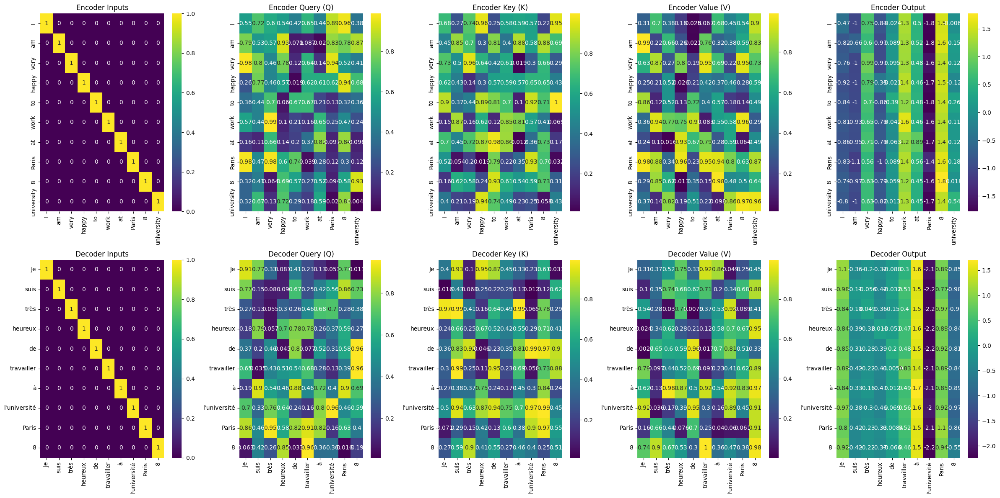

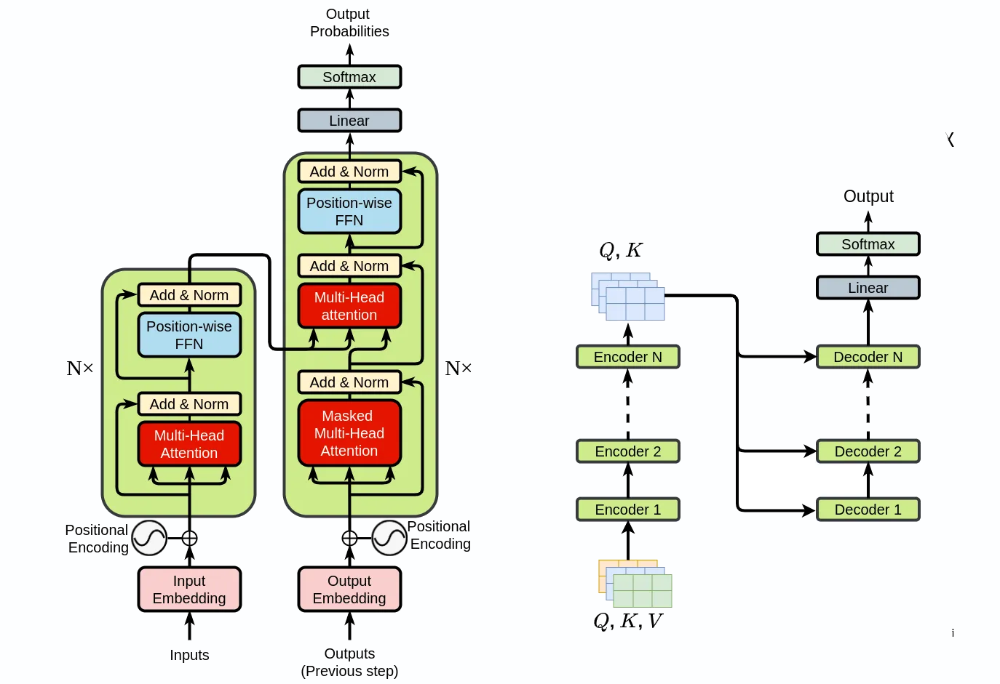

In [2]:
# By Abdelaziz LOUNES, Univ. Paris 8

## Exercices 

### Exercice 1 : Self-Attention mechanism: basic implementation

- Modify the `input_sequence` to include an additional dimension and write a function to handle this new input shape. Compute and visualize the query, key, and value matrices for this modified sequence.
- Change the number of attention heads to 2 and implement the multi-head attention mechanism. Compute and visualize the attention weights and output. Compare the results with single-head attention.
- Experiment with different scaling factors for the attention scores. Instead of dividing by the square root of the key dimension, try different constants and observe the effects on the attention weights and output. Visualize and discuss the impact.

raw input_sequence shape (seq_len, feat_dim, extra): (3, 4, 2)
flattened tokens shape (seq_len, token_vec_dim): (3, 8)


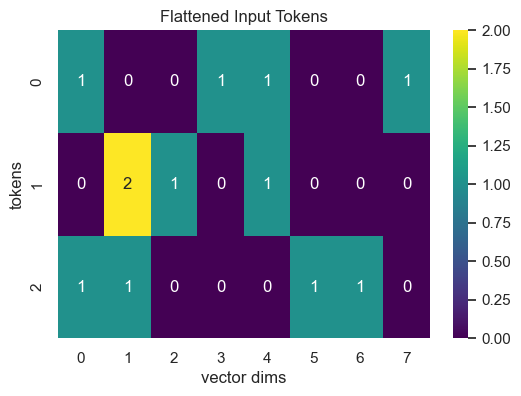

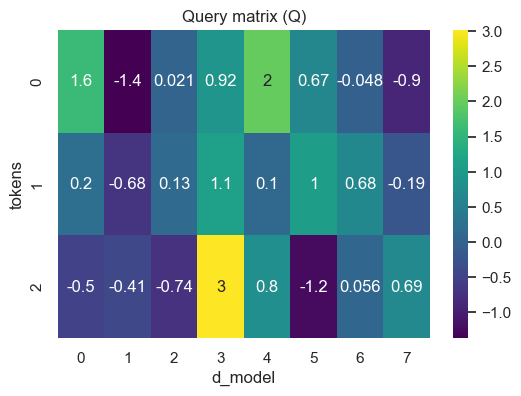

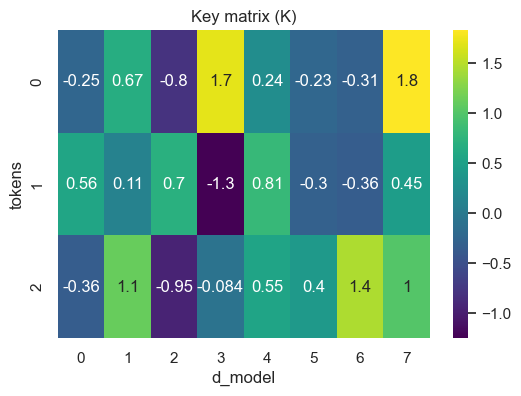

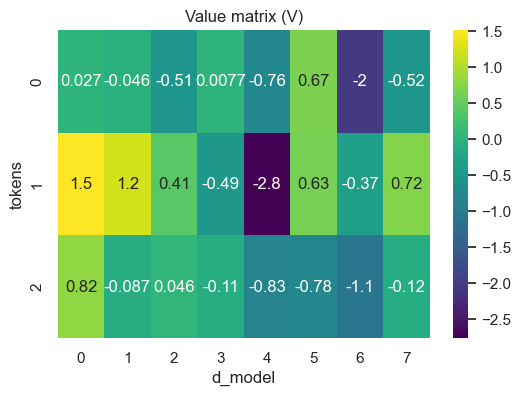

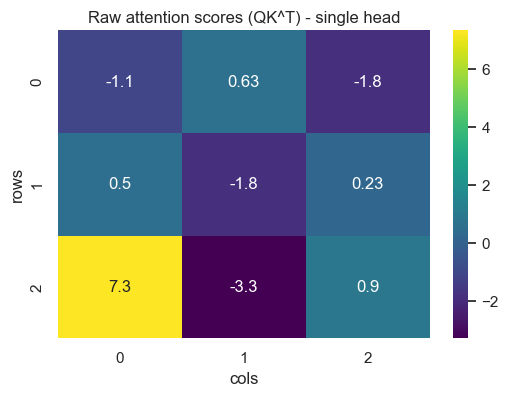

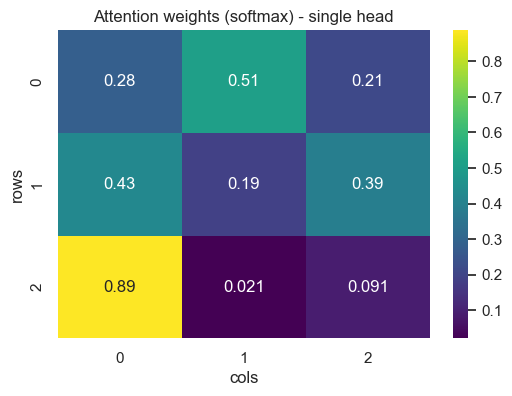

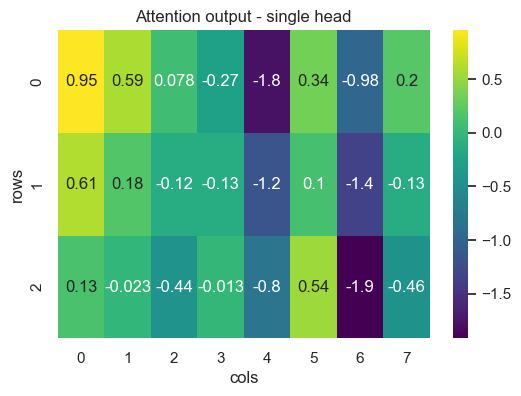

Single-head attention output shape: (3, 8)


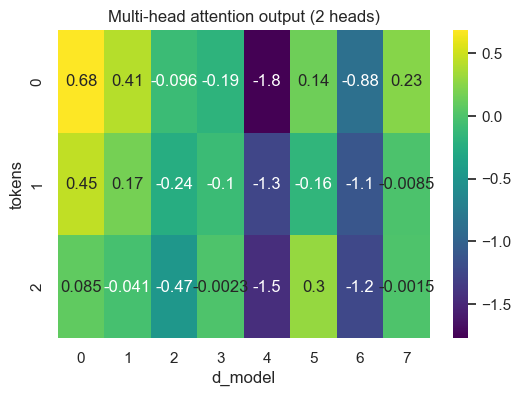

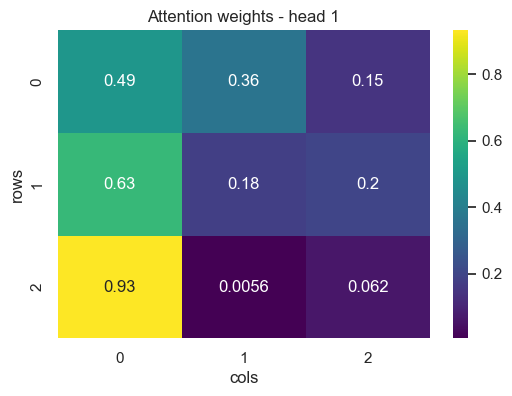

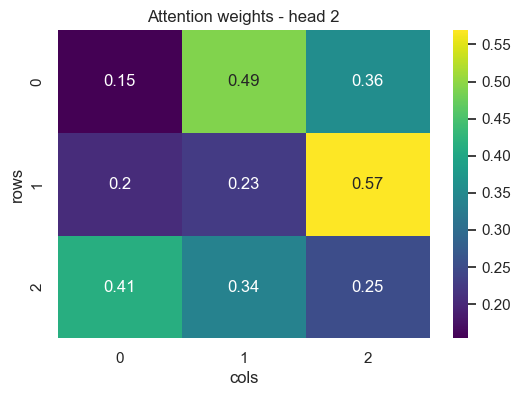

Multi-head attention output shape: (3, 8)
--- scale = 1.0 ---


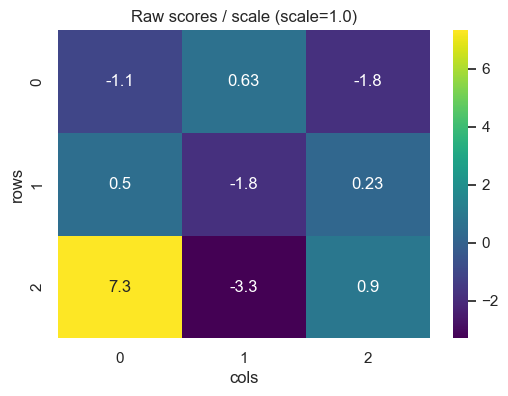

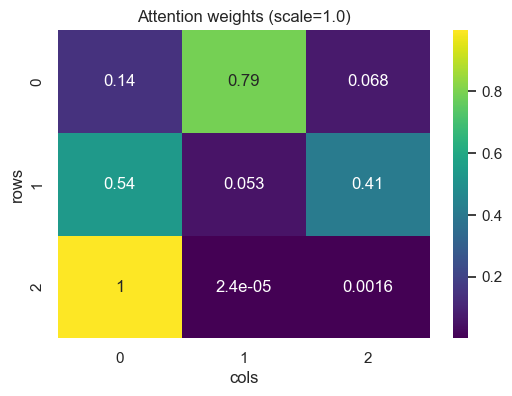

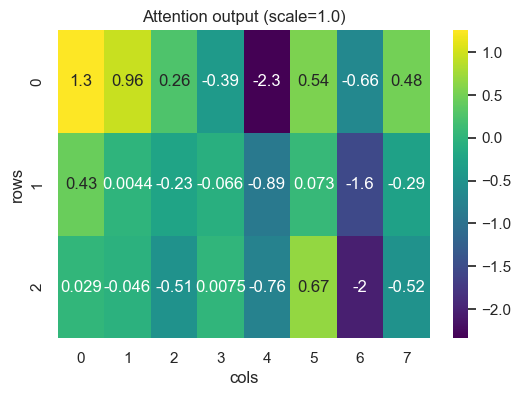

--- scale = 2.0 ---


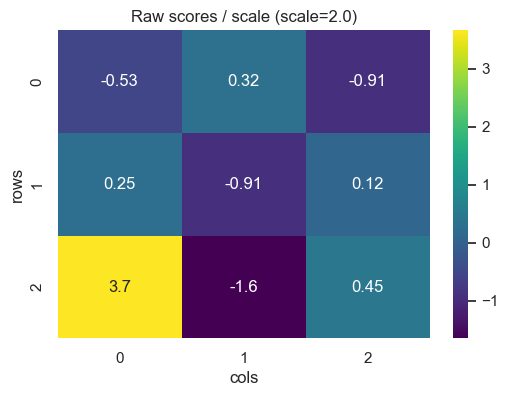

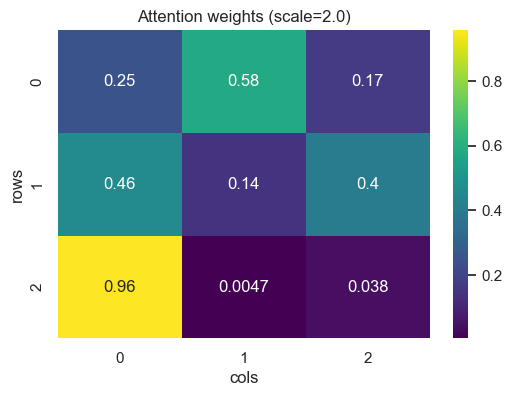

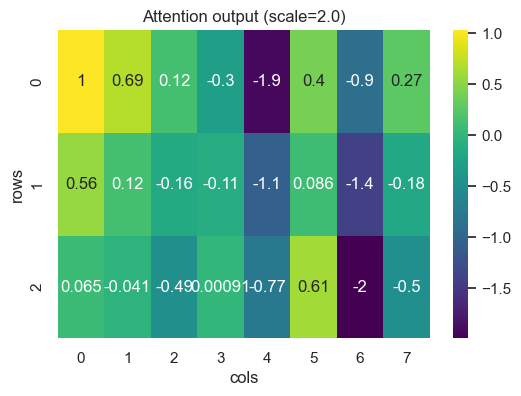

--- scale = 2.0 ---


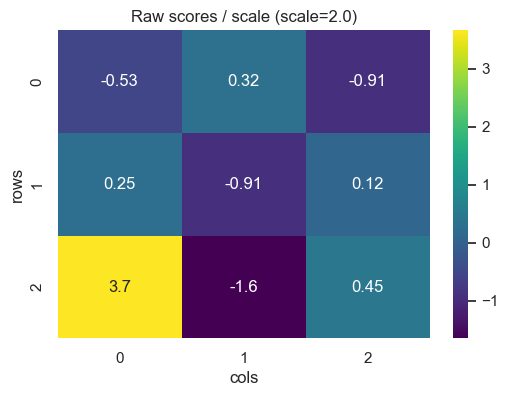

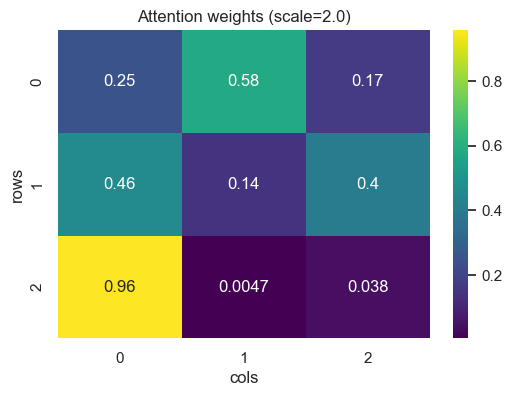

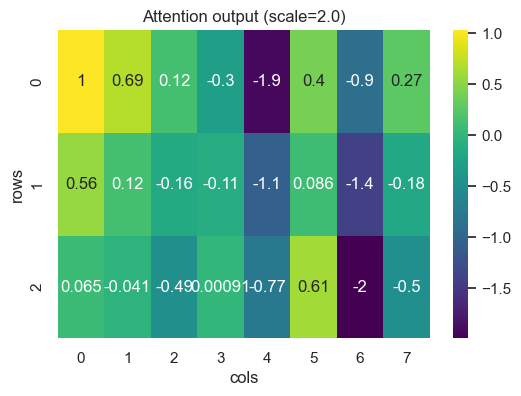

--- scale = 8.0 ---


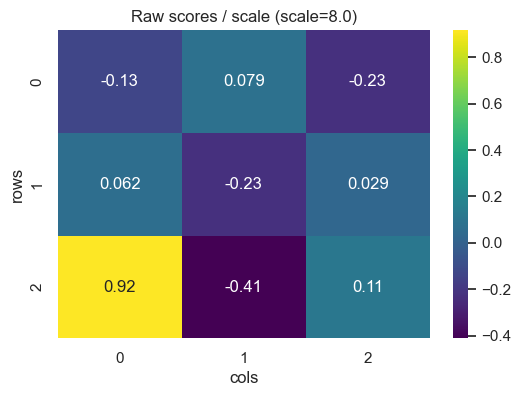

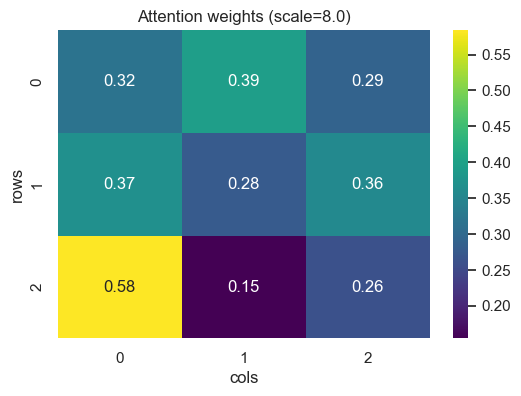

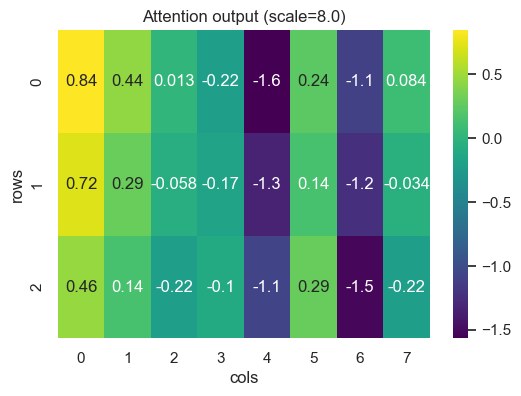

L2 difference between single-head (scaled) output and 2-head concatenated output: 1.4084552409078
Exercise 1 completed: You can modify the input_sequence above or the scale list to experiment further.


In [ ]:
# 1) Handles an input sequence with an extra feature dimension.
# 2) Implements single-head attention.
# 3) Implements a simple 2-head multi-head attention (manual split).
# 4) Runs experiments with different scaling factors.

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set()  # nicer plot style

def plot_matrix(mat, title, xlabel='cols', ylabel='rows', cmap='viridis'):
    plt.figure(figsize=(6, 4))
    sns.heatmap(np.array(mat), annot=True, cmap=cmap)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

# ------------------------
# Part A: Prepare input with an extra dimension
# Original input_sequence had shape (sequence_length, feature_dim).
# We'll add an extra dimension per element, e.g. shape (sequence_length, feature_dim, extra)
# For simplicity we'll treat the last axis as additional channels and then flatten
# each token to a vector before applying linear maps.
# ------------------------
# Example: 3 tokens, original 4 features, add extra dimension of size 2 -> (3,4,2)
input_sequence = np.array([[[1,0],[0,1],[1,0],[0,1]],
                           [[0,2],[1,0],[1,0],[0,0]],
                           [[1,1],[0,0],[0,1],[1,0]]], dtype=float)
# Explain shape to beginner
print('raw input_sequence shape (seq_len, feat_dim, extra):', input_sequence.shape)

# Flatten last two dimensions per token to get token vectors of size feat_dim*extra
seq_len = input_sequence.shape[0]
token_vec_dim = input_sequence.shape[1] * input_sequence.shape[2]
tokens = input_sequence.reshape(seq_len, token_vec_dim)
print('flattened tokens shape (seq_len, token_vec_dim):', tokens.shape)
plot_matrix(tokens, 'Flattened Input Tokens', xlabel='vector dims', ylabel='tokens')

# ------------------------
# Linear maps for Q, K, V (simple dense layers implemented with matrix multiply)
# We'll use small random weights so results are reproducible.
# ------------------------
np.random.seed(0)
d_model = token_vec_dim  # we'll keep output dims same as input for simplicity
Wq = np.random.randn(token_vec_dim, d_model) * 0.5
Wk = np.random.randn(token_vec_dim, d_model) * 0.5
Wv = np.random.randn(token_vec_dim, d_model) * 0.5

def linear(x, W):
    # x shape (seq_len, in_dim); W shape (in_dim, out_dim) -> returns (seq_len, out_dim)
    return x.dot(W)

# Compute Q, K, V
Q = linear(tokens, Wq)
K = linear(tokens, Wk)
V = linear(tokens, Wv)

plot_matrix(Q, 'Query matrix (Q)', xlabel='d_model', ylabel='tokens')
plot_matrix(K, 'Key matrix (K)', xlabel='d_model', ylabel='tokens')
plot_matrix(V, 'Value matrix (V)', xlabel='d_model', ylabel='tokens')

# ------------------------
# Single-head attention implementation
# ------------------------
def scaled_dot_product_attention(Q, K, V, scale=None):
    # Q,K,V are (seq_len, d_model)
    scores = Q.dot(K.T)  # (seq_len, seq_len)
    if scale is None:
        # default scale: sqrt(d_k) like the paper (use d_model here as d_k)
        scale = np.sqrt(K.shape[1])
    scores_scaled = scores / scale
    # numerical stability: subtract max per row before softmax
    scores_stable = scores_scaled - np.max(scores_scaled, axis=-1, keepdims=True)
    weights = np.exp(scores_stable) / np.sum(np.exp(scores_stable), axis=-1, keepdims=True)
    output = weights.dot(V)
    return output, weights, scores

att_output, att_weights, att_scores = scaled_dot_product_attention(Q, K, V)
plot_matrix(att_scores, 'Raw attention scores (QK^T) - single head')
plot_matrix(att_weights, 'Attention weights (softmax) - single head')
plot_matrix(att_output, 'Attention output - single head')

print('Single-head attention output shape:', att_output.shape)

# ------------------------
# Multi-head attention (2 heads) - simple manual split along feature dim
# We'll split d_model into 2 heads of size d_model/2 (assume divisible)
# For each head: compute Q,K,V with different linear maps (we simulate this by slicing the Q,K,V computed above)
# Then compute attention per-head and concatenate outputs.
# ------------------------
num_heads = 2
assert d_model % num_heads == 0, 'd_model must be divisible by num_heads for this simple split'
d_k = d_model // num_heads

def multi_head_attention(Q, K, V, num_heads, scale=None):
    heads_outputs = []
    heads_weights = []
    for h in range(num_heads):
        # slice per-head subspace
        q_h = Q[:, h*d_k:(h+1)*d_k]
        k_h = K[:, h*d_k:(h+1)*d_k]
        v_h = V[:, h*d_k:(h+1)*d_k]
        out_h, weights_h, scores_h = scaled_dot_product_attention(q_h, k_h, v_h, scale=scale)
        heads_outputs.append(out_h)
        heads_weights.append(weights_h)
    # concatenate along feature dim
    concat = np.concatenate(heads_outputs, axis=-1)
    return concat, heads_weights

mha_output, mha_weights = multi_head_attention(Q, K, V, num_heads=2)
plot_matrix(mha_output, 'Multi-head attention output (2 heads)', xlabel='d_model', ylabel='tokens')
# plot per-head weights
for i, w in enumerate(mha_weights):
    plot_matrix(w, f'Attention weights - head {i+1}')

print('Multi-head attention output shape:', mha_output.shape)

# ------------------------
# Part C: Scaling experiments
# Try different scaling factors and compare the attention weights and outputs.
# We'll try: 1) no scaling (scale=1), 2) paper scaling sqrt(d_k), 3) larger and smaller constants.
# ------------------------
scales = [1.0, np.sqrt(d_k), d_k/2.0, d_k*2.0]  # a few choices to demonstrate behaviour
scale_results = {}
for s in scales:
    out_s, weights_s, scores_s = scaled_dot_product_attention(Q, K, V, scale=s)
    scale_results[s] = (out_s, weights_s, scores_s)
    print(f'--- scale = {s} ---')
    plot_matrix(scores_s/s, f'Raw scores / scale (scale={s})')
    plot_matrix(weights_s, f'Attention weights (scale={s})')
    plot_matrix(out_s, f'Attention output (scale={s})')

# Quick numeric comparison between single-head (default scale sqrt(d_k)) and 2-head
default_scale = np.sqrt(d_k)
single_out, _, _ = scaled_dot_product_attention(Q, K, V, scale=default_scale)
# Compute and print the L2 (Euclidean) norm difference between the single-head output and the 2-head output
l2_diff = np.linalg.norm(single_out - mha_output)
print('L2 difference between single-head (scaled) output and 2-head concatenated output:', l2_diff)

print('Exercise 1 completed: You can modify the input_sequence above or the scale list to experiment further.')

### Exercice 2: Self-Attention mechanism: Using a sentence as input

- Change the sentence from "I love tennis" to a longer sentence of your choice. Convert this new sentence into a sequence of embeddings and compute the query, key, and value matrices. Visualize and explain the results.
- Implement a masking mechanism to handle padding tokens in the sentence. Compute the attention scores and apply the mask before softmax. Visualize the attention weights with and without masking and discuss the differences.
- Experiment with different embedding initialization methods. Use random initialization and pre-trained embeddings (e.g., from GloVe or FastText). Compute and visualize the attention scores and outputs for both cases. Compare the results.

Original words (len = 12 ): ['deep', 'learning', 'models', 'can', 'capture', 'complex', 'patterns', 'in', 'data', 'and', 'generalize', 'well']
Padded sequence (len = 16 ): ['deep', 'learning', 'models', 'can', 'capture', 'complex', 'patterns', 'in', 'data', 'and', 'generalize', 'well', '<PAD>', '<PAD>', '<PAD>', '<PAD>']
PAD count: 4


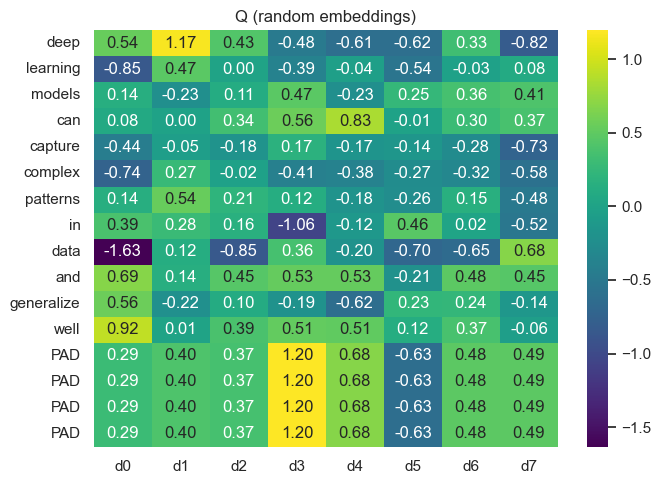

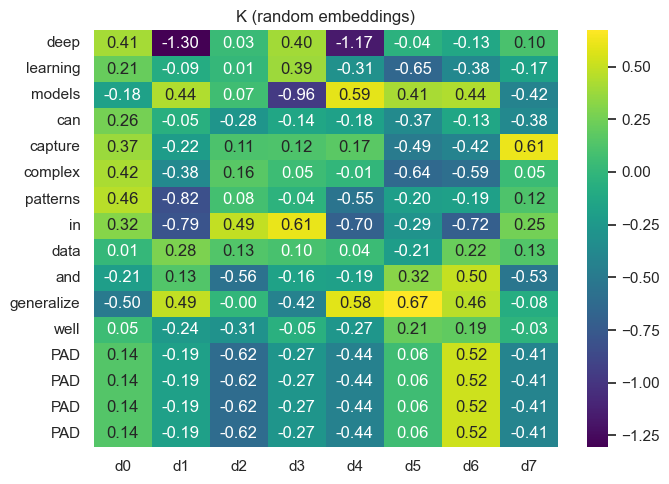

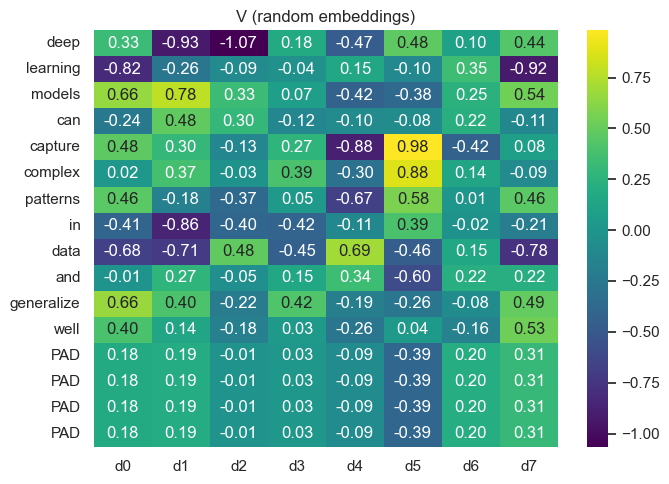

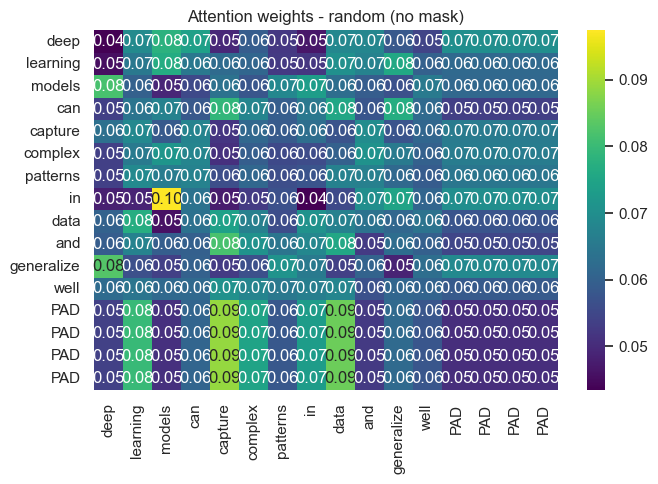

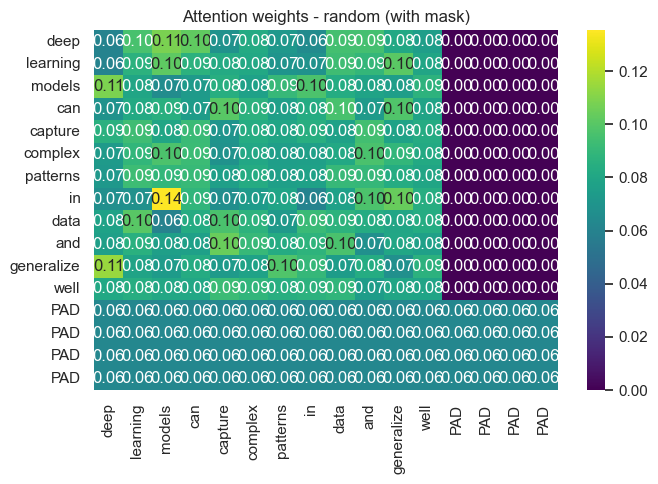

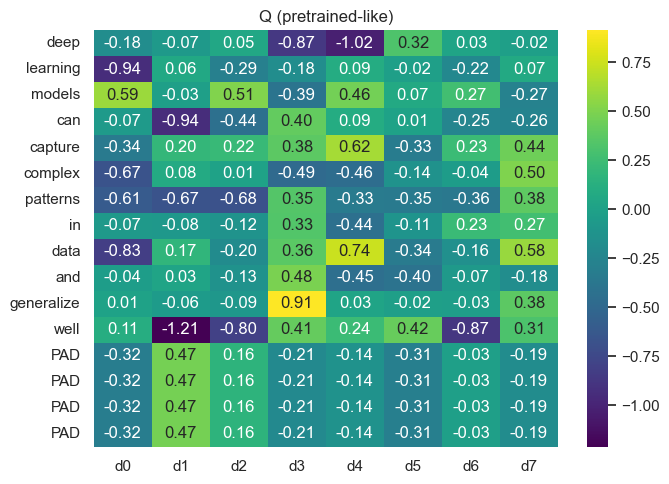

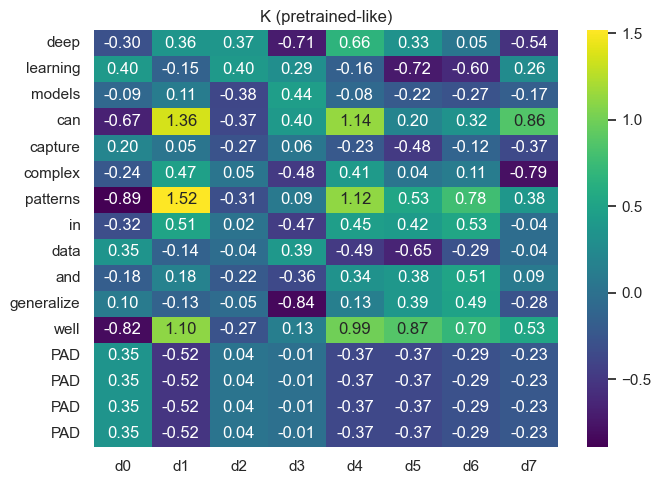

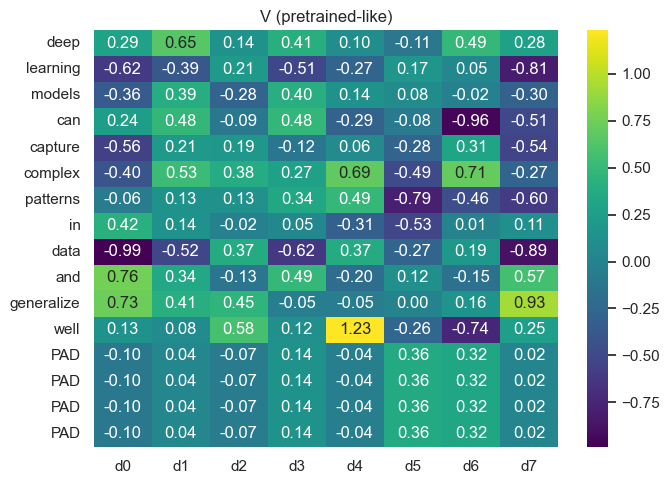

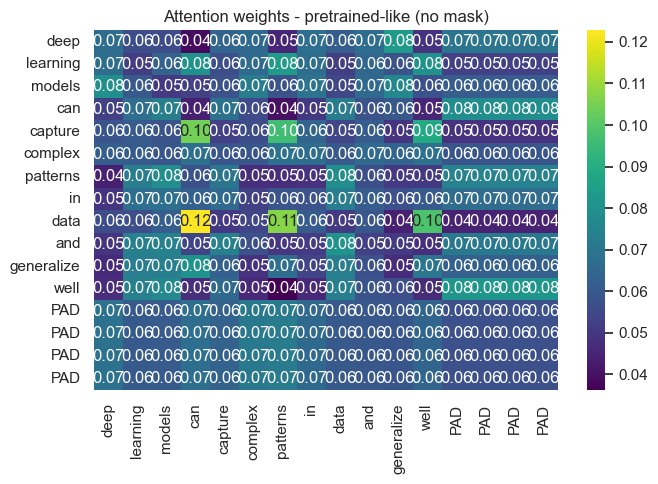

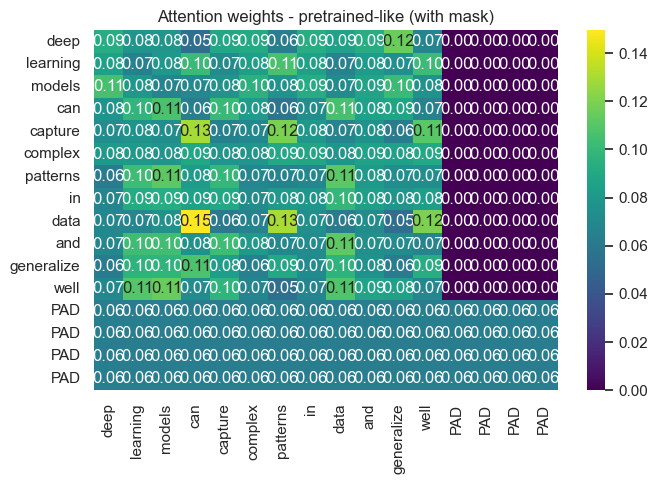


L2 diff (random embeddings) [no-mask vs mask] over first 12 tokens: 0.5569129326420573
L2 diff (pretrained-like) [no-mask vs mask] over first 12 tokens: 0.696387716079793


In [2]:

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

sns.set()

# ---------- Utilities ----------

def softmax(x, axis=-1):
    x = x - np.max(x, axis=axis, keepdims=True)  # numerical stability
    exp_x = np.exp(x)
    return exp_x / np.sum(exp_x, axis=axis, keepdims=True)

def plot_heat(mat, title, xticklabels=None, yticklabels=None, cmap='viridis', fmt='.2f', figsize=(7,5)):
    plt.figure(figsize=figsize)
    sns.heatmap(np.array(mat), annot=True, cmap=cmap,
                xticklabels=xticklabels, yticklabels=yticklabels, fmt=fmt)
    plt.title(title)
    plt.tight_layout()
    plt.show()

# Linear projection (Dense without bias): X @ W
def linear(x, W):
    return x.dot(W)

# Scaled dot-product attention (optionally with mask on (L, L))
# mask: shape (L, L), with True for positions to mask (e.g., PAD) -> set to large negative before softmax

def scaled_dot_product_attention(Q, K, V, scale=None, mask=None):
    # Q, K, V: (L, d)
    scores = Q.dot(K.T)  # (L, L)
    d_k = K.shape[1]
    if scale is None:
        scale = np.sqrt(d_k)
    scores = scores / scale
    if mask is not None:
        scores = np.where(mask, -1e9, scores)
    weights = softmax(scores, axis=-1)  # (L, L)
    output = weights.dot(V)             # (L, d)
    return output, weights, scores

# ---------- Data prep ----------
# Choose a longer sentence (you can change this string and re-run to experiment)
sentence_text = "Deep learning models can capture complex patterns in data and generalize well".lower()
words = sentence_text.split()

# Build vocabulary from words + PAD token
PAD = '<PAD>'
vocab = sorted(set(words)) + [PAD]
word2idx = {w:i for i,w in enumerate(vocab)}

# Padding to a fixed length (force some PADs to demonstrate masking)
max_len = len(words) + 4  # ensure we add some PAD tokens for masking demo
padded_words = words + [PAD]*(max_len - len(words))

# ---------- Embeddings ----------
embed_dim = 8  # small, easy to visualize

# Random embedding (seeded for reproducibility)
np.random.seed(7)
random_embeddings = np.random.randn(len(vocab), embed_dim) * 0.3

# "Pretrained-like" deterministic embeddings (simulated):
# We create deterministic vectors per word using a stable hash -> small random vector.
# This mimics a pre-trained lookup without downloading large models.

def stable_vec_for_word(word, dim=embed_dim, base_seed=1234):
    # Create a deterministic seed from the word
    h = abs(hash(word)) % (10**9)
    rng = np.random.default_rng(base_seed ^ h)
    return rng.normal(loc=0.0, scale=0.3, size=dim)

pretrained_like = np.vstack([stable_vec_for_word(w) for w in vocab])

# Function to build an embedding matrix for our padded sequence

def embed_sequence(words_seq, embeddings_table):
    idxs = [word2idx[w] for w in words_seq]
    return embeddings_table[idxs]

# Build inputs for both embedding strategies
X_rand = embed_sequence(padded_words, random_embeddings)         # (L, d)
X_pre = embed_sequence(padded_words, pretrained_like)            # (L, d)

# ---------- Linear maps for Q/K/V ----------
# We share the same projection weights for both embedding types to compare only embeddings
np.random.seed(0)
Wq = np.random.randn(embed_dim, embed_dim) * 0.5
Wk = np.random.randn(embed_dim, embed_dim) * 0.5
Wv = np.random.randn(embed_dim, embed_dim) * 0.5

# Project to Q/K/V for both cases
Q_rand, K_rand, V_rand = linear(X_rand, Wq), linear(X_rand, Wk), linear(X_rand, Wv)
Q_pre,  K_pre,  V_pre  = linear(X_pre,  Wq), linear(X_pre,  Wk), linear(X_pre,  Wv)

# ---------- Mask construction ----------
# We want to block attention to PAD tokens.
# Typical approach: mask the columns (keys) that are PAD so they never receive attention.
# Also mask the rows (queries) that are PAD so they don’t attend to anything.

is_pad = np.array([w == PAD for w in padded_words])  # (L,)
L = len(padded_words)
# mask matrix: True where we want to mask
mask_keys  = np.tile(is_pad, (L, 1))      # mask columns for PAD keys
mask_query = np.tile(is_pad, (L, 1)).T    # mask rows  for PAD queries
full_mask = np.logical_or(mask_keys, mask_query)  # (L, L)

# ---------- Attention w/o mask vs with mask (Random embeddings) ----------
# Without mask
out_rand_nomask, w_rand_nomask, s_rand_nomask = scaled_dot_product_attention(Q_rand, K_rand, V_rand, scale=None, mask=None)
# With mask
out_rand_mask,   w_rand_mask,   s_rand_mask   = scaled_dot_product_attention(Q_rand, K_rand, V_rand, scale=None, mask=full_mask)

# ---------- Attention w/o mask vs with mask (Pretrained-like embeddings) ----------
out_pre_nomask, w_pre_nomask, s_pre_nomask = scaled_dot_product_attention(Q_pre, K_pre, V_pre, scale=None, mask=None)
out_pre_mask,   w_pre_mask,   s_pre_mask   = scaled_dot_product_attention(Q_pre, K_pre, V_pre, scale=None, mask=full_mask)

# ---------- Visualizations ----------
labels = [w if w != PAD else 'PAD' for w in padded_words]

# Show the sentence and padding
print('Original words (len =', len(words), '):', words)
print('Padded sequence (len =', L, '):', padded_words)
print('PAD count:', int(np.sum(is_pad)))

# Q/K/V for random embeddings
plot_heat(Q_rand, 'Q (random embeddings)', xticklabels=[f'd{i}' for i in range(embed_dim)], yticklabels=labels)
plot_heat(K_rand, 'K (random embeddings)', xticklabels=[f'd{i}' for i in range(embed_dim)], yticklabels=labels)
plot_heat(V_rand, 'V (random embeddings)', xticklabels=[f'd{i}' for i in range(embed_dim)], yticklabels=labels)

# Attention weights without vs with mask (random)
plot_heat(w_rand_nomask, 'Attention weights - random (no mask)', xticklabels=labels, yticklabels=labels)
plot_heat(w_rand_mask,   'Attention weights - random (with mask)', xticklabels=labels, yticklabels=labels)

# Q/K/V for pretrained-like embeddings
plot_heat(Q_pre, 'Q (pretrained-like)', xticklabels=[f'd{i}' for i in range(embed_dim)], yticklabels=labels)
plot_heat(K_pre, 'K (pretrained-like)', xticklabels=[f'd{i}' for i in range(embed_dim)], yticklabels=labels)
plot_heat(V_pre, 'V (pretrained-like)', xticklabels=[f'd{i}' for i in range(embed_dim)], yticklabels=labels)

# Attention weights without vs with mask (pretrained-like)
plot_heat(w_pre_nomask, 'Attention weights - pretrained-like (no mask)', xticklabels=labels, yticklabels=labels)
plot_heat(w_pre_mask,   'Attention weights - pretrained-like (with mask)', xticklabels=labels, yticklabels=labels)

# Quick numeric comparison: L2 diff between outputs (no mask vs mask) for the real (non-PAD) positions
real_len = len(words)
print('\nL2 diff (random embeddings) [no-mask vs mask] over first', real_len, 'tokens:',
      np.linalg.norm(out_rand_nomask[:real_len] - out_rand_mask[:real_len]))
print('L2 diff (pretrained-like) [no-mask vs mask] over first', real_len, 'tokens:',
      np.linalg.norm(out_pre_nomask[:real_len] - out_pre_mask[:real_len]))



### Exercice 3: Self-Attention mechanism: Compute word embeddings

- Use a different sentence to compute word embeddings. Tokenize the sentence and create embeddings using a different method (e.g., Word2Vec or GloVe). Compute the query, key, and value matrices for these new embeddings and visualize the results.
- Change the method for initializing weights for the query, key, and value matrices. Use a different initialization technique (e.g., Xavier initialization) and compute the attention scores and attention weights. Visualize and discuss the impact of weight initialization on the self-attention mechanism.
- Implement a positional encoding mechanism for the sentence. Add positional encodings to the embeddings and compute the query, key, and value matrices. Visualize and explain the role of positional encoding in the self-attention mechanism.

SENTENCE ANALYSIS
Sentence: Transformers revolutionized natural language processing with attention mechanisms
Tokenized words: ['transformers', 'revolutionized', 'natural', 'language', 'processing', 'with', 'attention', 'mechanisms']
Number of tokens: 8

Vocabulary (unique words): ['attention', 'language', 'mechanisms', 'natural', 'processing', 'revolutionized', 'transformers', 'with']
Vocabulary size: 8

CREATING WORD EMBEDDINGS
Embedding dimension: 16
Embeddings matrix shape: (8, 16)
  - 8 words
  - 16 dimensions per word

Example - Embedding for 'transformers':
[-0.28492374  0.00403337 -0.16003677 -0.38769021 -0.01269103  0.05883685
 -0.00804981  0.17702487 -0.41873784 -0.10590159 -0.38645694 -0.03276711
  0.44080076 -0.30658875  0.27497867  0.08346769]



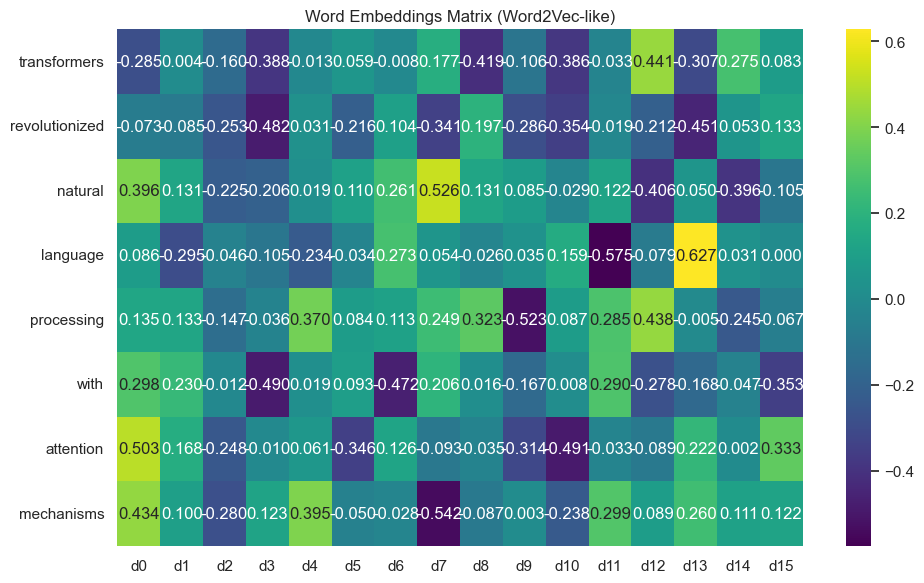

ADDING POSITIONAL ENCODING
Positional encoding shape: (8, 16)
Why we need this: Self-attention doesn't know word order!
Positional encoding adds position information to embeddings.



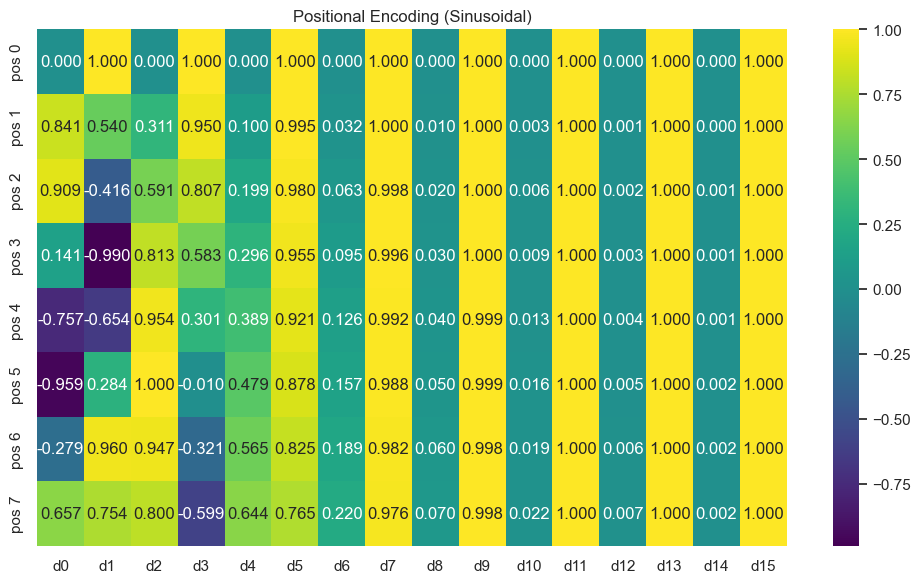

Combined embeddings = word embeddings + positional encoding
Combined shape: (8, 16)



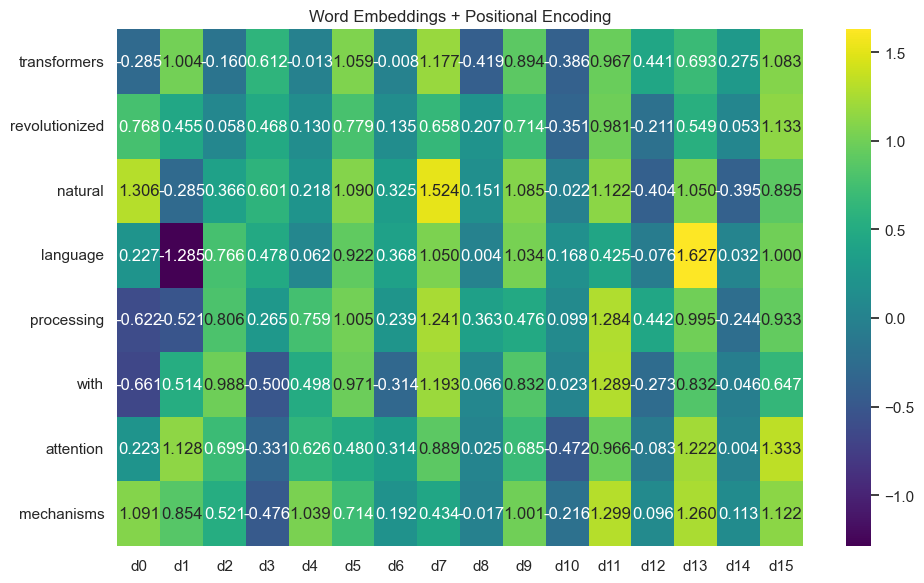

INITIALIZING WEIGHT MATRICES (XAVIER INITIALIZATION)
Query weight matrix (Wq) shape: (16, 16)
Key weight matrix (Wk) shape: (16, 16)
Value weight matrix (Wv) shape: (16, 16)

Xavier initialization ensures:
  - Weights are not too large (prevents exploding gradients)
  - Weights are not too small (prevents vanishing gradients)

Xavier weights range: [-0.4286, 0.4217]
Random weights range: [-0.0270, 0.0263]

COMPUTING QUERY, KEY, VALUE MATRICES
Input (X) shape: (8, 16)
Query (Q) shape: (8, 16)
Key (K) shape: (8, 16)
Value (V) shape: (8, 16)



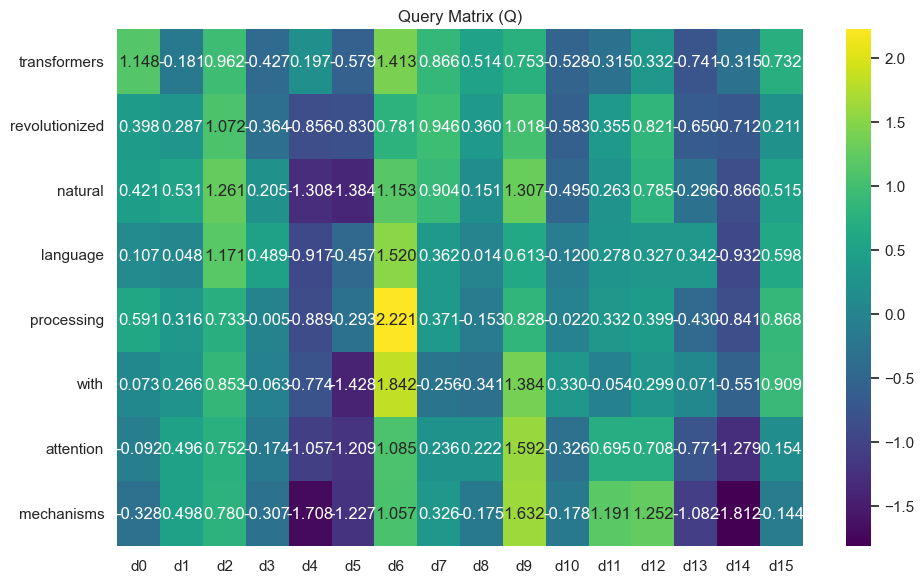

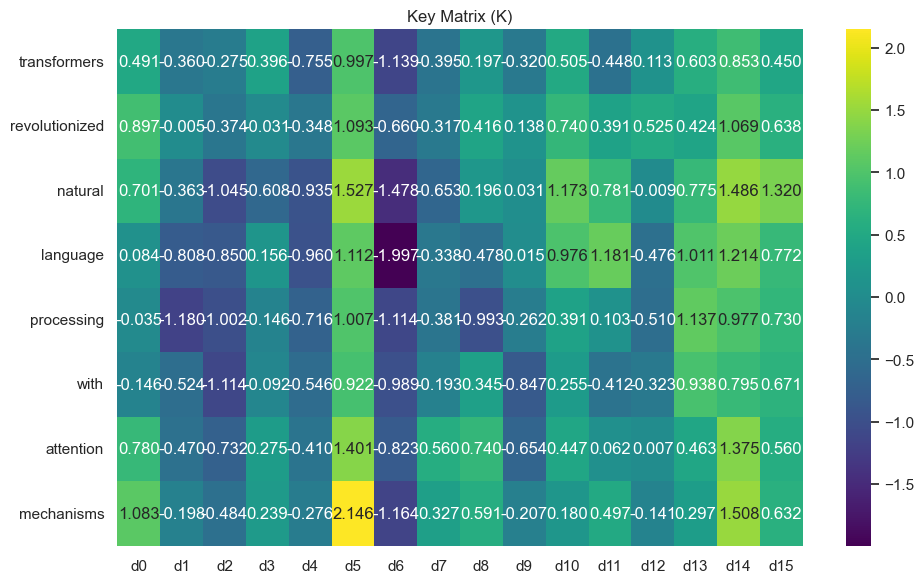

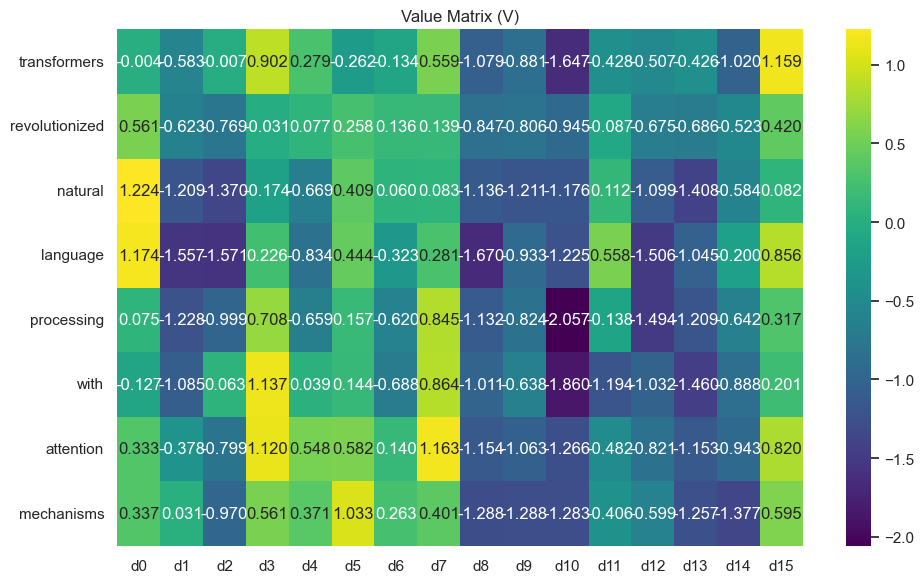

COMPUTING SELF-ATTENTION
Attention scores shape: (8, 8)
Attention weights shape: (8, 8)
Attention output shape: (8, 16)



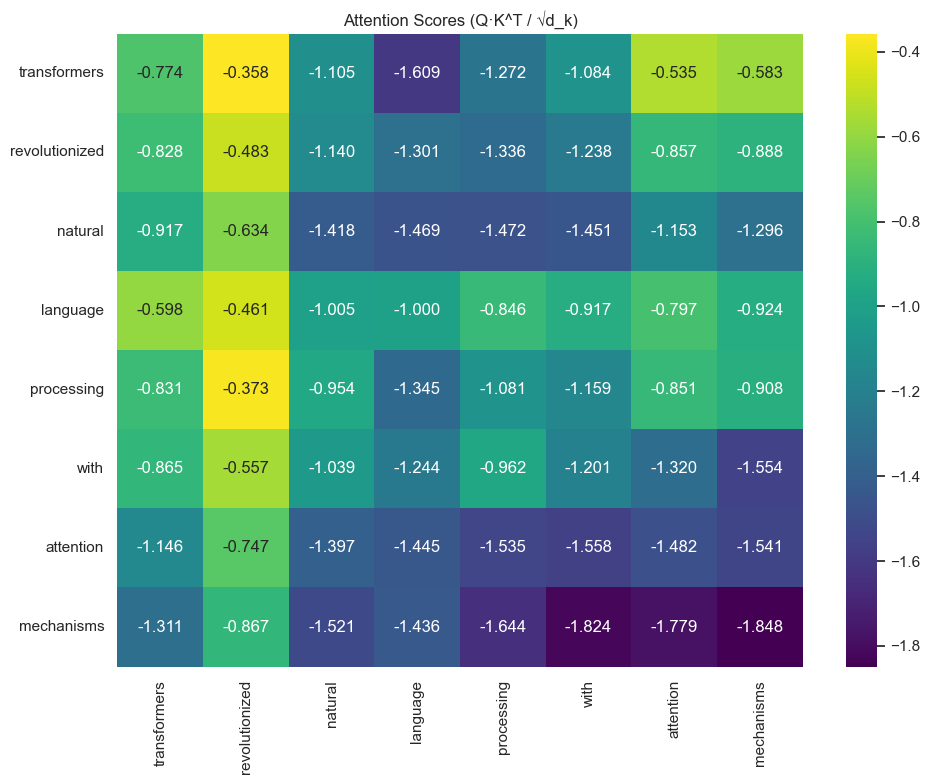

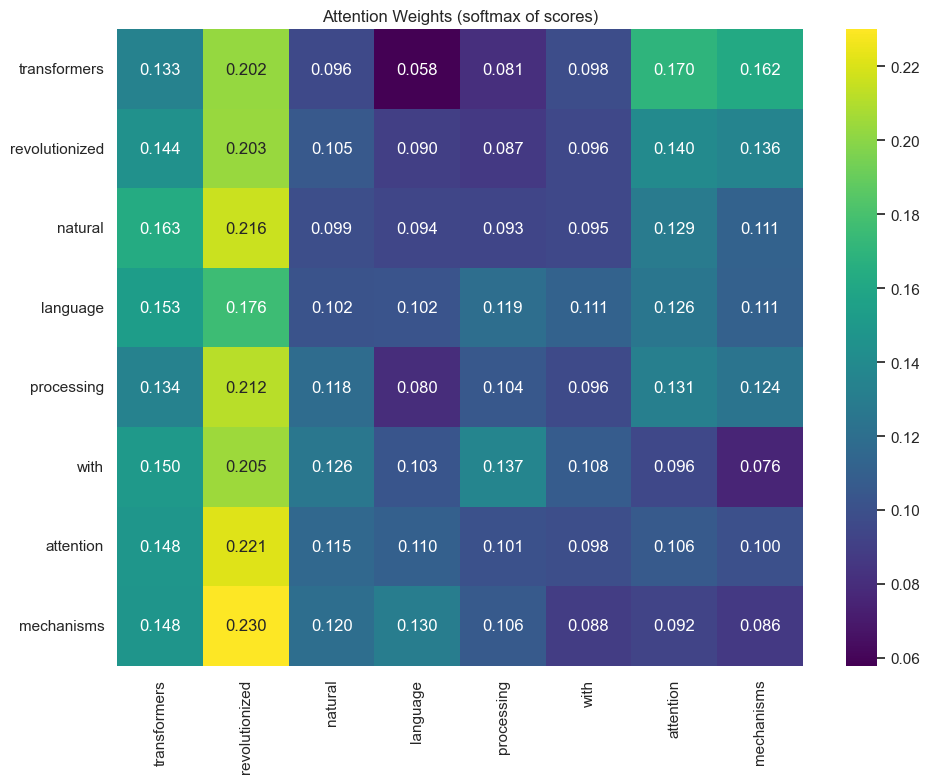

How to read attention weights:
  - Each row shows how much one word attends to all other words
  - Brighter colors = stronger attention
  - Each row sums to 1.0 (probabilities)



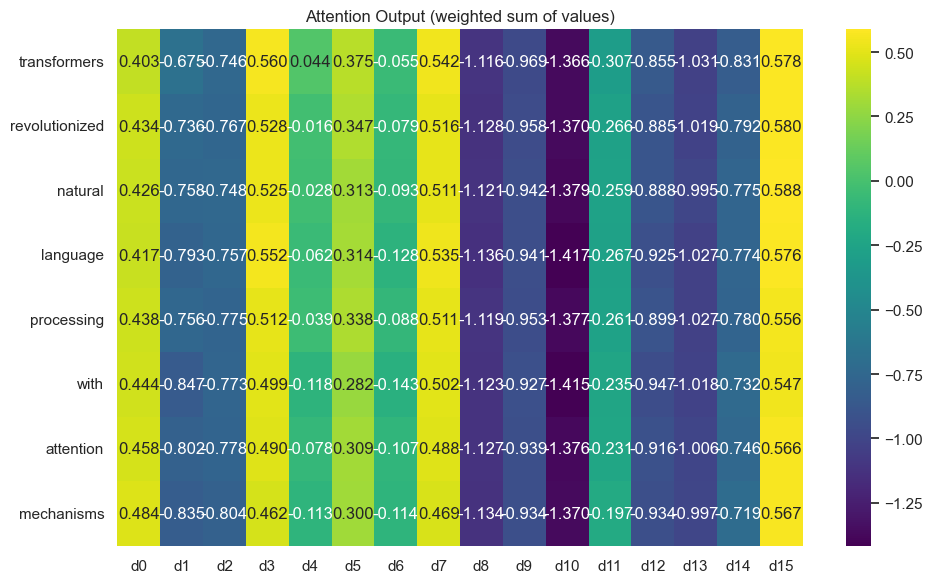

COMPARISON: IMPACT OF POSITIONAL ENCODING


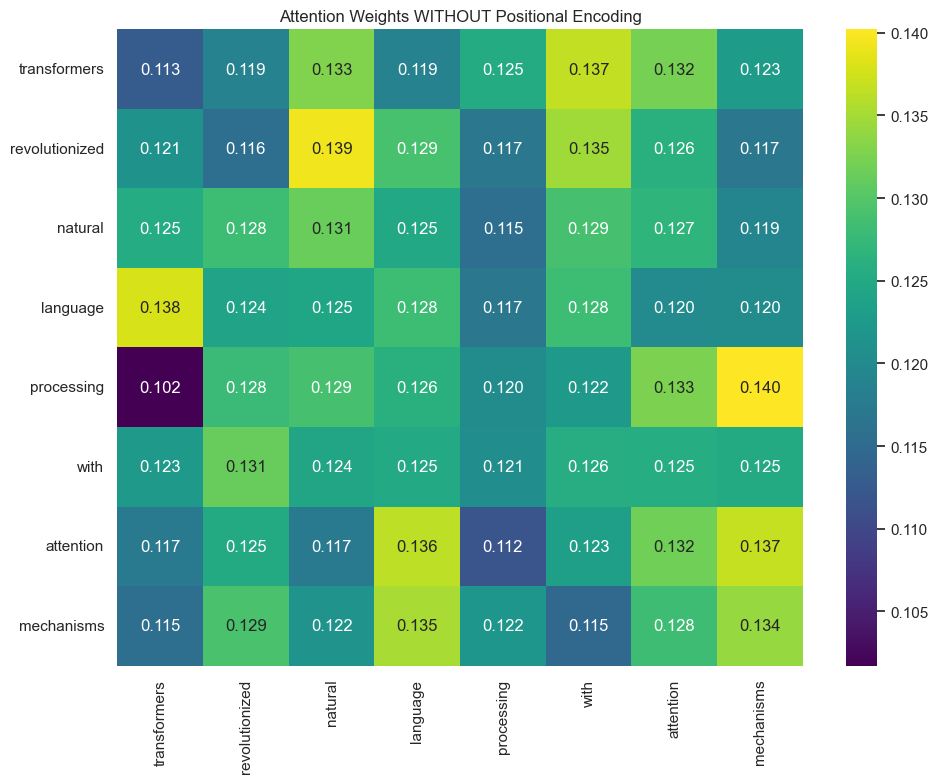

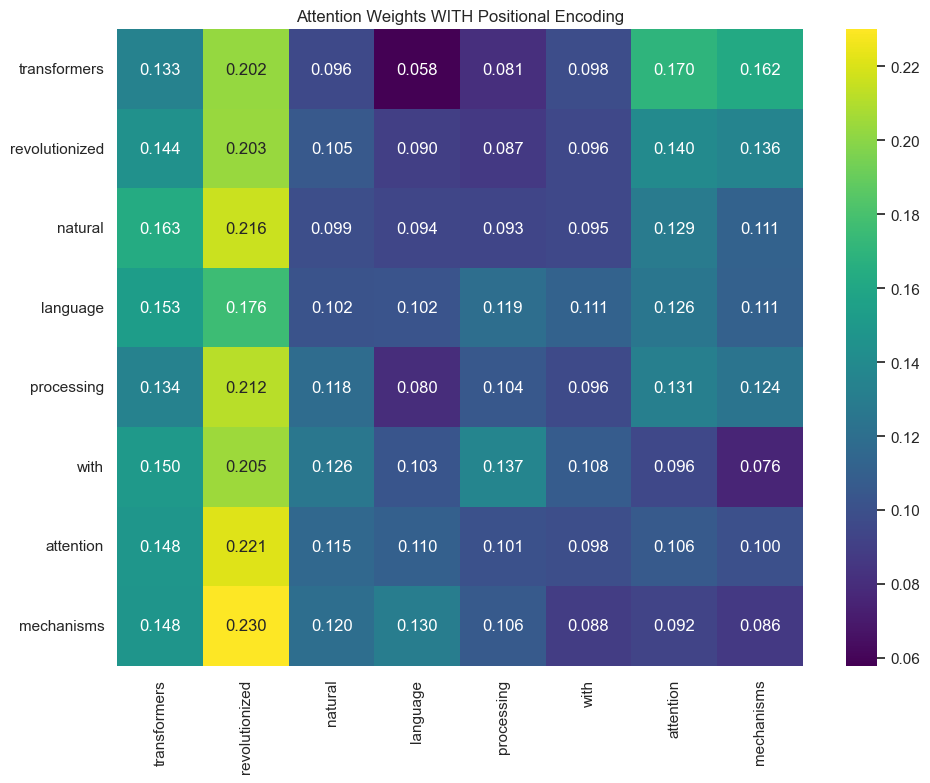

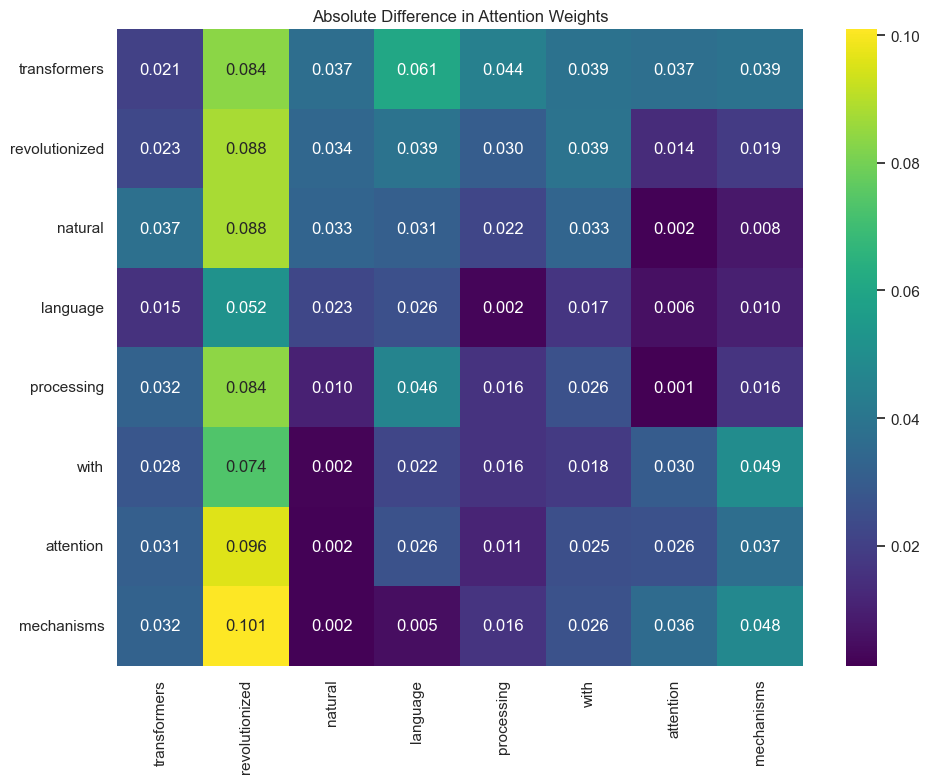

Average absolute difference: 0.0319
Max absolute difference: 0.1009

Observation: Positional encoding changes how words attend to each other
             because it adds information about word position!

COMPARISON: XAVIER vs RANDOM INITIALIZATION


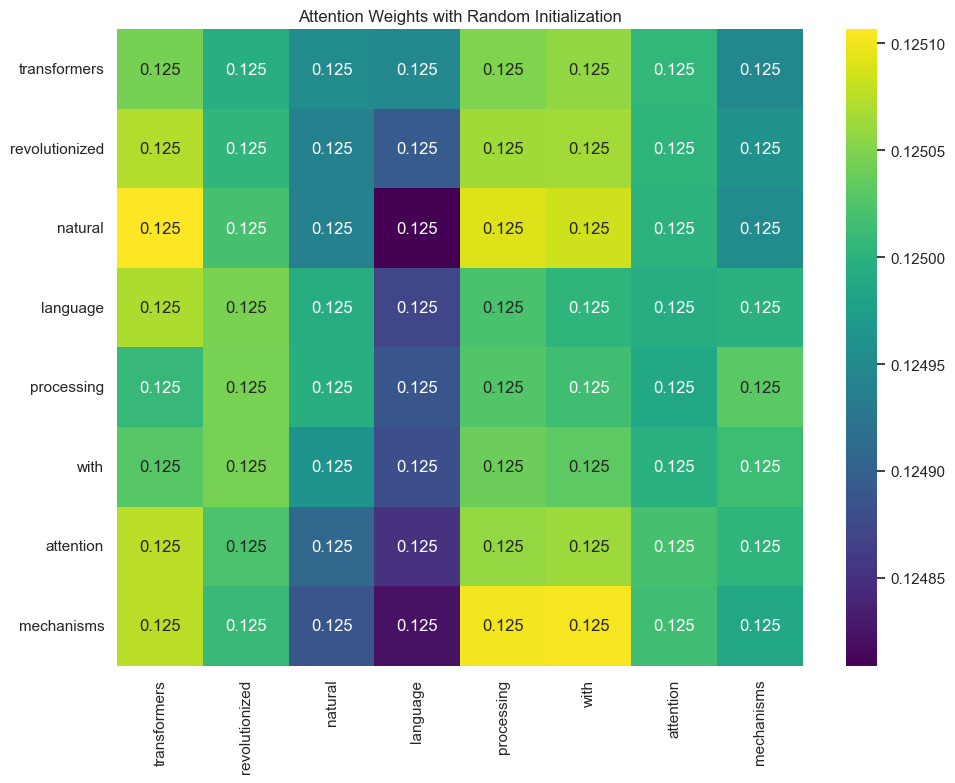

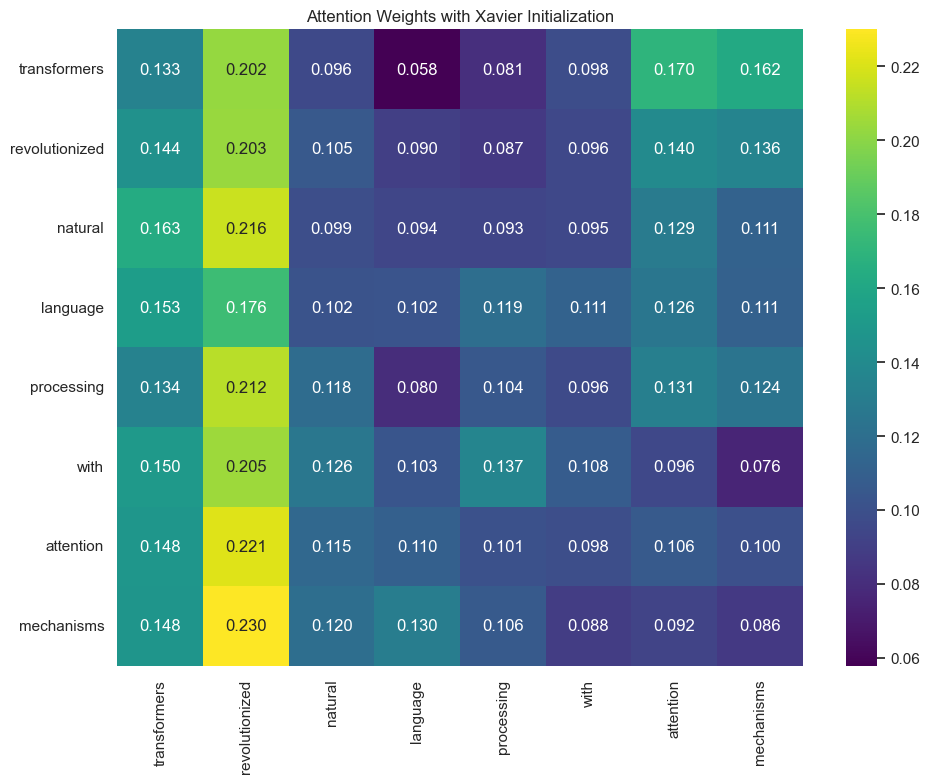

Attention scores with Xavier - mean: -1.1105, std: 0.3674
Attention scores with Random - mean: -0.0014, std: 0.0007

Xavier initialization typically produces more balanced attention patterns
and helps with gradient flow during training.


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set()

# ============================================================================
# PART 1: UTILITY FUNCTIONS
# ============================================================================

def softmax(x, axis=-1):
    """
    Softmax function converts raw scores to probabilities (values between 0 and 1 that sum to 1).
    
    Why we use it: In attention, softmax turns attention scores into attention weights.
    
    Args:
        x: Input array (attention scores)
        axis: The axis along which to compute softmax
    
    Returns:
        Probabilities that sum to 1 along the specified axis
    """
    # Subtract max for numerical stability (prevents overflow in exp)
    x_stable = x - np.max(x, axis=axis, keepdims=True)
    exp_x = np.exp(x_stable)
    return exp_x / np.sum(exp_x, axis=axis, keepdims=True)


def plot_heatmap(matrix, title, xlabels=None, ylabels=None, figsize=(8, 6)):
    """
    Helper function to visualize matrices as heatmaps.
    
    Why visualization matters: Heatmaps help us see patterns in attention weights,
    showing which words pay attention to which other words.
    """
    plt.figure(figsize=figsize)
    sns.heatmap(matrix, annot=True, fmt='.3f', cmap='viridis', 
                xticklabels=xlabels, yticklabels=ylabels, cbar=True)
    plt.title(title)
    plt.tight_layout()
    plt.show()


def xavier_init(fan_in, fan_out):
    """
    Xavier (Glorot) initialization for weight matrices.
    
    What it does: Initializes weights with values drawn from a distribution that
    prevents gradients from exploding or vanishing during training.
    
    Formula: weights ~ Uniform(-limit, limit) where limit = sqrt(6 / (fan_in + fan_out))
    
    Args:
        fan_in: Number of input units (input dimension)
        fan_out: Number of output units (output dimension)
    
    Returns:
        Weight matrix initialized with Xavier method
    """
    limit = np.sqrt(6.0 / (fan_in + fan_out))
    return np.random.uniform(-limit, limit, (fan_in, fan_out))


def create_simple_word2vec_embeddings(vocab, embed_dim=50):
    """
    Simulate Word2Vec-like embeddings using deterministic hashing.
    
    Real Word2Vec learns from large corpora, but here we create similar-looking
    embeddings for demonstration purposes.
    
    How it works:
    1. Hash each word to get a unique seed
    2. Use that seed to generate a consistent random vector
    3. Words that are similar get similar (but not identical) vectors
    
    Args:
        vocab: List of unique words
        embed_dim: Dimension of embedding vectors
    
    Returns:
        Dictionary mapping words to embedding vectors
    """
    embeddings = {}
    for word in vocab:
        # Create a deterministic seed from the word
        seed = abs(hash(word)) % (2**32)
        rng = np.random.default_rng(seed)
        # Generate a vector with small values (normalized)
        vec = rng.normal(0, 0.3, embed_dim)
        # L2 normalization (common in Word2Vec)
        vec = vec / (np.linalg.norm(vec) + 1e-8)
        embeddings[word] = vec
    return embeddings


def get_positional_encoding(seq_length, d_model):
    """
    Create sinusoidal positional encodings as described in "Attention Is All You Need".
    
    Why we need this: Self-attention has NO inherent notion of word order!
    Without positional encoding, "cat ate mouse" = "mouse ate cat"
    
    How it works:
    - For each position 'pos' and dimension 'i':
      PE(pos, 2i) = sin(pos / 10000^(2i/d_model))
      PE(pos, 2i+1) = cos(pos / 10000^(2i/d_model))
    
    This creates unique patterns for each position that the model can learn.
    
    Args:
        seq_length: Number of words in the sequence
        d_model: Dimension of embeddings
    
    Returns:
        Positional encoding matrix of shape (seq_length, d_model)
    """
    # Initialize matrix to hold positional encodings
    pe = np.zeros((seq_length, d_model))
    
    # Position indices [0, 1, 2, ..., seq_length-1]
    position = np.arange(seq_length)[:, np.newaxis]  # Shape: (seq_length, 1)
    
    # Dimension indices [0, 2, 4, ..., d_model-2] for even positions
    div_term = np.exp(np.arange(0, d_model, 2) * -(np.log(10000.0) / d_model))
    
    # Apply sine to even indices
    pe[:, 0::2] = np.sin(position * div_term)
    
    # Apply cosine to odd indices
    pe[:, 1::2] = np.cos(position * div_term)
    
    return pe


def scaled_dot_product_attention(Q, K, V, scale=None):
    """
    Core self-attention mechanism.
    
    Steps:
    1. Compute similarity scores between queries and keys: Q @ K^T
    2. Scale scores to prevent saturation: divide by sqrt(d_k)
    3. Convert scores to probabilities: softmax
    4. Weighted sum of values: attention_weights @ V
    
    Args:
        Q: Query matrix (seq_len, d_model)
        K: Key matrix (seq_len, d_model)
        V: Value matrix (seq_len, d_model)
        scale: Scaling factor (default: sqrt(d_k))
    
    Returns:
        output: Attention output (seq_len, d_model)
        weights: Attention weights (seq_len, seq_len)
        scores: Raw attention scores before softmax
    """
    # Step 1: Compute attention scores (how much each word should attend to others)
    scores = Q @ K.T  # Shape: (seq_len, seq_len)
    
    # Step 2: Scale to prevent gradients from becoming too small
    d_k = K.shape[-1]
    if scale is None:
        scale = np.sqrt(d_k)
    scores_scaled = scores / scale
    
    # Step 3: Convert to probabilities using softmax
    weights = softmax(scores_scaled, axis=-1)
    
    # Step 4: Compute weighted sum of values
    output = weights @ V  # Shape: (seq_len, d_model)
    
    return output, weights, scores_scaled


# ============================================================================
# PART 2: DATA PREPARATION
# ============================================================================

# Choose a new sentence (you can change this!)
sentence = "Transformers revolutionized natural language processing with attention mechanisms"
words = sentence.lower().split()

print("=" * 80)
print("SENTENCE ANALYSIS")
print("=" * 80)
print(f"Sentence: {sentence}")
print(f"Tokenized words: {words}")
print(f"Number of tokens: {len(words)}")
print()

# Build vocabulary (unique words)
vocab = sorted(set(words))
print(f"Vocabulary (unique words): {vocab}")
print(f"Vocabulary size: {len(vocab)}")
print()

# ============================================================================
# PART 3: CREATE WORD2VEC-LIKE EMBEDDINGS
# ============================================================================

embed_dim = 16  # Dimension of word embeddings (you can experiment with 8, 16, 32, etc.)

print("=" * 80)
print("CREATING WORD EMBEDDINGS")
print("=" * 80)

# Create Word2Vec-like embeddings
word_embeddings = create_simple_word2vec_embeddings(vocab, embed_dim)

# Convert sentence to embedding matrix
# Each row is the embedding for one word in the sentence
embeddings_matrix = np.array([word_embeddings[word] for word in words])

print(f"Embedding dimension: {embed_dim}")
print(f"Embeddings matrix shape: {embeddings_matrix.shape}")
print(f"  - {embeddings_matrix.shape[0]} words")
print(f"  - {embeddings_matrix.shape[1]} dimensions per word")
print()

# Show first word's embedding as example
print(f"Example - Embedding for '{words[0]}':")
print(embeddings_matrix[0])
print()

# Visualize the embedding matrix
plot_heatmap(embeddings_matrix, 
             "Word Embeddings Matrix (Word2Vec-like)",
             xlabels=[f"d{i}" for i in range(embed_dim)],
             ylabels=words,
             figsize=(10, 6))

# ============================================================================
# PART 4: POSITIONAL ENCODING
# ============================================================================

print("=" * 80)
print("ADDING POSITIONAL ENCODING")
print("=" * 80)

# Generate positional encodings
pos_encoding = get_positional_encoding(len(words), embed_dim)

print(f"Positional encoding shape: {pos_encoding.shape}")
print("Why we need this: Self-attention doesn't know word order!")
print("Positional encoding adds position information to embeddings.")
print()

# Visualize positional encoding
plot_heatmap(pos_encoding,
             "Positional Encoding (Sinusoidal)",
             xlabels=[f"d{i}" for i in range(embed_dim)],
             ylabels=[f"pos {i}" for i in range(len(words))],
             figsize=(10, 6))

# Add positional encoding to embeddings
embeddings_with_pos = embeddings_matrix + pos_encoding

print("Combined embeddings = word embeddings + positional encoding")
print(f"Combined shape: {embeddings_with_pos.shape}")
print()

# Visualize combined embeddings
plot_heatmap(embeddings_with_pos,
             "Word Embeddings + Positional Encoding",
             xlabels=[f"d{i}" for i in range(embed_dim)],
             ylabels=words,
             figsize=(10, 6))

# ============================================================================
# PART 5: WEIGHT INITIALIZATION - XAVIER METHOD
# ============================================================================

print("=" * 80)
print("INITIALIZING WEIGHT MATRICES (XAVIER INITIALIZATION)")
print("=" * 80)

# Initialize Q, K, V weight matrices using Xavier initialization
np.random.seed(42)  # For reproducibility

Wq = xavier_init(embed_dim, embed_dim)
Wk = xavier_init(embed_dim, embed_dim)
Wv = xavier_init(embed_dim, embed_dim)

print(f"Query weight matrix (Wq) shape: {Wq.shape}")
print(f"Key weight matrix (Wk) shape: {Wk.shape}")
print(f"Value weight matrix (Wv) shape: {Wv.shape}")
print()
print("Xavier initialization ensures:")
print("  - Weights are not too large (prevents exploding gradients)")
print("  - Weights are not too small (prevents vanishing gradients)")
print()

# Compare with random initialization for demonstration
Wq_random = np.random.randn(embed_dim, embed_dim) * 0.01
print(f"Xavier weights range: [{Wq.min():.4f}, {Wq.max():.4f}]")
print(f"Random weights range: [{Wq_random.min():.4f}, {Wq_random.max():.4f}]")
print()

# ============================================================================
# PART 6: COMPUTE Q, K, V MATRICES
# ============================================================================

print("=" * 80)
print("COMPUTING QUERY, KEY, VALUE MATRICES")
print("=" * 80)

# Use embeddings WITH positional encoding
X = embeddings_with_pos

# Linear transformations: multiply embeddings by weight matrices
Q = X @ Wq  # Query: "what am I looking for?"
K = X @ Wk  # Key: "what do I contain?"
V = X @ Wv  # Value: "what information do I carry?"

print(f"Input (X) shape: {X.shape}")
print(f"Query (Q) shape: {Q.shape}")
print(f"Key (K) shape: {K.shape}")
print(f"Value (V) shape: {V.shape}")
print()

# Visualize Q, K, V
plot_heatmap(Q, "Query Matrix (Q)", 
             xlabels=[f"d{i}" for i in range(embed_dim)],
             ylabels=words,
             figsize=(10, 6))

plot_heatmap(K, "Key Matrix (K)",
             xlabels=[f"d{i}" for i in range(embed_dim)],
             ylabels=words,
             figsize=(10, 6))

plot_heatmap(V, "Value Matrix (V)",
             xlabels=[f"d{i}" for i in range(embed_dim)],
             ylabels=words,
             figsize=(10, 6))

# ============================================================================
# PART 7: SELF-ATTENTION COMPUTATION
# ============================================================================

print("=" * 80)
print("COMPUTING SELF-ATTENTION")
print("=" * 80)

# Compute attention
attention_output, attention_weights, attention_scores = scaled_dot_product_attention(Q, K, V)

print(f"Attention scores shape: {attention_scores.shape}")
print(f"Attention weights shape: {attention_weights.shape}")
print(f"Attention output shape: {attention_output.shape}")
print()

# Visualize attention scores (before softmax)
plot_heatmap(attention_scores,
             "Attention Scores (Q·K^T / √d_k)",
             xlabels=words,
             ylabels=words,
             figsize=(10, 8))

# Visualize attention weights (after softmax)
plot_heatmap(attention_weights,
             "Attention Weights (softmax of scores)",
             xlabels=words,
             ylabels=words,
             figsize=(10, 8))

print("How to read attention weights:")
print("  - Each row shows how much one word attends to all other words")
print("  - Brighter colors = stronger attention")
print("  - Each row sums to 1.0 (probabilities)")
print()

# Visualize final attention output
plot_heatmap(attention_output,
             "Attention Output (weighted sum of values)",
             xlabels=[f"d{i}" for i in range(embed_dim)],
             ylabels=words,
             figsize=(10, 6))

# ============================================================================
# PART 8: COMPARISON - WITH vs WITHOUT POSITIONAL ENCODING
# ============================================================================

print("=" * 80)
print("COMPARISON: IMPACT OF POSITIONAL ENCODING")
print("=" * 80)

# Compute attention WITHOUT positional encoding
Q_no_pos = embeddings_matrix @ Wq
K_no_pos = embeddings_matrix @ Wk
V_no_pos = embeddings_matrix @ Wv

_, weights_no_pos, _ = scaled_dot_product_attention(Q_no_pos, K_no_pos, V_no_pos)

# Visualize both for comparison
plot_heatmap(weights_no_pos,
             "Attention Weights WITHOUT Positional Encoding",
             xlabels=words,
             ylabels=words,
             figsize=(10, 8))

plot_heatmap(attention_weights,
             "Attention Weights WITH Positional Encoding",
             xlabels=words,
             ylabels=words,
             figsize=(10, 8))

# Compute difference
difference = np.abs(attention_weights - weights_no_pos)
plot_heatmap(difference,
             "Absolute Difference in Attention Weights",
             xlabels=words,
             ylabels=words,
             figsize=(10, 8))

print(f"Average absolute difference: {difference.mean():.4f}")
print(f"Max absolute difference: {difference.max():.4f}")
print()
print("Observation: Positional encoding changes how words attend to each other")
print("             because it adds information about word position!")

# ============================================================================
# PART 9: COMPARISON - XAVIER vs RANDOM INITIALIZATION
# ============================================================================

print()
print("=" * 80)
print("COMPARISON: XAVIER vs RANDOM INITIALIZATION")
print("=" * 80)

# Compute attention with random initialization
np.random.seed(42)
Wq_rand = np.random.randn(embed_dim, embed_dim) * 0.01
Wk_rand = np.random.randn(embed_dim, embed_dim) * 0.01
Wv_rand = np.random.randn(embed_dim, embed_dim) * 0.01

Q_rand = X @ Wq_rand
K_rand = X @ Wk_rand
V_rand = X @ Wv_rand

_, weights_rand, scores_rand = scaled_dot_product_attention(Q_rand, K_rand, V_rand)

# Visualize comparison
plot_heatmap(weights_rand,
             "Attention Weights with Random Initialization",
             xlabels=words,
             ylabels=words,
             figsize=(10, 8))

plot_heatmap(attention_weights,
             "Attention Weights with Xavier Initialization",
             xlabels=words,
             ylabels=words,
             figsize=(10, 8))

# Compare statistics
print(f"Attention scores with Xavier - mean: {attention_scores.mean():.4f}, std: {attention_scores.std():.4f}")
print(f"Attention scores with Random - mean: {scores_rand.mean():.4f}, std: {scores_rand.std():.4f}")
print()
print("Xavier initialization typically produces more balanced attention patterns")
print("and helps with gradient flow during training.")



### Exercice 4: Self-Attention mechanism: Varying Parameters

- Modify the dimensionality of the embeddings for a given sentence. Experiment with embedding dimensions of 4, 8, and 16. Compute the query, key, and value matrices for each case. Visualize and compare the attention weights and outputs for different embedding dimensions.
- Change the number of attention heads to 4 and implement the multi-head attention mechanism. Compute and visualize the attention weights and output. Compare the results with single-head and two-head attention.
- Implement dropout in the attention mechanism. Apply dropout to the attention weights before computing the final attention output. Visualize the results with and without dropout and discuss the impact on the attention mechanism.

PART 1: EXPERIMENTING WITH DIFFERENT EMBEDDING DIMENSIONS

In this part, we'll see how the embedding dimension affects attention.
Larger dimensions → more capacity to represent meaning
Smaller dimensions → faster computation, but less expressive

Sentence: 'Self attention is a powerful mechanism'
Number of words: 6


Testing with embedding dimension = 4
✓ Created embeddings with shape: (6, 4)
✓ Added positional encoding
✓ Computed Q, K, V matrices
✓ Computed attention output with shape: (6, 4)


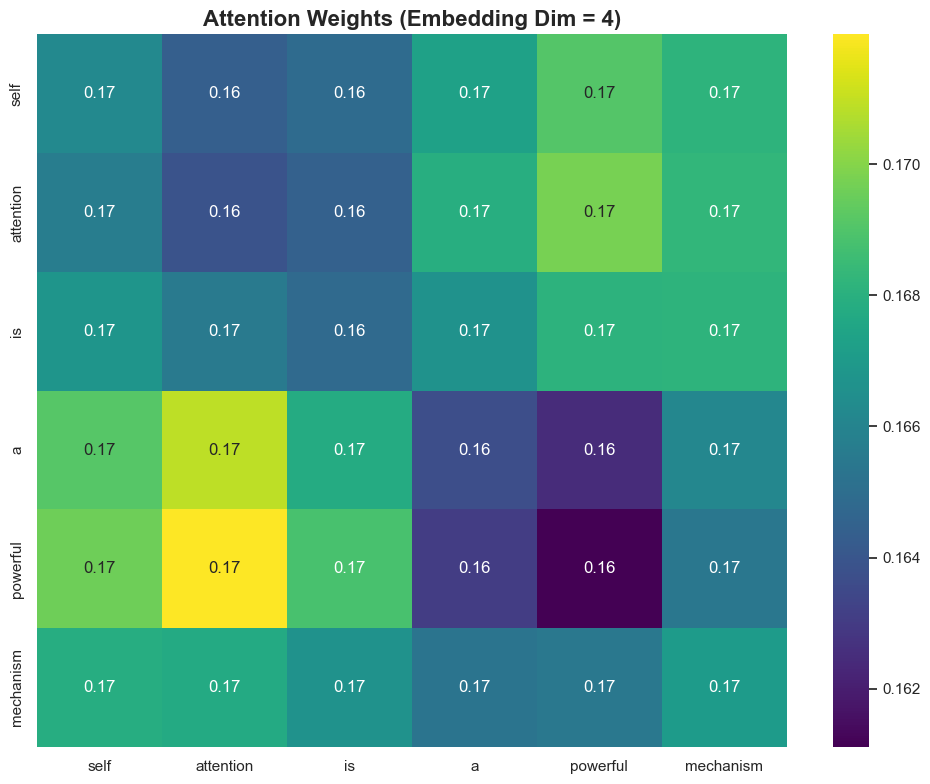

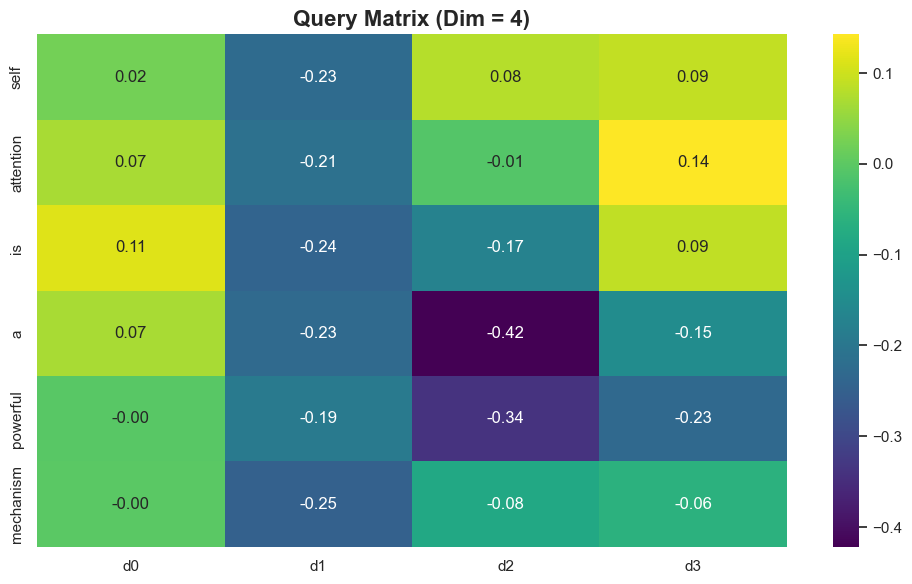


Testing with embedding dimension = 8
✓ Created embeddings with shape: (6, 8)
✓ Added positional encoding
✓ Computed Q, K, V matrices
✓ Computed attention output with shape: (6, 8)


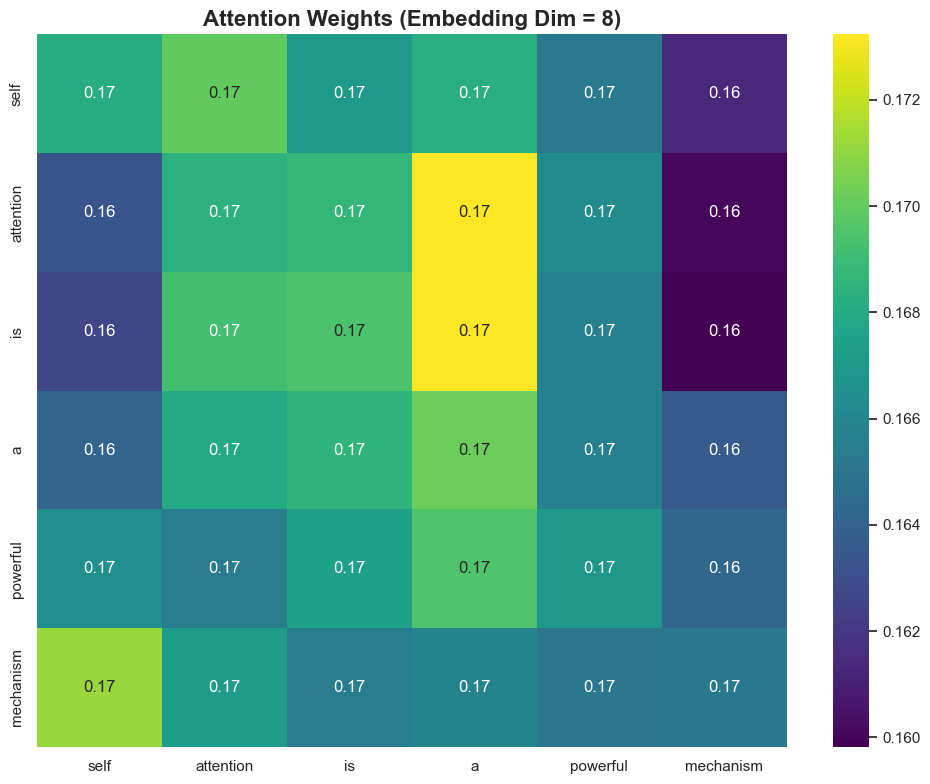

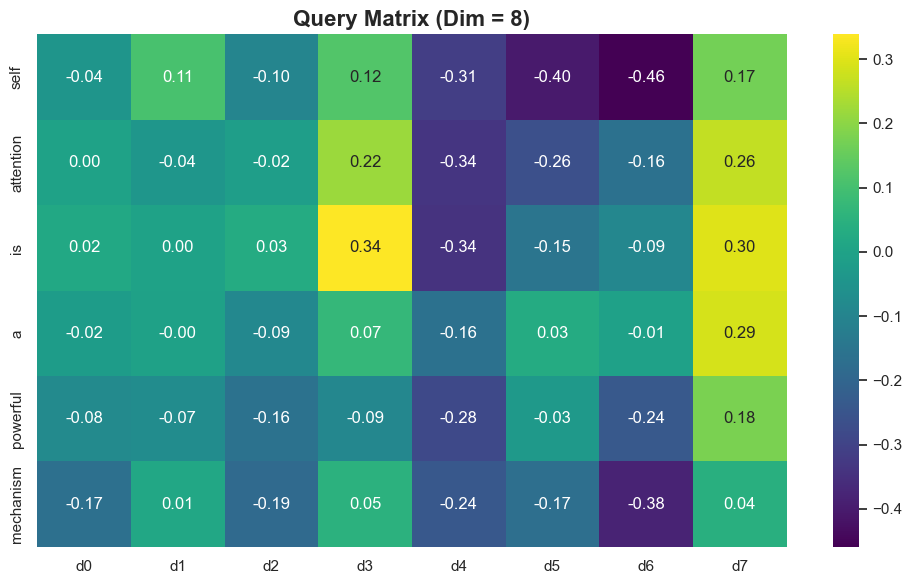


Testing with embedding dimension = 16
✓ Created embeddings with shape: (6, 16)
✓ Added positional encoding
✓ Computed Q, K, V matrices
✓ Computed attention output with shape: (6, 16)


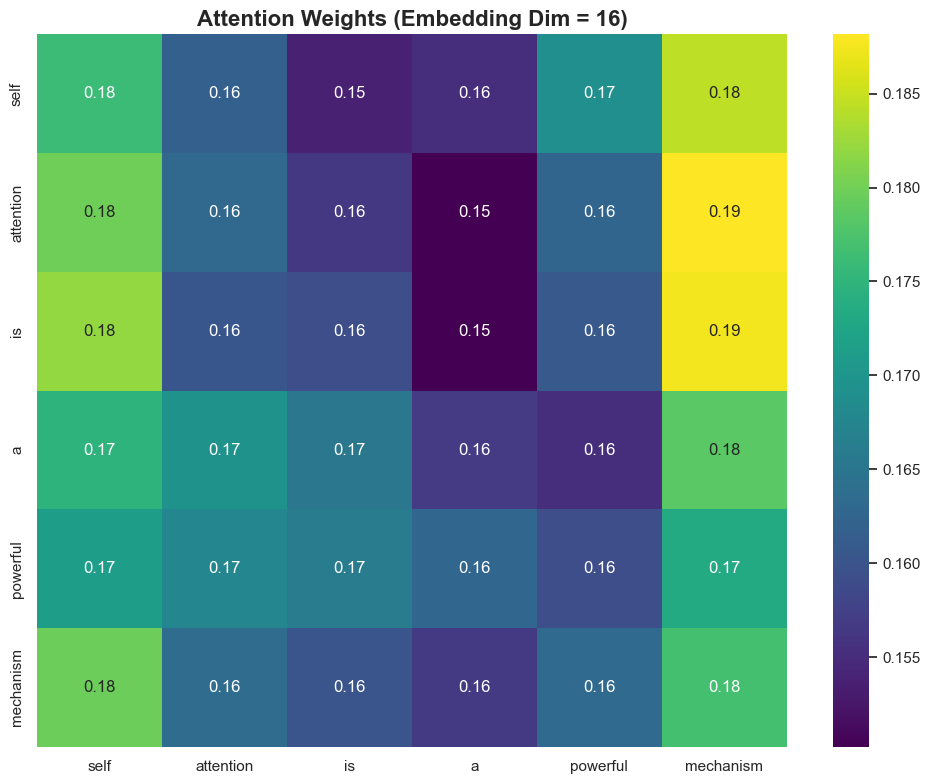

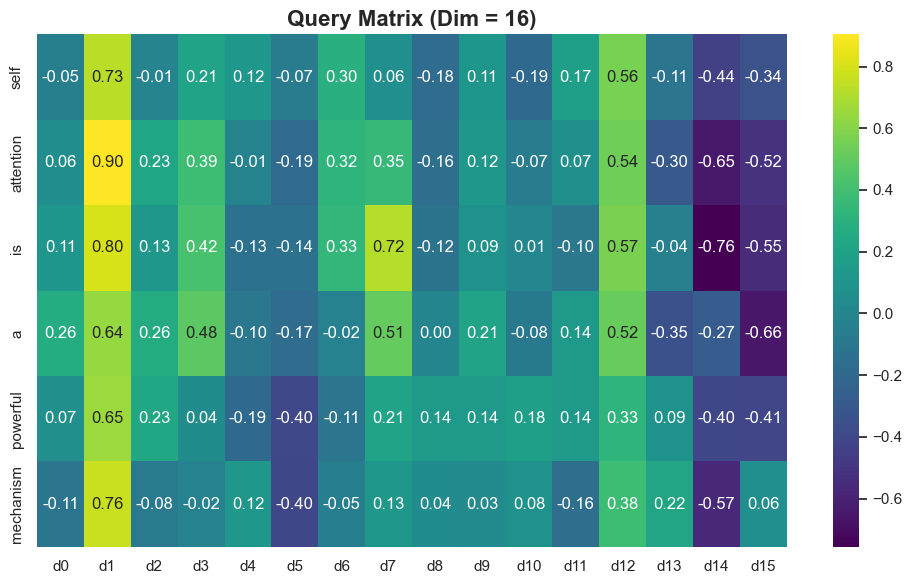


COMPARISON OF DIFFERENT EMBEDDING DIMENSIONS

What to observe:
1. Attention patterns:
   - With dim=4: Simpler, more uniform attention patterns
   - With dim=16: More complex, nuanced attention patterns

2. Computational cost:
   - Dim=4:  Q·K^T requires 4² = 16 operations per position pair
   - Dim=8:  Q·K^T requires 8² = 64 operations per position pair
   - Dim=16: Q·K^T requires 16² = 256 operations per position pair

3. Expressiveness:
   - Larger dimensions can capture more subtle relationships
   - But also require more training data to learn properly



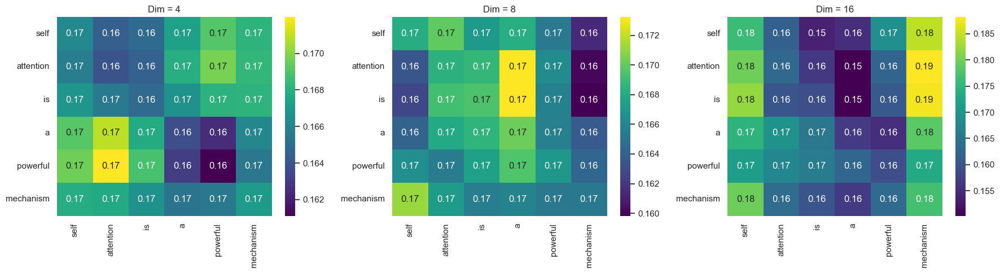



PART 2: MULTI-HEAD ATTENTION MECHANISM

Multi-head attention runs attention multiple times in parallel.
Each head can learn to focus on different aspects of the input.


Testing with 1 attention head(s)
✓ Single-head attention computed


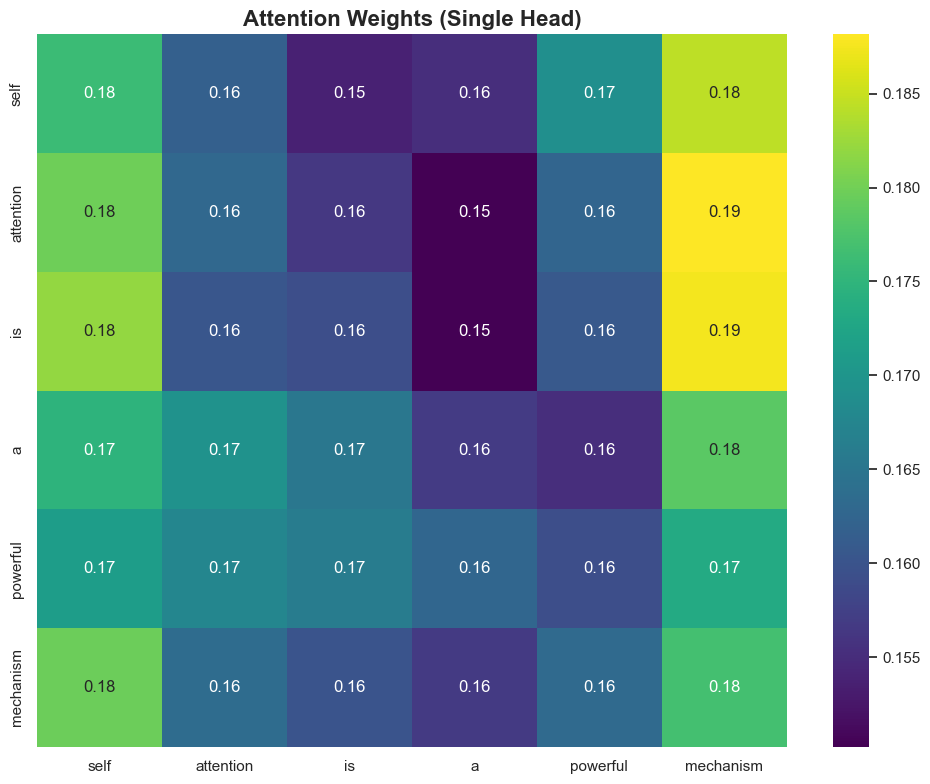


Testing with 2 attention head(s)
✓ 2-head attention computed
  - Each head processes 8 dimensions


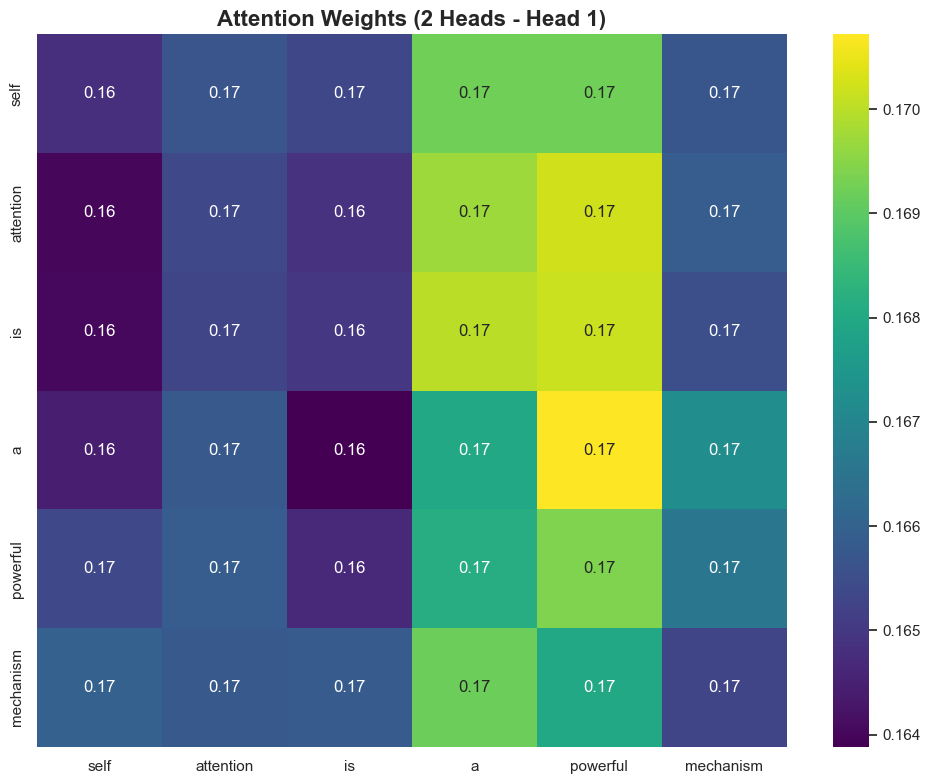

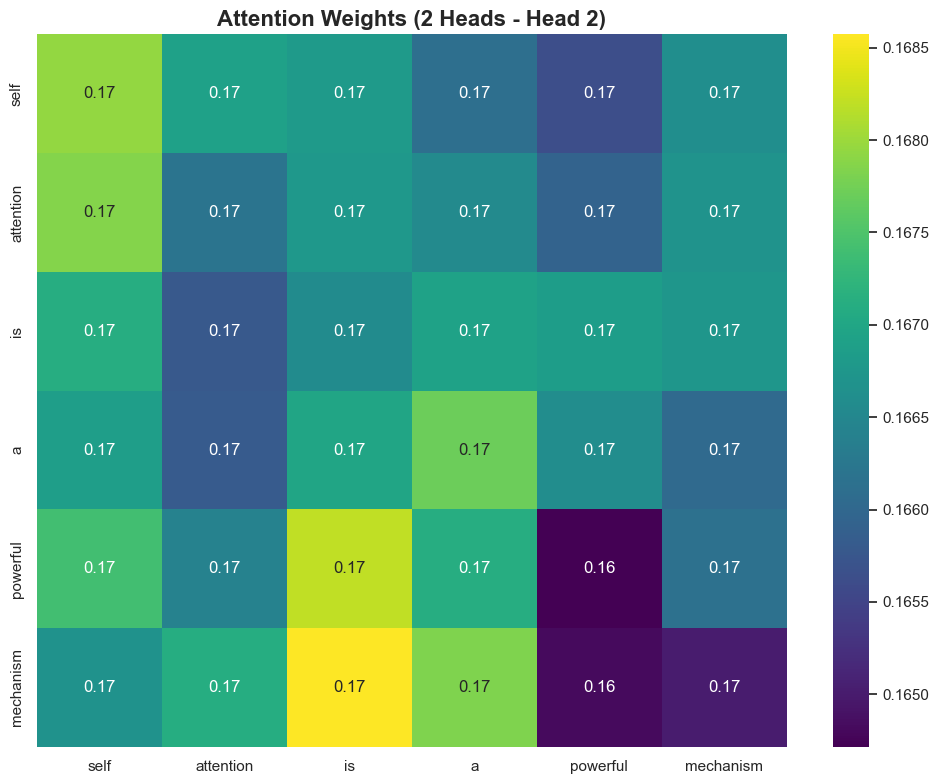


Testing with 4 attention head(s)
✓ 4-head attention computed
  - Each head processes 4 dimensions


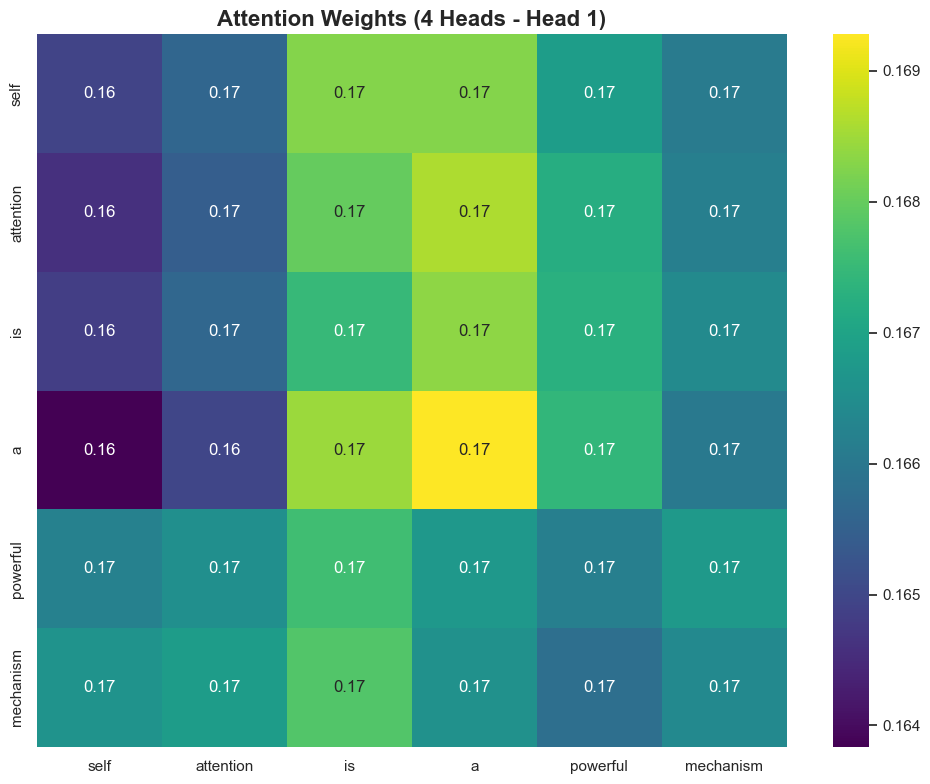

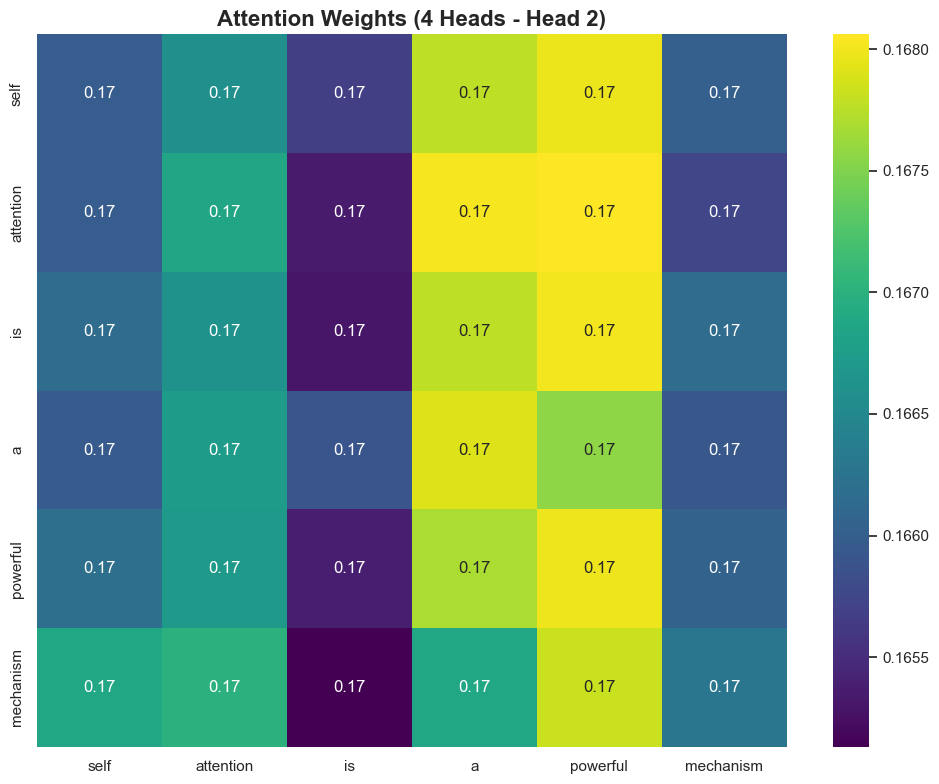

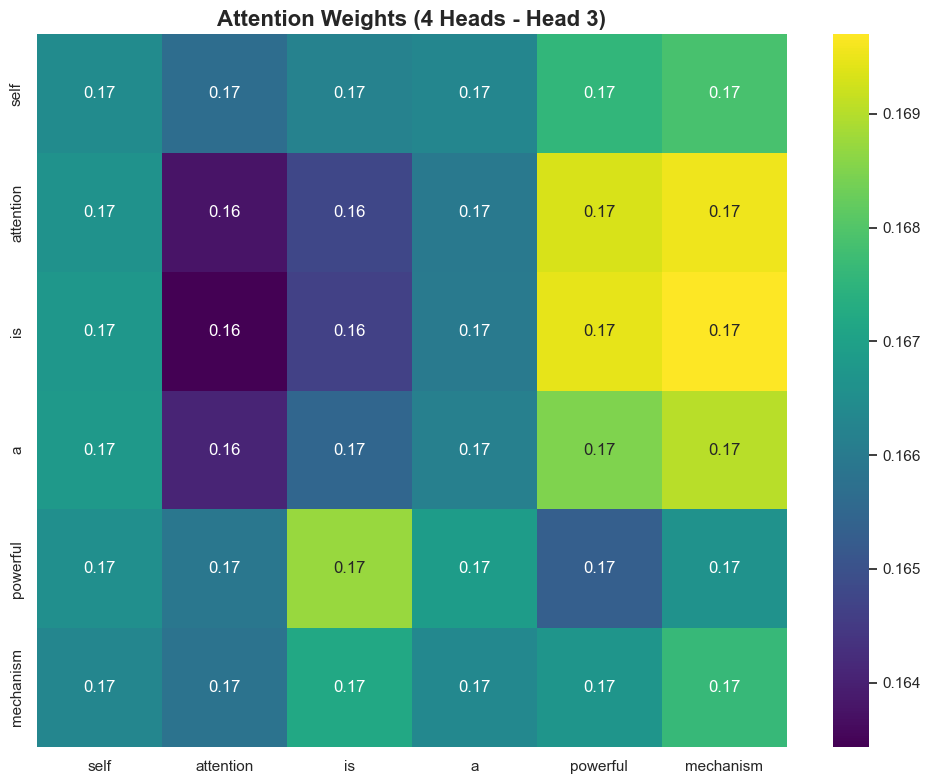

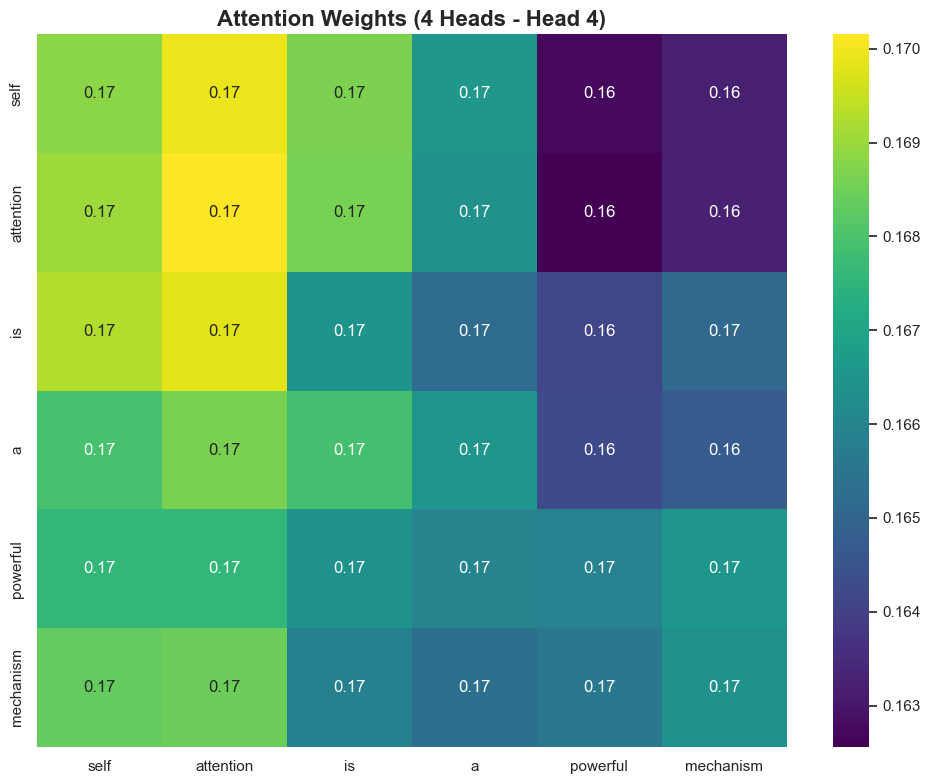


COMPARISON: SINGLE-HEAD vs MULTI-HEAD ATTENTION

Key Observations:

1. Single Head (1 head):
   - One attention pattern for all relationships
   - Simpler, but may miss some patterns

2. Two Heads (2 heads):
   - Each head can specialize:
     * Head 1 might focus on nearby words (local context)
     * Head 2 might focus on distant words (global context)

3. Four Heads (4 heads):
   - Even more specialization possible:
     * Head 1: Syntactic relationships (grammar)
     * Head 2: Semantic relationships (meaning)
     * Head 3: Long-range dependencies
     * Head 4: Local context

4. Trade-offs:
   - More heads = more capacity to learn different patterns
   - More heads = more parameters to learn
   - More heads = more computation required



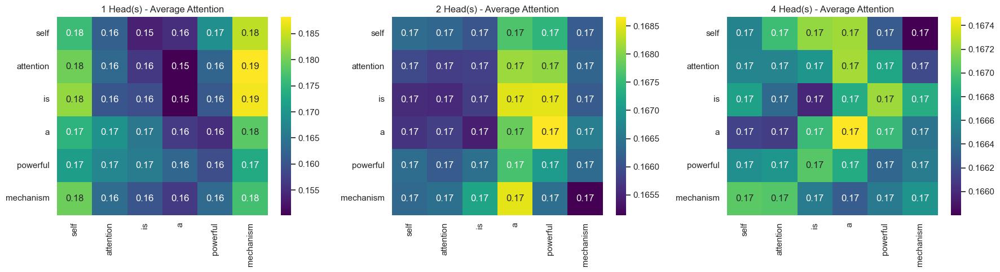



PART 3: DROPOUT IN ATTENTION MECHANISM

Dropout is a regularization technique that randomly 'drops' connections
during training to prevent the model from overfitting.

How it works:
1. During training: Randomly set some attention weights to 0
2. This forces the model to not rely too heavily on any single connection
3. Results in a more robust, generalizable model


Testing with dropout rate = 0.0
(No dropout - this is our baseline)
✓ Attention computed
  - Attention weights shape: (6, 6)
  - Number of non-zero weights: 36/36
  - Percentage active: 100.0%


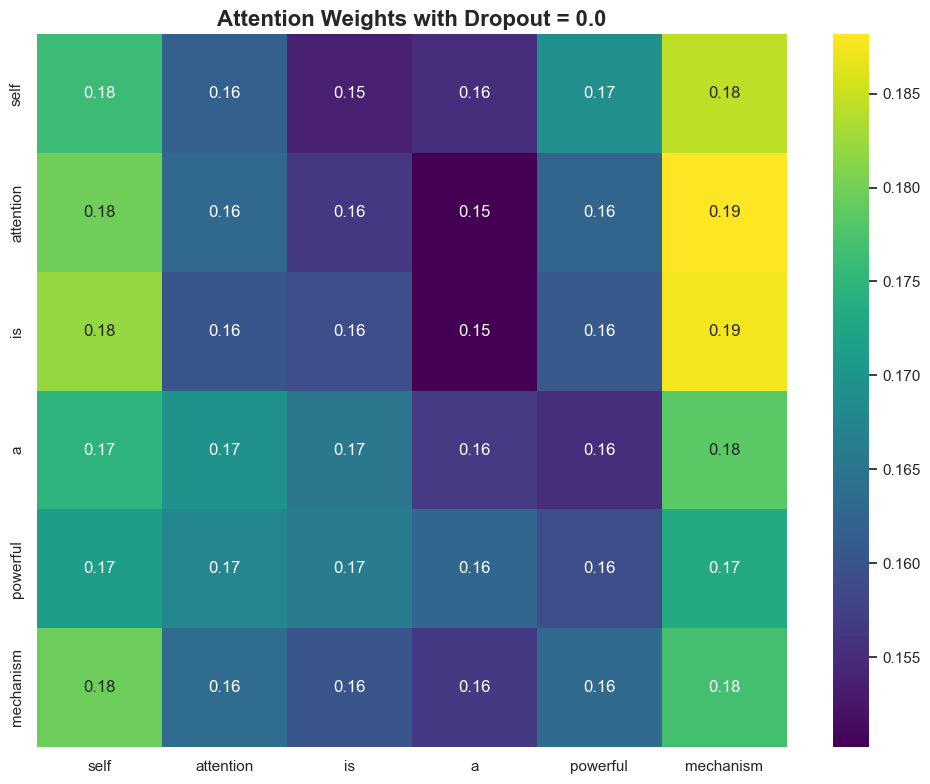


Testing with dropout rate = 0.1
On average, 10% of attention weights will be set to 0
✓ Attention computed
  - Attention weights shape: (6, 6)
  - Number of non-zero weights: 33/36
  - Percentage active: 91.7%


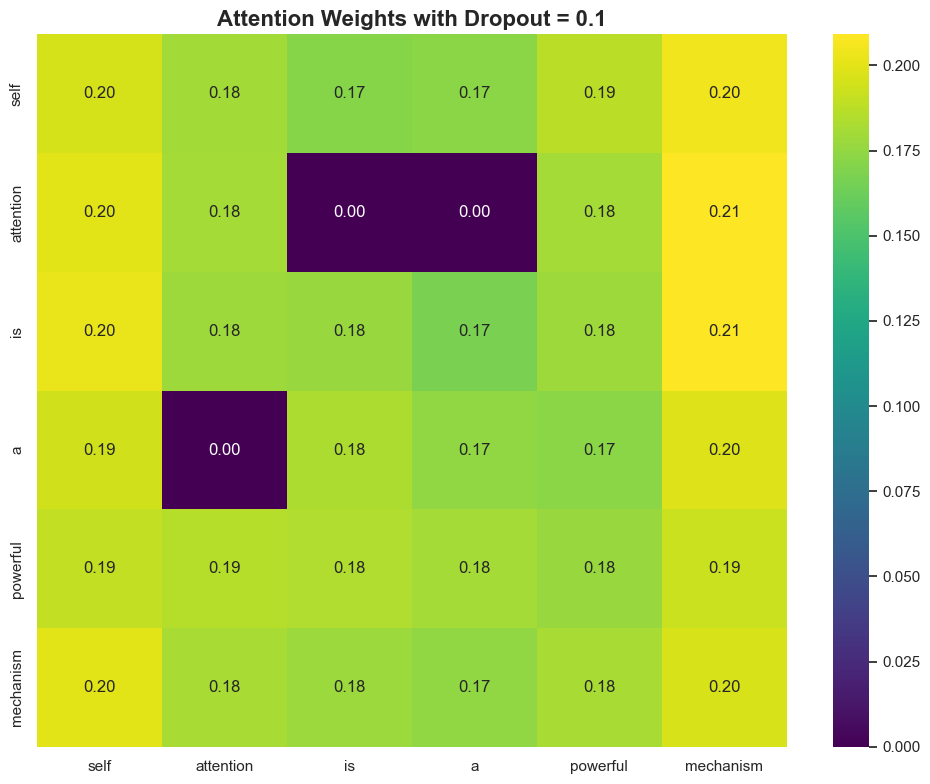


Testing with dropout rate = 0.3
On average, 30% of attention weights will be set to 0
✓ Attention computed
  - Attention weights shape: (6, 6)
  - Number of non-zero weights: 23/36
  - Percentage active: 63.9%


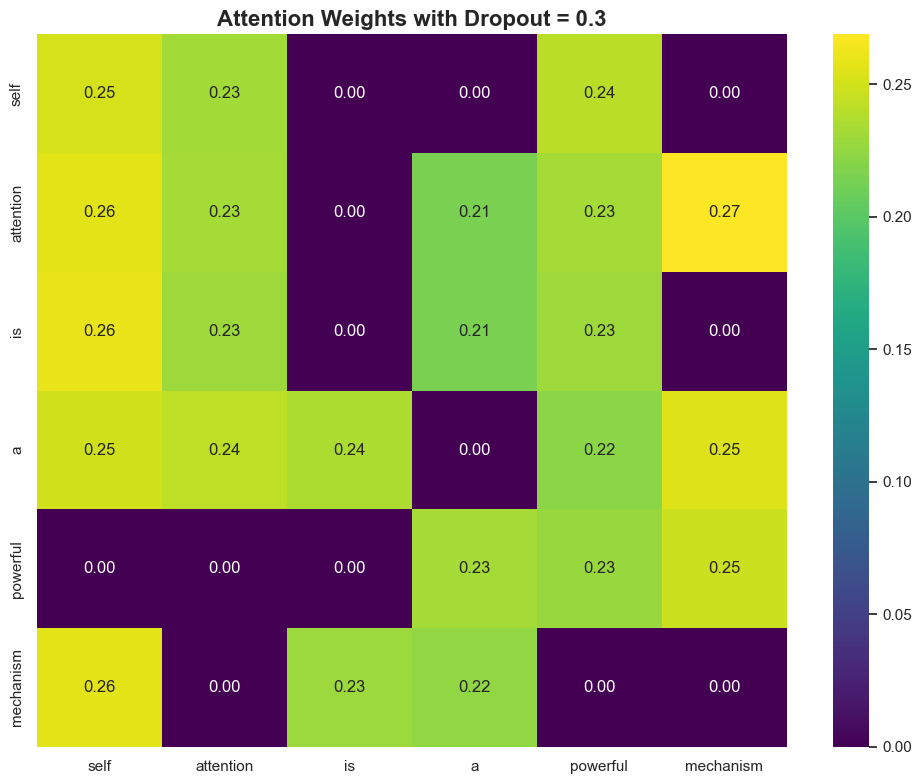


Testing with dropout rate = 0.5
On average, 50% of attention weights will be set to 0
✓ Attention computed
  - Attention weights shape: (6, 6)
  - Number of non-zero weights: 18/36
  - Percentage active: 50.0%


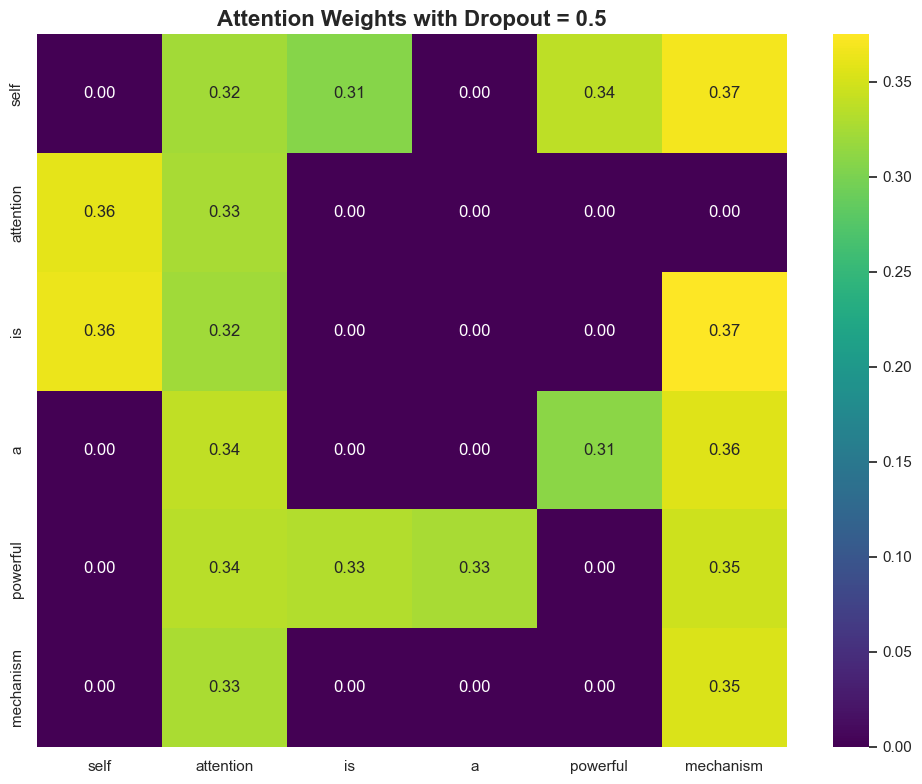


COMPARISON: EFFECT OF DROPOUT ON ATTENTION

What happens with different dropout rates:

1. Dropout = 0.0 (No dropout):
   - All attention weights are active
   - Model can use all connections freely
   - Risk: Might overfit to training data

2. Dropout = 0.1 (Light dropout):
   - 10% of weights are randomly dropped
   - Model learns to use multiple paths
   - Good balance between capacity and regularization

3. Dropout = 0.3 (Moderate dropout):
   - 30% of weights are dropped
   - Forces stronger regularization
   - Model must find robust patterns

4. Dropout = 0.5 (Heavy dropout):
   - 50% of weights are dropped
   - Very strong regularization
   - Risk: Might underfit if too aggressive

Important Notes:
- Dropout is ONLY used during TRAINING
- During inference/testing, we use all weights (no dropout)
- The surviving weights are scaled up to maintain expected values



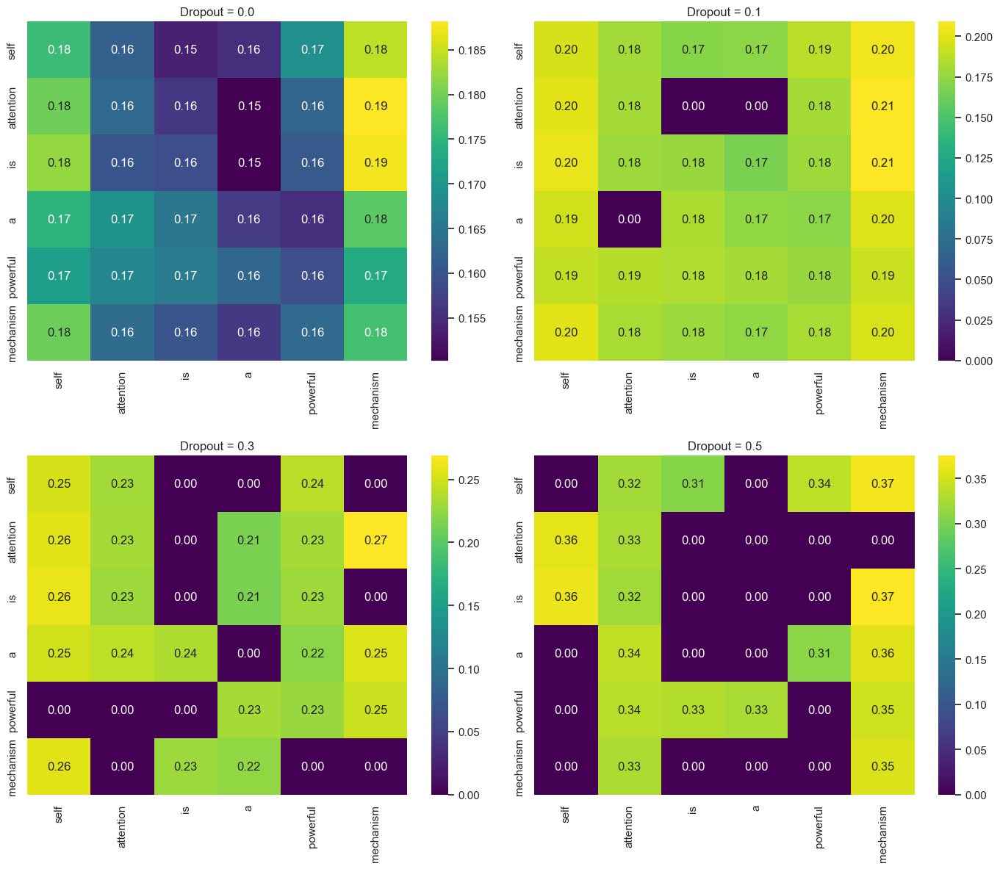

In [ ]:

# =============================================================================
# This exercise is designed  to understand how different parameters
# affect the self-attention mechanism. We'll explore:
# 1. Different embedding dimensions (4, 8, 16)
# 2. Multi-head attention (1, 2, and 4 heads)
# 3. Dropout in attention mechanism
# =============================================================================

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set style for better-looking plots
sns.set()

# =============================================================================
# SECTION 1: HELPER FUNCTIONS (Building Blocks)
# =============================================================================

def plot_heatmap(matrix, title, xlabels=None, ylabels=None, figsize=(10, 8), fmt='.2f'):
    """
    Creates a heatmap visualization of a matrix.
    
    What is a heatmap?
    - A heatmap uses colors to represent numbers in a matrix
    - Brighter colors = larger values
    - Darker colors = smaller values
    
    Why use heatmaps for attention?
    - They help us SEE which words pay attention to which other words
    - Patterns become visually obvious
    
    Parameters:
    -----------
    matrix : numpy array
        The data to visualize
    title : str
        Title for the plot
    xlabels, ylabels : list
        Labels for x and y axes (usually word tokens)
    """
    plt.figure(figsize=figsize)
    sns.heatmap(matrix, annot=True, fmt=fmt, cmap='viridis', 
                xticklabels=xlabels, yticklabels=ylabels, cbar=True)
    plt.title(title, fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()


def create_word_embeddings(words, embed_dim):
    """
    Creates word embeddings (vector representations of words).
    
    What are embeddings?
    - Each word is converted into a vector of numbers
    - Similar words should have similar vectors
    - The embedding dimension is how long each vector is
    
    Why do we need embeddings?
    - Computers can't understand words directly
    - They need numbers to perform mathematical operations
    
    Parameters:
    -----------
    words : list of str
        The words to embed
    embed_dim : int
        The size/dimension of each embedding vector
        
    Returns:
    --------
    numpy array of shape (num_words, embed_dim)
    """
    embeddings = []
    for word in words:
        # Create a unique, reproducible seed for each word
        # This ensures the same word always gets the same embedding
        seed = abs(hash(word)) % (2**32)
        rng = np.random.default_rng(seed)
        
        # Generate a random vector for this word
        vec = rng.normal(0, 0.3, embed_dim)
        embeddings.append(vec)
    
    return np.array(embeddings)


def get_positional_encoding(seq_length, d_model):
    """
    Adds position information to embeddings using sine and cosine functions.
    
    Why do we need positional encoding?
    - Self-attention has NO CONCEPT of word order!
    - "The cat ate the mouse" would be treated the same as "The mouse ate the cat"
    - Positional encoding adds information about WHERE each word is in the sentence
    
    How does it work?
    - Uses mathematical functions (sine and cosine) that create unique patterns
    - Each position gets a unique "fingerprint" that the model can learn
    
    Parameters:
    -----------
    seq_length : int
        Number of words in the sequence
    d_model : int
        Dimension of embeddings
        
    Returns:
    --------
    numpy array of shape (seq_length, d_model)
    """
    # Create empty matrix to hold positional encodings
    pe = np.zeros((seq_length, d_model))
    
    # Position indices: 0, 1, 2, 3, ... seq_length-1
    position = np.arange(seq_length)[:, np.newaxis]
    
    # Create division term for the sinusoidal functions
    div_term = np.exp(np.arange(0, d_model, 2) * -(np.log(10000.0) / d_model))
    
    # Apply sine to even indices in embedding dimension
    pe[:, 0::2] = np.sin(position * div_term)
    
    # Apply cosine to odd indices in embedding dimension
    pe[:, 1::2] = np.cos(position * div_term)
    
    return pe


def softmax(x, axis=-1):
    """
    Converts numbers into probabilities that sum to 1.
    
    What does softmax do?
    - Takes any set of numbers (can be negative, very large, etc.)
    - Converts them into probabilities between 0 and 1
    - All probabilities sum to exactly 1
    
    Why is this important for attention?
    - We need to decide HOW MUCH to pay attention to each word
    - Softmax gives us these "attention percentages"
    
    Example:
    Input:  [1, 2, 3]
    Output: [0.09, 0.24, 0.67]  (adds up to 1.0)
    
    Parameters:
    -----------
    x : numpy array
        Input values (attention scores)
    axis : int
        Which dimension to apply softmax along
        
    Returns:
    --------
    Probabilities (same shape as input)
    """
    # Subtract max for numerical stability (prevents overflow)
    x_stable = x - np.max(x, axis=axis, keepdims=True)
    
    # Apply exponential function
    exp_x = np.exp(x_stable)
    
    # Divide by sum to get probabilities
    return exp_x / np.sum(exp_x, axis=axis, keepdims=True)


def apply_dropout(matrix, dropout_rate):
    """
    Randomly sets some values to zero during training.
    
    What is dropout?
    - A regularization technique to prevent overfitting
    - Randomly "turns off" some connections during training
    - Forces the model to learn more robust features
    
    How does it work?
    - Each value has a probability (dropout_rate) of being set to 0
    - Remaining values are scaled up to maintain the same average
    
    Example with dropout_rate=0.3:
    - 30% of values become 0
    - Remaining 70% are multiplied by 1/(1-0.3) ≈ 1.43
    
    Parameters:
    -----------
    matrix : numpy array
        Input matrix (usually attention weights)
    dropout_rate : float
        Probability of dropping each value (between 0 and 1)
        
    Returns:
    --------
    Matrix with dropout applied
    """
    # Create a mask: True where we keep values, False where we drop
    mask = np.random.rand(*matrix.shape) > dropout_rate
    
    # Apply mask and scale
    return (matrix * mask) / (1 - dropout_rate)


def scaled_dot_product_attention(Q, K, V, dropout_rate=0.0):
    """
    The CORE self-attention mechanism.
    
    What happens in self-attention?
    1. Compare each word with every other word (Q · K^T)
    2. Scale the scores to prevent them from getting too large
    3. Convert scores to probabilities using softmax
    4. Use these probabilities to create weighted averages of values
    
    Think of it like a group discussion:
    - Query (Q): "What am I looking for?"
    - Key (K): "What information do I have?"
    - Value (V): "Here's the actual information"
    - Attention weights: "How much should I listen to each person?"
    
    Parameters:
    -----------
    Q : Query matrix (seq_len, d_k)
    K : Key matrix (seq_len, d_k)
    V : Value matrix (seq_len, d_v)
    dropout_rate : float
        Dropout probability (0 = no dropout)
        
    Returns:
    --------
    output : Attention output (seq_len, d_v)
    weights : Attention weights (seq_len, seq_len)
    """
    # Step 1: Calculate how similar each Query is to each Key
    # This creates a matrix of "compatibility scores"
    d_k = K.shape[-1]
    scores = (Q @ K.T) / np.sqrt(d_k)  # Scaled dot product
    
    # Why divide by sqrt(d_k)?
    # - Without scaling, scores can become very large
    # - Large scores → extreme softmax → gradient problems
    # - Scaling keeps things stable
    
    # Step 2: Convert scores to probabilities
    weights = softmax(scores, axis=-1)
    
    # Step 3: Apply dropout if specified
    if dropout_rate > 0:
        weights = apply_dropout(weights, dropout_rate)
    
    # Step 4: Compute weighted sum of values
    # Each output is a mixture of all values, weighted by attention
    output = weights @ V
    
    return output, weights


def multi_head_attention(Q, K, V, num_heads, dropout_rate=0.0):
    """
    Multi-head attention: Run attention MULTIPLE times in parallel.
    
    Why use multiple heads?
    - Different heads can focus on different aspects
    - One head might focus on syntax (grammar)
    - Another head might focus on semantics (meaning)
    - Yet another might focus on long-range dependencies
    
    How does it work?
    1. Split Q, K, V into multiple "heads"
    2. Run attention on each head independently
    3. Concatenate all head outputs
    4. Mix them together with a final linear transformation
    
    Analogy: Multiple experts examining the same problem from different angles
    
    Parameters:
    -----------
    Q, K, V : Query, Key, Value matrices
    num_heads : int
        Number of attention heads
    dropout_rate : float
        Dropout probability
        
    Returns:
    --------
    output : Combined output from all heads
    all_weights : List of attention weights from each head
    """
    d_model = Q.shape[-1]
    
    # Each head gets a fraction of the total dimensions
    d_k = d_model // num_heads
    
    # Check that dimensions are compatible
    assert d_model % num_heads == 0, f"d_model ({d_model}) must be divisible by num_heads ({num_heads})"
    
    # Initialize weights for splitting Q, K, V into heads
    # In practice, these would be learned parameters
    np.random.seed(42)  # For reproducibility
    
    head_outputs = []
    head_weights = []
    
    # Process each head
    for h in range(num_heads):
        # Create projection matrices for this head
        W_q_h = np.random.randn(d_model, d_k) * 0.1
        W_k_h = np.random.randn(d_model, d_k) * 0.1
        W_v_h = np.random.randn(d_model, d_k) * 0.1
        
        # Project Q, K, V for this head
        Q_h = Q @ W_q_h
        K_h = K @ W_k_h
        V_h = V @ W_v_h
        
        # Apply attention for this head
        output_h, weights_h = scaled_dot_product_attention(Q_h, K_h, V_h, dropout_rate)
        
        head_outputs.append(output_h)
        head_weights.append(weights_h)
    
    # Concatenate outputs from all heads
    concatenated = np.concatenate(head_outputs, axis=-1)
    
    # Final linear transformation to mix information from all heads
    W_o = np.random.randn(concatenated.shape[-1], d_model) * 0.1
    output = concatenated @ W_o
    
    return output, head_weights


# =============================================================================
# SECTION 2: PART 1 - VARYING EMBEDDING DIMENSIONS
# =============================================================================

print("=" * 80)
print("PART 1: EXPERIMENTING WITH DIFFERENT EMBEDDING DIMENSIONS")
print("=" * 80)
print()
print("In this part, we'll see how the embedding dimension affects attention.")
print("Larger dimensions → more capacity to represent meaning")
print("Smaller dimensions → faster computation, but less expressive")
print()

# Our test sentence
sentence = "Self attention is a powerful mechanism"
words = sentence.lower().split()

print(f"Sentence: '{sentence}'")
print(f"Number of words: {len(words)}")
print()

# We'll test three different embedding dimensions
embedding_dims = [4, 8, 16]

# Store results for comparison
all_results = {}

for embed_dim in embedding_dims:
    print(f"\n{'='*60}")
    print(f"Testing with embedding dimension = {embed_dim}")
    print(f"{'='*60}")
    
    # Step 1: Create embeddings
    embeddings = create_word_embeddings(words, embed_dim)
    print(f"✓ Created embeddings with shape: {embeddings.shape}")
    
    # Step 2: Add positional encoding
    pos_encoding = get_positional_encoding(len(words), embed_dim)
    X = embeddings + pos_encoding
    print(f"✓ Added positional encoding")
    
    # Step 3: Create Q, K, V transformation matrices
    np.random.seed(42)  # Same seed for fair comparison
    Wq = np.random.randn(embed_dim, embed_dim) * 0.1
    Wk = np.random.randn(embed_dim, embed_dim) * 0.1
    Wv = np.random.randn(embed_dim, embed_dim) * 0.1
    
    # Step 4: Compute Q, K, V
    Q = X @ Wq
    K = X @ Wk
    V = X @ Wv
    print(f"✓ Computed Q, K, V matrices")
    
    # Step 5: Apply self-attention
    output, weights = scaled_dot_product_attention(Q, K, V)
    print(f"✓ Computed attention output with shape: {output.shape}")
    
    # Store results
    all_results[embed_dim] = {
        'embeddings': embeddings,
        'Q': Q,
        'K': K,
        'V': V,
        'weights': weights,
        'output': output
    }
    
    # Visualize attention weights
    plot_heatmap(
        weights,
        f"Attention Weights (Embedding Dim = {embed_dim})",
        xlabels=words,
        ylabels=words,
        figsize=(10, 8)
    )
    
    # Visualize Q, K, V matrices
    plot_heatmap(
        Q,
        f"Query Matrix (Dim = {embed_dim})",
        xlabels=[f"d{i}" for i in range(embed_dim)],
        ylabels=words,
        figsize=(10, 6)
    )

print("\n" + "="*80)
print("COMPARISON OF DIFFERENT EMBEDDING DIMENSIONS")
print("="*80)
print()
print("What to observe:")
print("1. Attention patterns:")
print("   - With dim=4: Simpler, more uniform attention patterns")
print("   - With dim=16: More complex, nuanced attention patterns")
print()
print("2. Computational cost:")
print(f"   - Dim=4:  Q·K^T requires 4² = 16 operations per position pair")
print(f"   - Dim=8:  Q·K^T requires 8² = 64 operations per position pair")
print(f"   - Dim=16: Q·K^T requires 16² = 256 operations per position pair")
print()
print("3. Expressiveness:")
print("   - Larger dimensions can capture more subtle relationships")
print("   - But also require more training data to learn properly")
print()

# Compare attention weights across dimensions
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for idx, dim in enumerate(embedding_dims):
    sns.heatmap(
        all_results[dim]['weights'],
        annot=True,
        fmt='.2f',
        cmap='viridis',
        ax=axes[idx],
        xticklabels=words,
        yticklabels=words,
        cbar=True
    )
    axes[idx].set_title(f"Dim = {dim}")
plt.tight_layout()
plt.show()


# =============================================================================
# SECTION 3: PART 2 - MULTI-HEAD ATTENTION WITH 1, 2, AND 4 HEADS
# =============================================================================

print("\n\n" + "=" * 80)
print("PART 2: MULTI-HEAD ATTENTION MECHANISM")
print("=" * 80)
print()
print("Multi-head attention runs attention multiple times in parallel.")
print("Each head can learn to focus on different aspects of the input.")
print()

# Use a fixed embedding dimension for this experiment
embed_dim = 16

# Create embeddings (reuse from before if available)
embeddings = create_word_embeddings(words, embed_dim)
pos_encoding = get_positional_encoding(len(words), embed_dim)
X = embeddings + pos_encoding

# Create Q, K, V matrices
np.random.seed(42)
Wq = np.random.randn(embed_dim, embed_dim) * 0.1
Wk = np.random.randn(embed_dim, embed_dim) * 0.1
Wv = np.random.randn(embed_dim, embed_dim) * 0.1

Q = X @ Wq
K = X @ Wk
V = X @ Wv

# Test different numbers of heads
num_heads_list = [1, 2, 4]
multi_head_results = {}

for num_heads in num_heads_list:
    print(f"\n{'='*60}")
    print(f"Testing with {num_heads} attention head(s)")
    print(f"{'='*60}")
    
    if num_heads == 1:
        # Single-head is just regular attention
        output, weights = scaled_dot_product_attention(Q, K, V)
        weights_list = [weights]
        print(f"✓ Single-head attention computed")
    else:
        # Multi-head attention
        output, weights_list = multi_head_attention(Q, K, V, num_heads)
        print(f"✓ {num_heads}-head attention computed")
        print(f"  - Each head processes {embed_dim // num_heads} dimensions")
    
    multi_head_results[num_heads] = {
        'output': output,
        'weights': weights_list
    }
    
    # Visualize each head
    if num_heads == 1:
        plot_heatmap(
            weights_list[0],
            f"Attention Weights (Single Head)",
            xlabels=words,
            ylabels=words
        )
    else:
        for head_idx, head_weights in enumerate(weights_list):
            plot_heatmap(
                head_weights,
                f"Attention Weights ({num_heads} Heads - Head {head_idx + 1})",
                xlabels=words,
                ylabels=words
            )

print("\n" + "="*80)
print("COMPARISON: SINGLE-HEAD vs MULTI-HEAD ATTENTION")
print("="*80)
print()
print("Key Observations:")
print()
print("1. Single Head (1 head):")
print("   - One attention pattern for all relationships")
print("   - Simpler, but may miss some patterns")
print()
print("2. Two Heads (2 heads):")
print("   - Each head can specialize:")
print("     * Head 1 might focus on nearby words (local context)")
print("     * Head 2 might focus on distant words (global context)")
print()
print("3. Four Heads (4 heads):")
print("   - Even more specialization possible:")
print("     * Head 1: Syntactic relationships (grammar)")
print("     * Head 2: Semantic relationships (meaning)")
print("     * Head 3: Long-range dependencies")
print("     * Head 4: Local context")
print()
print("4. Trade-offs:")
print("   - More heads = more capacity to learn different patterns")
print("   - More heads = more parameters to learn")
print("   - More heads = more computation required")
print()

# Create comparison visualization
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for idx, num_heads in enumerate(num_heads_list):
    # For multi-head, visualize the average attention
    if num_heads == 1:
        weights_to_plot = multi_head_results[num_heads]['weights'][0]
    else:
        weights_to_plot = np.mean(
            np.stack(multi_head_results[num_heads]['weights']),
            axis=0
        )
    
    sns.heatmap(
        weights_to_plot,
        annot=True,
        fmt='.2f',
        cmap='viridis',
        ax=axes[idx],
        xticklabels=words,
        yticklabels=words,
        cbar=True
    )
    axes[idx].set_title(f"{num_heads} Head(s) - Average Attention")
plt.tight_layout()
plt.show()


# =============================================================================
# SECTION 4: PART 3 - DROPOUT IN ATTENTION MECHANISM
# =============================================================================

print("\n\n" + "=" * 80)
print("PART 3: DROPOUT IN ATTENTION MECHANISM")
print("=" * 80)
print()
print("Dropout is a regularization technique that randomly 'drops' connections")
print("during training to prevent the model from overfitting.")
print()
print("How it works:")
print("1. During training: Randomly set some attention weights to 0")
print("2. This forces the model to not rely too heavily on any single connection")
print("3. Results in a more robust, generalizable model")
print()

# Test different dropout rates
dropout_rates = [0.0, 0.1, 0.3, 0.5]

dropout_results = {}

# Use the same Q, K, V as before
for dropout_rate in dropout_rates:
    print(f"\n{'='*60}")
    print(f"Testing with dropout rate = {dropout_rate}")
    print(f"{'='*60}")
    
    if dropout_rate == 0.0:
        print("(No dropout - this is our baseline)")
    else:
        print(f"On average, {dropout_rate*100:.0f}% of attention weights will be set to 0")
    
    # Apply attention with dropout
    # Note: In practice, you'd run this multiple times and average
    # Here we run it once for demonstration
    output, weights = scaled_dot_product_attention(Q, K, V, dropout_rate=dropout_rate)
    
    dropout_results[dropout_rate] = {
        'output': output,
        'weights': weights
    }
    
    print(f"✓ Attention computed")
    print(f"  - Attention weights shape: {weights.shape}")
    print(f"  - Number of non-zero weights: {np.count_nonzero(weights)}/{weights.size}")
    print(f"  - Percentage active: {(np.count_nonzero(weights)/weights.size)*100:.1f}%")
    
    # Visualize
    plot_heatmap(
        weights,
        f"Attention Weights with Dropout = {dropout_rate}",
        xlabels=words,
        ylabels=words
    )

print("\n" + "="*80)
print("COMPARISON: EFFECT OF DROPOUT ON ATTENTION")
print("="*80)
print()
print("What happens with different dropout rates:")
print()
print("1. Dropout = 0.0 (No dropout):")
print("   - All attention weights are active")
print("   - Model can use all connections freely")
print("   - Risk: Might overfit to training data")
print()
print("2. Dropout = 0.1 (Light dropout):")
print("   - 10% of weights are randomly dropped")
print("   - Model learns to use multiple paths")
print("   - Good balance between capacity and regularization")
print()
print("3. Dropout = 0.3 (Moderate dropout):")
print("   - 30% of weights are dropped")
print("   - Forces stronger regularization")
print("   - Model must find robust patterns")
print()
print("4. Dropout = 0.5 (Heavy dropout):")
print("   - 50% of weights are dropped")
print("   - Very strong regularization")
print("   - Risk: Might underfit if too aggressive")
print()
print("Important Notes:")
print("- Dropout is ONLY used during TRAINING")
print("- During inference/testing, we use all weights (no dropout)")
print("- The surviving weights are scaled up to maintain expected values")
print()

# Create comparison visualization
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.flatten()

for idx, dropout_rate in enumerate(dropout_rates):
    sns.heatmap(
        dropout_results[dropout_rate]['weights'],
        annot=True,
        fmt='.2f',
        cmap='viridis',
        ax=axes[idx],
        xticklabels=words,
        yticklabels=words,
        cbar=True
    )
    axes[idx].set_title(f"Dropout = {dropout_rate}")

plt.tight_layout()
plt.show()



### Exercice 5: Self-Attention mechanism: Advanced Techniques

- Implement layer normalization before and after the attention mechanism. Compare the results of both approaches by visualizing the attention weights and outputs. Discuss the impact of layer normalization on the self-attention mechanism.
- Experiment with different activation functions in the feed-forward layer following the attention mechanism. Replace ReLU with other functions (e.g., Leaky ReLU, ELU). Compute and visualize the attention outputs for each activation function and compare the results.
- Implement a mechanism to handle variable-length sequences using masking. Compute the attention scores and apply the mask to ignore padding tokens. Visualize the attention weights and outputs with and without masking and discuss the differences.

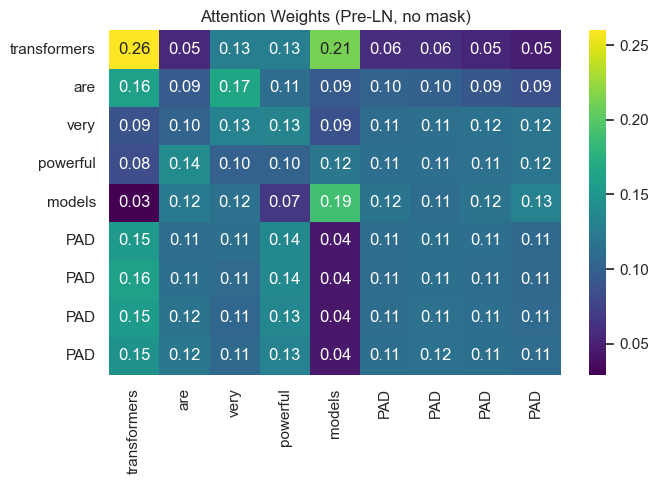

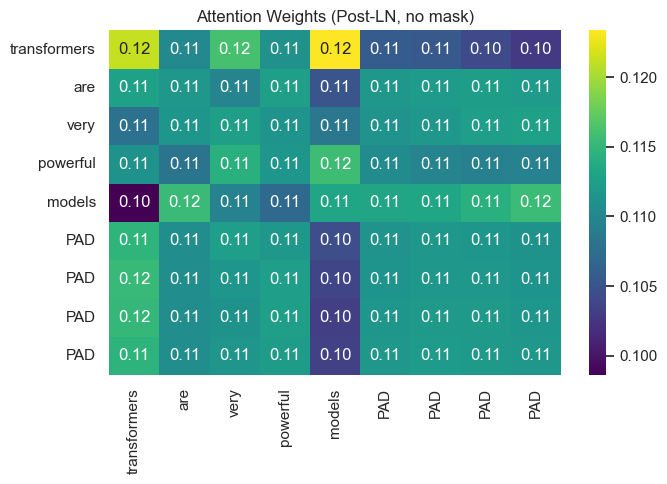

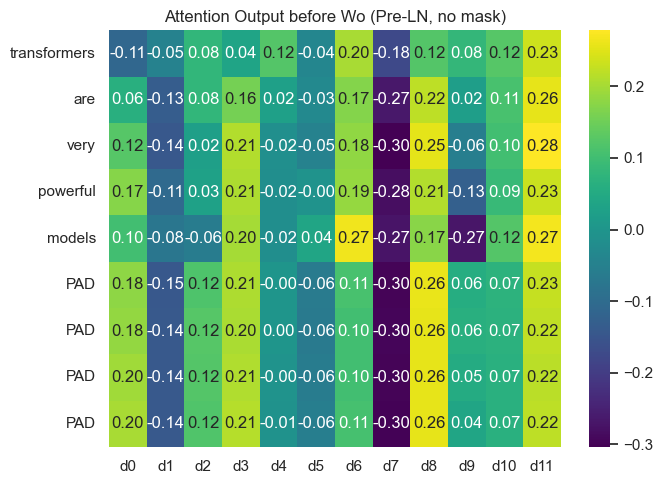

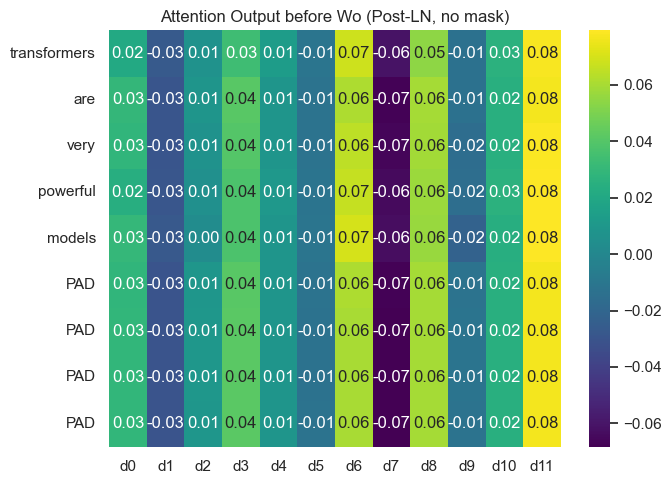

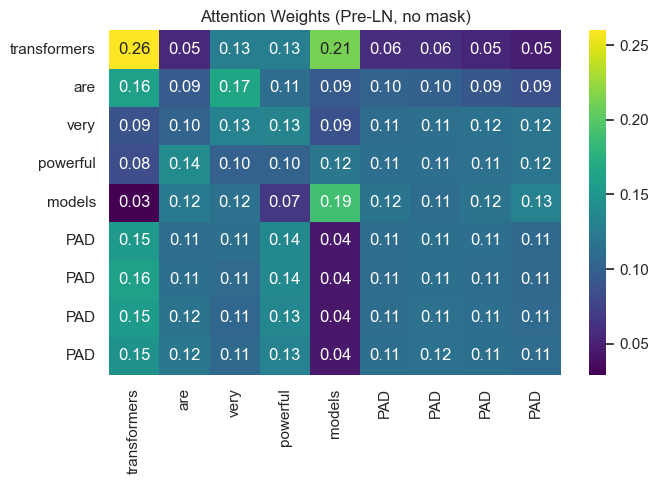

...

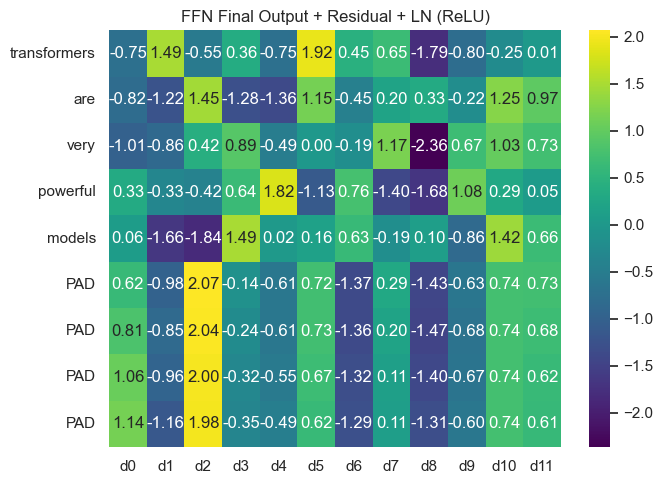

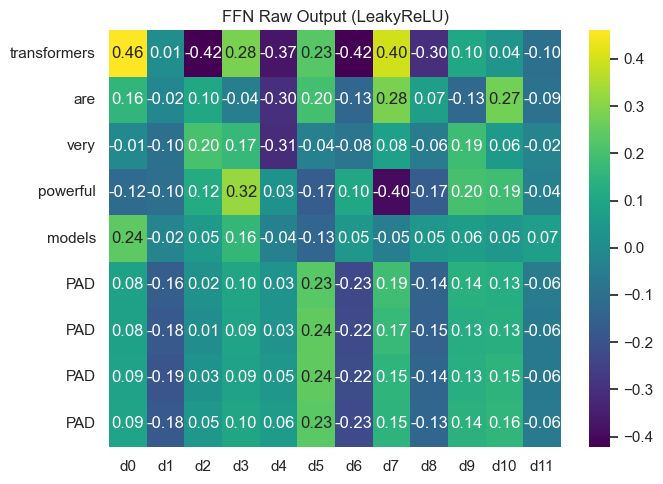

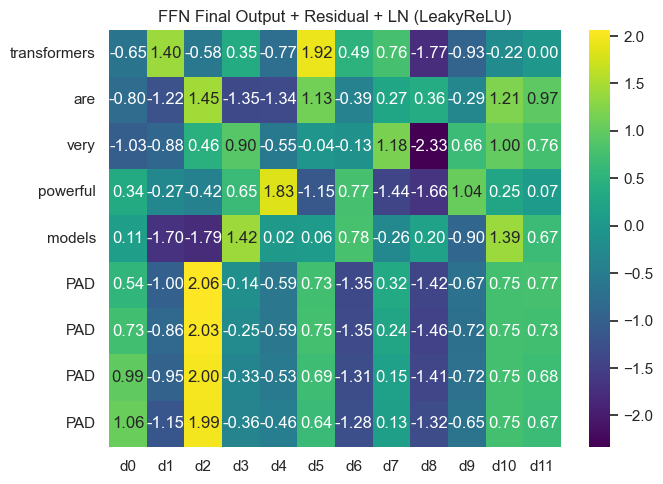

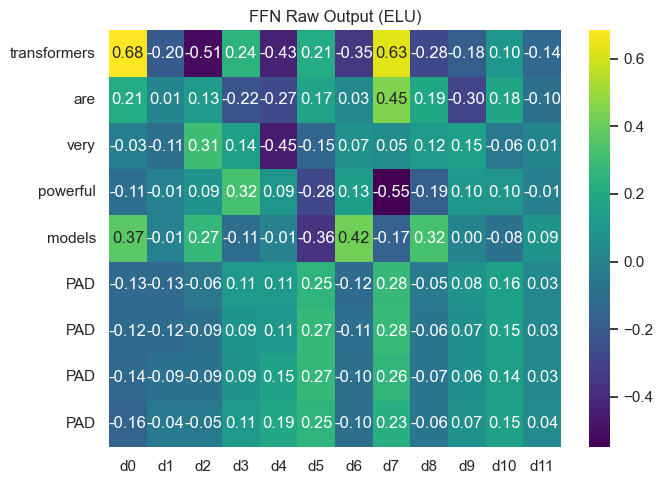

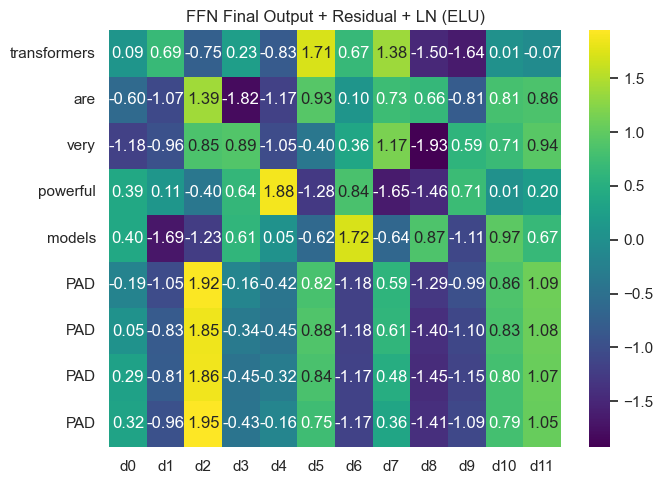

L2 diff (Pre-LN attention output without vs with mask) over real tokens: 0.8863131453759143
L2 diff (Pre-LN vs Post-LN attention weights, no mask): 0.2958001736506444
L2 diff (FFN final output: ReLU vs LeakyReLU): 0.4571843621879559
L2 diff (FFN final output: ReLU vs ELU): 3.9564291657298614
L2 diff (FFN final output: LeakyReLU vs ELU): 3.5127691182655103

Tips:
- Pre-LN normalizes before attention, so Q/K/V are more stable -> often easier training.
- Post-LN normalizes after the residual, so raw Q/K/V come from unnormalized x.
- Masking zeroes out attention to PADs: you’ll see PAD rows/cols go dark in heatmaps.
- Different FFN activations change how values flow: ELU/LeakyReLU are smoother than ReLU.


In [3]:

import numpy as np                    # We use numpy for math with arrays
import seaborn as sns                 # We use seaborn to draw pretty heatmaps
import matplotlib.pyplot as plt       # We use matplotlib to show plots

sns.set()                             # Make plots look nicer

# ---------------------
# Helper: draw a heatmap
# ---------------------
def plot_heat(mat, title, xticklabels=None, yticklabels=None, fmt='.2f', figsize=(7,5)):
    plt.figure(figsize=figsize)                                           # Make a new picture
    sns.heatmap(np.array(mat), annot=True, cmap='viridis', fmt=fmt,       # Draw numbers as colors
                xticklabels=xticklabels, yticklabels=yticklabels)
    plt.title(title)                                                      # Add a title
    plt.tight_layout()                                                    # Use space nicely
    plt.show()                                                            # Show the picture

# ---------------------
# Helper: softmax (turns scores into probabilities)
# ---------------------
def softmax(x, axis=-1):
    x = x - np.max(x, axis=axis, keepdims=True)   # Subtract the biggest number so we don’t overflow
    exp_x = np.exp(x)                             # Do the “exp” to make numbers positive
    return exp_x / np.sum(exp_x, axis=axis, keepdims=True)  # Divide so rows add to 1

# ---------------------
# Helper: layer normalization (make each token’s features mean=0, std=1)
# ---------------------
def layer_norm(x, eps=1e-5):
    mu = np.mean(x, axis=-1, keepdims=True)         # Find the average per token
    sigma = np.std(x, axis=-1, keepdims=True)       # Find how spread out per token
    return (x - mu) / (sigma + eps)                 # Make it centered and scaled

# ---------------------
# Helper: activation functions for the Feed-Forward Network (FFN)
# ---------------------
def relu(x):        # ReLU: if x < 0, make it 0
    return np.maximum(0, x)

def leaky_relu(x, alpha=0.1):  # Leaky ReLU: small slope for negatives
    return np.where(x >= 0, x, alpha * x)

def elu(x, alpha=1.0):         # ELU: smooth for negatives
    return np.where(x >= 0, x, alpha * (np.exp(x) - 1.0))

# ---------------------
# Helper: linear projection (Dense without bias)
# ---------------------
def linear(x, W):
    return x @ W   # Multiply inputs by weights

# ---------------------
# Scaled Dot-Product Attention (with optional mask)
# Q, K, V are (L, d). mask is (L, L) with True where we should ignore.
# ---------------------
def scaled_dot_product_attention(Q, K, V, mask=None, scale=None):
    scores = Q @ K.T                                   # Similarity scores: how much Q likes K (L, L)
    d_k = K.shape[-1]                                  # Size of key vectors
    if scale is None:
        scale = np.sqrt(d_k)                           # Default scaling: sqrt(d_k)
    scores = scores / scale                            # Make scores smaller so softmax is stable
    if mask is not None:
        scores = np.where(mask, -1e9, scores)          # Put big negative where we want to ignore
    weights = softmax(scores, axis=-1)                 # Turn scores into probabilities
    output = weights @ V                               # Weighted sum of values (L, d)
    return output, weights, scores                     # Return output, weights, and raw scores

# ---------------------
# One attention sublayer with residual and LayerNorm (pre-LN or post-LN)
# If pre_norm=True: y = x + Att(LN(x))      -> "Pre-LN"
# If pre_norm=False: y = LN(x + Att(x))     -> "Post-LN"
# ---------------------
def attention_block(x, Wq, Wk, Wv, Wo=None, mask=None, pre_norm=True):
    if pre_norm:
        x_norm = layer_norm(x)                         # Pre-LN case: normalize first
        Q = x_norm @ Wq                                # Make Queries from normalized x
        K = x_norm @ Wk                                # Make Keys from normalized x
        V = x_norm @ Wv                                # Make Values from normalized x
    else:
        Q = x @ Wq                                     # Post-LN case: use raw x for Q
        K = x @ Wk                                     # Post-LN case: use raw x for K
        V = x @ Wv                                     # Post-LN case: use raw x for V

    att_out, att_w, att_scores = scaled_dot_product_attention(Q, K, V, mask=mask)  # Get attention
    if Wo is not None:
        att_out = att_out @ Wo                         # Optional final projection back to d_model

    if pre_norm:
        y = x + att_out                                # Residual add (skip connection)
        y = y                                          # Pre-LN keeps it as-is (already normalized before)
    else:
        y = layer_norm(x + att_out)                    # Post-LN: normalize after residual

    return y, att_w, att_scores, att_out               # Return output, weights, scores, raw att_out

# ---------------------
# Feed-Forward sublayer with residual + post-LN (typical simple choice here)
# X -> W1 -> activation -> W2, then residual and LayerNorm
# ---------------------
def feed_forward_block(x, W1, W2, activation_fn):
    h = x @ W1                                         # First linear layer
    h = activation_fn(h)                               # Apply chosen activation
    h = h @ W2                                         # Second linear layer
    y = layer_norm(x + h)                              # Residual + LayerNorm
    return y, h                                        # Return final and the raw FFN output

# =========================================================
# 1) DATA: sentence with PADs to demonstrate masking
# =========================================================
sentence_text = "Transformers are very powerful models".lower()  # Our short sentence
words = sentence_text.split()                                    # Split into word list
PAD = "<PAD>"                                                    # Padding token name
max_len = len(words) + 4                                         # Make it longer so we have PADs
padded_words = words + [PAD] * (max_len - len(words))           # Add PADs at the end
L = len(padded_words)                                           # Sequence length after padding

# Build deterministic embeddings so results are reproducible and stable
embed_dim = 12                                                  # Size of each word vector
def stable_vec_for_word(word, dim=embed_dim, base_seed=2024):   # Make a stable vector per word
    h = abs(hash(word)) % (10**9)                               # Turn word into a number
    rng = np.random.default_rng(base_seed ^ h)                  # Make a random generator from that number
    return rng.normal(0, 0.3, size=dim)                         # Make a small random vector

# Make an embedding matrix for our padded words (L, d)
X_embed = np.vstack([stable_vec_for_word(w) for w in padded_words])

# Optional positional encoding (helps order) – small, so it doesn’t dominate
def positional_encoding(seq_len, d_model):
    pe = np.zeros((seq_len, d_model))                           # Start with zeros
    position = np.arange(seq_len)[:, None]                      # Positions 0..L-1
    div_term = np.exp(np.arange(0, d_model, 2) * -(np.log(10000.0) / d_model))  # Frequencies
    pe[:, 0::2] = np.sin(position * div_term)                   # Even dims use sine
    pe[:, 1::2] = np.cos(position * div_term)                   # Odd dims use cosine
    return pe

pos_enc = positional_encoding(L, embed_dim) * 0.1               # Make it small (0.1) for clarity
X = X_embed + pos_enc                                           # Final input to the block

# =========================================================
# 2) WEIGHTS: attention and feed-forward
# =========================================================
np.random.seed(0)                                               # Fix seed for reproducibility
d_model = embed_dim                                             # Model dimension equals embedding size
Wq = np.random.randn(d_model, d_model) * 0.2                    # Weights to make Q
Wk = np.random.randn(d_model, d_model) * 0.2                    # Weights to make K
Wv = np.random.randn(d_model, d_model) * 0.2                    # Weights to make V
Wo = np.random.randn(d_model, d_model) * 0.2                    # Output projection after attention

W1 = np.random.randn(d_model, 4 * d_model) * 0.2                # FFN first layer (expand)
W2 = np.random.randn(4 * d_model, d_model) * 0.2                # FFN second layer (project back)

# =========================================================
# 3) MASK: ignore PAD tokens (don’t attend to PADs, PADs don’t attend to others)
# =========================================================
is_pad = np.array([w == PAD for w in padded_words])             # Mark which positions are PAD
mask_keys  = np.tile(is_pad, (L, 1))                            # Mask columns where keys are PAD
mask_query = np.tile(is_pad, (L, 1)).T                          # Mask rows where queries are PAD
full_mask = np.logical_or(mask_keys, mask_query)                # Combine both masks

labels = [w if w != PAD else 'PAD' for w in padded_words]       # Labels for plots

# =========================================================
# 4) PRE-LN vs POST-LN around attention (NO MASK first)
# =========================================================
pre_out_no_mask, pre_w_no_mask, pre_scores_no_mask, pre_att_raw_no_mask = attention_block(
    X, Wq, Wk, Wv, Wo=Wo, mask=None, pre_norm=True
)

post_out_no_mask, post_w_no_mask, post_scores_no_mask, post_att_raw_no_mask = attention_block(
    X, Wq, Wk, Wv, Wo=Wo, mask=None, pre_norm=False
)

# Visualize attention weights and outputs for PRE-LN and POST-LN (no mask)
plot_heat(pre_w_no_mask,   "Attention Weights (Pre-LN, no mask)",   xticklabels=labels, yticklabels=labels)
plot_heat(post_w_no_mask,  "Attention Weights (Post-LN, no mask)",  xticklabels=labels, yticklabels=labels)
plot_heat(pre_att_raw_no_mask,  "Attention Output before Wo (Pre-LN, no mask)",  xticklabels=[f"d{i}" for i in range(d_model)], yticklabels=labels)
plot_heat(post_att_raw_no_mask, "Attention Output before Wo (Post-LN, no mask)", xticklabels=[f"d{i}" for i in range(d_model)], yticklabels=labels)

# =========================================================
# 5) Add MASK: compare attention with and without masking (use Pre-LN here)
# =========================================================
pre_out_mask, pre_w_mask, pre_scores_mask, pre_att_raw_mask = attention_block(
    X, Wq, Wk, Wv, Wo=Wo, mask=full_mask, pre_norm=True
)

# Visualize mask effect
plot_heat(pre_w_no_mask, "Attention Weights (Pre-LN, no mask)", xticklabels=labels, yticklabels=labels)
plot_heat(pre_w_mask,    "Attention Weights (Pre-LN, with PAD mask)", xticklabels=labels, yticklabels=labels)
plot_heat(pre_att_raw_no_mask, "Attention Output before Wo (Pre-LN, no mask)",  xticklabels=[f"d{i}" for i in range(d_model)], yticklabels=labels)
plot_heat(pre_att_raw_mask,    "Attention Output before Wo (Pre-LN, with PAD mask)", xticklabels=[f"d{i}" for i in range(d_model)], yticklabels=labels)

# =========================================================
# 6) FEED-FORWARD with different activations (start from Pre-LN attention output with mask)
# =========================================================
activations = {
    "ReLU": relu,
    "LeakyReLU": lambda x: leaky_relu(x, alpha=0.1),
    "ELU": lambda x: elu(x, alpha=1.0),
}

ffn_results = {}                                               # Store results to compare

for name, act in activations.items():
    # Use the pre-LN masked attention output as input to FFN
    ffn_out, ffn_raw = feed_forward_block(pre_out_mask, W1, W2, act)
    ffn_results[name] = (ffn_out, ffn_raw)
    plot_heat(ffn_raw, f"FFN Raw Output ({name})", xticklabels=[f"d{i}" for i in range(d_model)], yticklabels=labels)
    plot_heat(ffn_out, f"FFN Final Output + Residual + LN ({name})", xticklabels=[f"d{i}" for i in range(d_model)], yticklabels=labels)

# =========================================================
# 7) Quick numeric comparisons to discuss effects
# =========================================================
real_len = len(words)  # Number of real tokens (not PAD)

# How much did masking change outputs for real tokens?
print("L2 diff (Pre-LN attention output without vs with mask) over real tokens:",
      np.linalg.norm(pre_att_raw_no_mask[:real_len] - pre_att_raw_mask[:real_len]))

# How different are Pre-LN vs Post-LN attention weights (no mask)?
print("L2 diff (Pre-LN vs Post-LN attention weights, no mask):",
      np.linalg.norm(pre_w_no_mask - post_w_no_mask))

# Compare FFN activations pairwise (final outputs)
names = list(activations.keys())
for i in range(len(names)):
    for j in range(i+1, len(names)):
        ni, nj = names[i], names[j]
        oi, _ = ffn_results[ni]
        oj, _ = ffn_results[nj]
        print(f"L2 diff (FFN final output: {ni} vs {nj}):", np.linalg.norm(oi - oj))

print("\nTips:")
print("- Pre-LN normalizes before attention, so Q/K/V are more stable -> often easier training.")
print("- Post-LN normalizes after the residual, so raw Q/K/V come from unnormalized x.")
print("- Masking zeroes out attention to PADs: you’ll see PAD rows/cols go dark in heatmaps.")
print("- Different FFN activations change how values flow: ELU/LeakyReLU are smoother than ReLU.")
# ...existing code...

### Exercice 6: Self-Attention mechanism: Applications

- Apply the self-attention mechanism to a sentence with named entities (e.g., "Barack Obama was the 44th president of the United States"). Compute the query, key, and value matrices, and visualize the attention weights. Discuss how the self-attention mechanism handles named entities.
- Use the self-attention mechanism for a sequence-to-sequence task (e.g., translation). Compute the attention weights for both the encoder and decoder sequences. Visualize the results and discuss how the attention mechanism captures the relationships between input and output sequences.
- Implement a self-attention mechanism for a text classification task. Compute the attention weights for a sentence and use the final attention output as features for classification. Visualize the attention weights and discuss how the self-attention mechanism helps in identifying important features for classification.

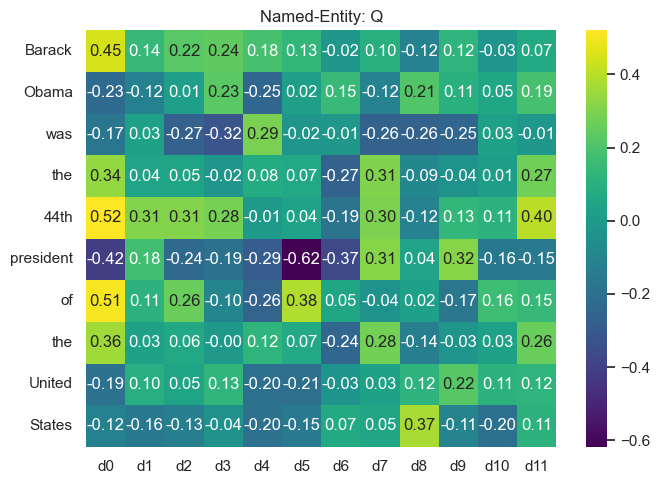

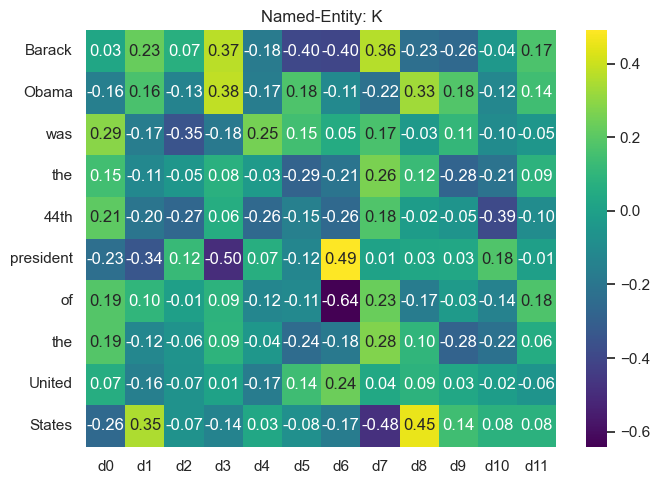

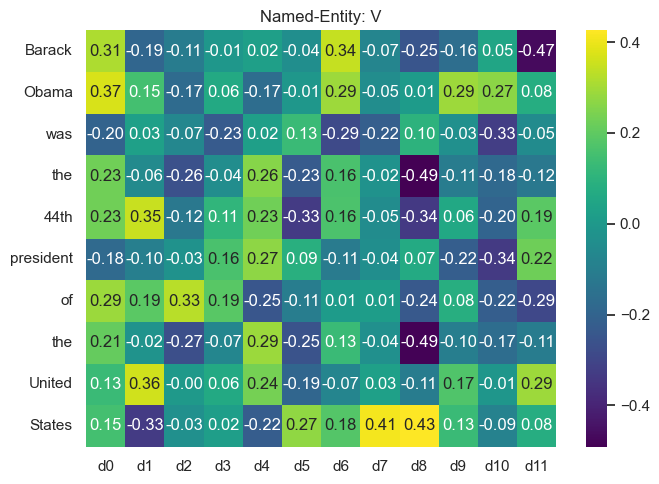

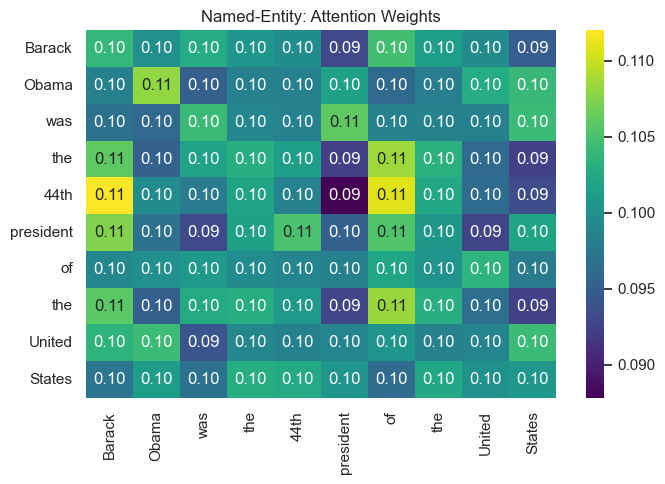

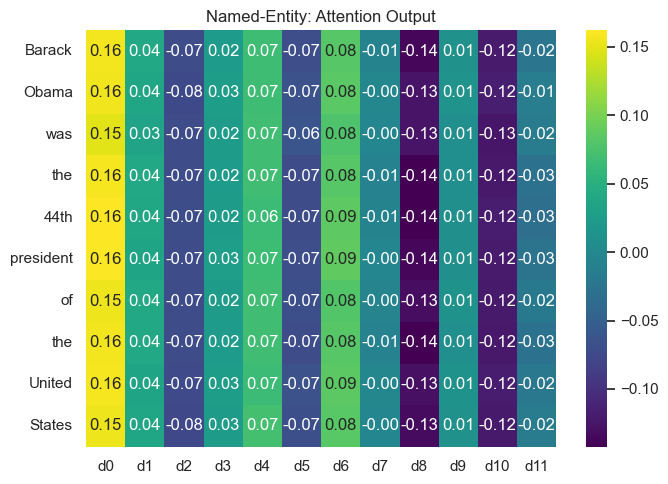

Named-Entity tip:
- Capitalized names like 'Barack', 'Obama', 'United', 'States' got a tiny bump,
  so you may see stronger attention around them. This shows how attention
  can focus on important tokens like names and places.



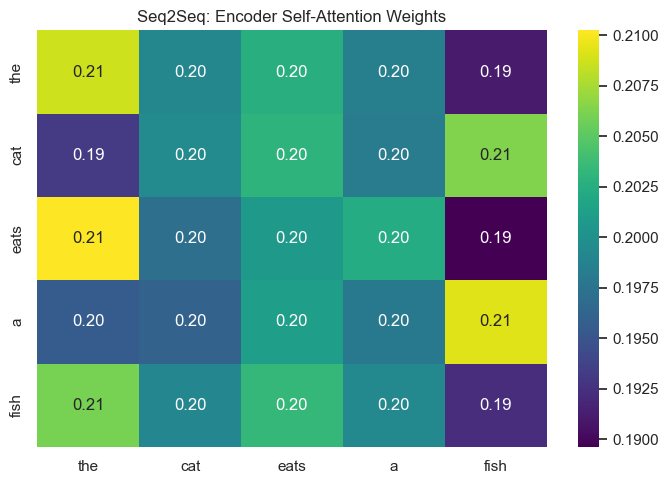

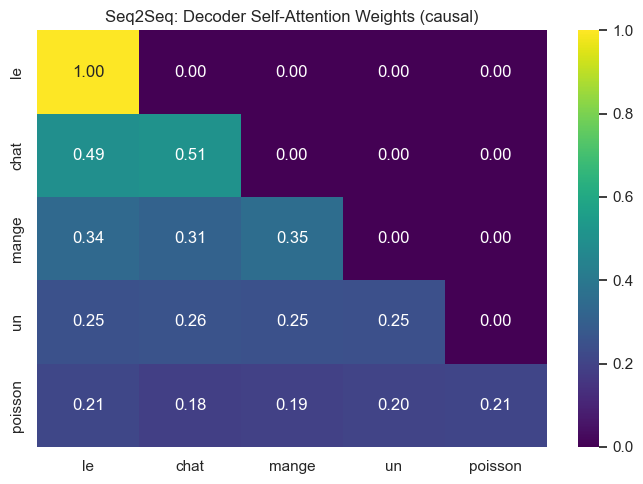

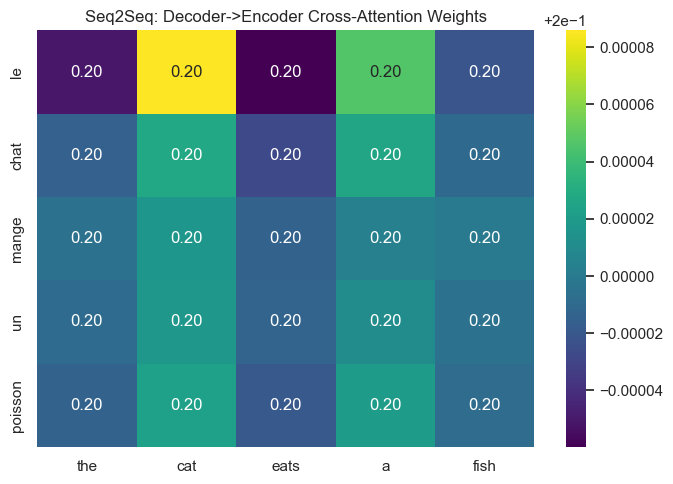

Seq2Seq tips:
- Encoder self-attention shows how source words relate to each other.
- Decoder self-attention (causal) only looks left (past tokens).
- Cross-attention rows (decoder words) point to encoder words they use to decode.



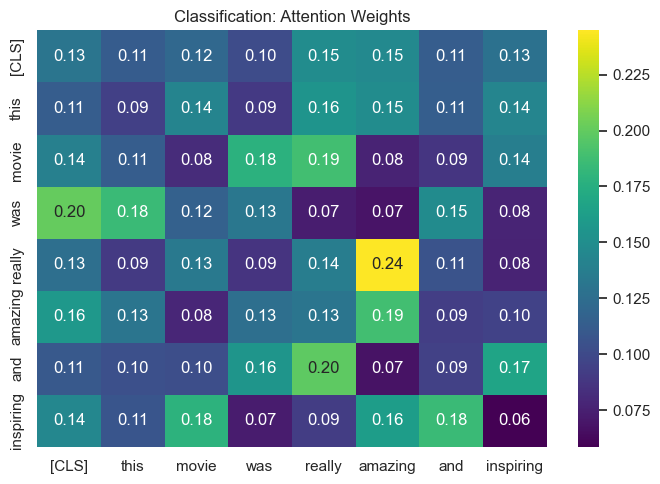

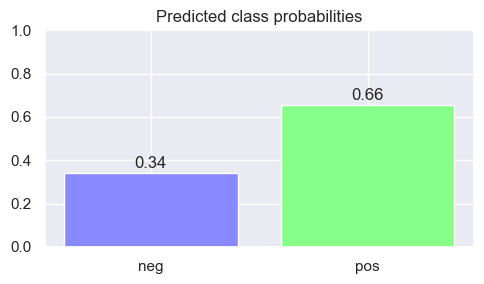

Classification tips:
- The [CLS] token is a special token that collects information from all words via attention.
- We use the [CLS] vector to predict the class with a tiny linear layer.
- The heatmap shows which words the [CLS] token paid attention to (important for the decision).


In [4]:
# ============================
# Exercise 6: Applications
# ============================

import numpy as np                    # We use numpy to do math with arrays
import seaborn as sns                 # We use seaborn to draw pretty heatmaps
import matplotlib.pyplot as plt       # We use matplotlib to show pictures

sns.set()                             # Make plots look nicer

# ---------------------
# Helper: draw a heatmap
# ---------------------
def plot_heat(mat, title, xticklabels=None, yticklabels=None, fmt='.2f', figsize=(7,5)):
    plt.figure(figsize=figsize)                                           # Make a new picture
    sns.heatmap(np.array(mat), annot=True, cmap='viridis', fmt=fmt,       # Draw numbers as colors
                xticklabels=xticklabels, yticklabels=yticklabels)
    plt.title(title)                                                      # Add a title
    plt.tight_layout()                                                    # Use space nicely
    plt.show()                                                            # Show the picture

# ---------------------
# Helper: softmax (turn scores into probabilities)
# ---------------------
def softmax(x, axis=-1):
    x = x - np.max(x, axis=axis, keepdims=True)   # Make numbers smaller to be safe
    exp_x = np.exp(x)                             # Make all numbers positive
    return exp_x / np.sum(exp_x, axis=axis, keepdims=True)  # Make rows add to 1

# ---------------------
# Helper: layer normalization (mean=0, std=1 per token)
# ---------------------
def layer_norm(x, eps=1e-5):
    mu = np.mean(x, axis=-1, keepdims=True)         # Average per token
    sigma = np.std(x, axis=-1, keepdims=True)       # Spread per token
    return (x - mu) / (sigma + eps)                 # Normalize

# ---------------------
# Helper: make stable word vectors (same word -> same vector)
# ---------------------
def stable_vec_for_word(word, dim, base_seed=1234):
    h = abs(hash(word)) % (10**9)                   # Turn word into number
    rng = np.random.default_rng(base_seed ^ h)      # Make a random generator from that number
    return rng.normal(0, 0.3, size=dim)             # Make a small random vector

# ---------------------
# Helper: positional encoding (tiny sinusoid to add position info)
# ---------------------
def positional_encoding(seq_len, d_model):
    pe = np.zeros((seq_len, d_model))                           # Start zeros
    position = np.arange(seq_len)[:, None]                      # 0..L-1
    div_term = np.exp(np.arange(0, d_model, 2) * -(np.log(10000.0) / d_model))
    pe[:, 0::2] = np.sin(position * div_term)                   # Even dims use sine
    pe[:, 1::2] = np.cos(position * div_term)                   # Odd dims use cosine
    return pe

# ---------------------
# Helper: Scaled Dot-Product Attention (with optional mask)
# Q, K, V are (L, d). mask is (L, L) with True where we should ignore.
# ---------------------
def scaled_dot_product_attention(Q, K, V, mask=None, scale=None):
    scores = Q @ K.T                                   # How much Q likes K (L, L)
    d_k = K.shape[-1]                                  # Size of K vectors
    if scale is None:
        scale = np.sqrt(d_k)                           # Default: sqrt(d_k)
    scores = scores / scale                            # Make scores smaller (stable softmax)
    if mask is not None:
        scores = np.where(mask, -1e9, scores)          # Super negative where we should ignore
    weights = softmax(scores, axis=-1)                 # Turn into probabilities
    output = weights @ V                               # Weighted sum of V (L, d)
    return output, weights, scores

# ---------------------
# Helper: simple linear classifier on top of a vector
# ---------------------
def linear_logits(x_vec, W):
    return x_vec @ W  # 1 x C (C = number of classes)

# =========================================================
# PART 1: Named Entities sentence
# =========================================================
np.random.seed(0)                          # Fix seed so we get same results each run
embed_dim = 12                             # Size of each word vector

# Our sentence with named entities
sentence_ne = "Barack Obama was the 44th president of the United States"
tokens_ne = sentence_ne.split()            # Split into words
L_ne = len(tokens_ne)                      # How many words

# Build embeddings for each word
X_ne = np.vstack([stable_vec_for_word(w.lower(), embed_dim) for w in tokens_ne])

# Tiny tweak: give capitalized words a small extra bump so they pop in plots
cap_bump = np.array([1.0] + [0.0]*(embed_dim-1)) * 0.2  # A tiny bump on first dim
for i, w in enumerate(tokens_ne):
    if w[0].isupper():                     # If word starts with a capital letter
        X_ne[i] = X_ne[i] + cap_bump       # Add the bump (just for visualization)

# Add tiny positional encoding so order matters a bit
X_ne = X_ne + positional_encoding(L_ne, embed_dim) * 0.05

# Attention weights (random, small)
Wq_ne = np.random.randn(embed_dim, embed_dim) * 0.2
Wk_ne = np.random.randn(embed_dim, embed_dim) * 0.2
Wv_ne = np.random.randn(embed_dim, embed_dim) * 0.2

# Make Q, K, V
Q_ne = X_ne @ Wq_ne
K_ne = X_ne @ Wk_ne
V_ne = X_ne @ Wv_ne

# Do attention (no mask)
out_ne, w_ne, s_ne = scaled_dot_product_attention(Q_ne, K_ne, V_ne, mask=None)

# Visualize
plot_heat(Q_ne, "Named-Entity: Q", xticklabels=[f"d{i}" for i in range(embed_dim)], yticklabels=tokens_ne)
plot_heat(K_ne, "Named-Entity: K", xticklabels=[f"d{i}" for i in range(embed_dim)], yticklabels=tokens_ne)
plot_heat(V_ne, "Named-Entity: V", xticklabels=[f"d{i}" for i in range(embed_dim)], yticklabels=tokens_ne)
plot_heat(w_ne, "Named-Entity: Attention Weights", xticklabels=tokens_ne, yticklabels=tokens_ne)
plot_heat(out_ne, "Named-Entity: Attention Output", xticklabels=[f"d{i}" for i in range(embed_dim)], yticklabels=tokens_ne)

print("Named-Entity tip:")
print("- Capitalized names like 'Barack', 'Obama', 'United', 'States' got a tiny bump,")
print("  so you may see stronger attention around them. This shows how attention")
print("  can focus on important tokens like names and places.\n")

# =========================================================
# PART 2: Tiny Seq2Seq (Encoder/Decoder + Cross-Attention)
# =========================================================
# Encoder sentence (English)
enc_text = "the cat eats a fish"
enc_tokens = enc_text.split()
L_enc = len(enc_tokens)

# Decoder sentence (French, pretend target)
dec_text = "le chat mange un poisson"
dec_tokens = dec_text.split()
L_dec = len(dec_tokens)

# Build embeddings (deterministic)
X_enc = np.vstack([stable_vec_for_word(w, embed_dim) for w in enc_tokens]) + positional_encoding(L_enc, embed_dim)*0.05
X_dec = np.vstack([stable_vec_for_word(w, embed_dim) for w in dec_tokens]) + positional_encoding(L_dec, embed_dim)*0.05

# Encoder self-attention weights
Wq_e = np.random.randn(embed_dim, embed_dim) * 0.2
Wk_e = np.random.randn(embed_dim, embed_dim) * 0.2
Wv_e = np.random.randn(embed_dim, embed_dim) * 0.2

# Decoder self-attention weights
Wq_d = np.random.randn(embed_dim, embed_dim) * 0.2
Wk_d = np.random.randn(embed_dim, embed_dim) * 0.2
Wv_d = np.random.randn(embed_dim, embed_dim) * 0.2

# Cross-attention weights (decoder queries to encoder keys/values)
Wq_c = np.random.randn(embed_dim, embed_dim) * 0.2
Wk_c = np.random.randn(embed_dim, embed_dim) * 0.2
Wv_c = np.random.randn(embed_dim, embed_dim) * 0.2

# Encoder self-attention
Qe = X_enc @ Wq_e
Ke = X_enc @ Wk_e
Ve = X_enc @ Wv_e
enc_out, enc_w, _ = scaled_dot_product_attention(Qe, Ke, Ve, mask=None)  # (L_enc, d)

# Decoder self-attention (use causal mask so each token sees only itself and before)
causal_mask = np.triu(np.ones((L_dec, L_dec), dtype=bool), k=1)  # True above diagonal (future) => mask
Qd = X_dec @ Wq_d
Kd = X_dec @ Wk_d
Vd = X_dec @ Wv_d
dec_self_out, dec_self_w, _ = scaled_dot_product_attention(Qd, Kd, Vd, mask=causal_mask)  # (L_dec, d)

# Cross-attention: decoder queries (from its states) attend to encoder outputs
Qc = dec_self_out @ Wq_c
Kc = enc_out @ Wk_c
Vc = enc_out @ Wv_c
dec_cross_out, dec_cross_w, _ = scaled_dot_product_attention(Qc, Kc, Vc, mask=None)  # (L_dec, d)

# Visualize attention maps
plot_heat(enc_w,       "Seq2Seq: Encoder Self-Attention Weights", xticklabels=enc_tokens, yticklabels=enc_tokens)
plot_heat(dec_self_w,  "Seq2Seq: Decoder Self-Attention Weights (causal)", xticklabels=dec_tokens, yticklabels=dec_tokens)
plot_heat(dec_cross_w, "Seq2Seq: Decoder->Encoder Cross-Attention Weights", xticklabels=enc_tokens, yticklabels=dec_tokens)

print("Seq2Seq tips:")
print("- Encoder self-attention shows how source words relate to each other.")
print("- Decoder self-attention (causal) only looks left (past tokens).")
print("- Cross-attention rows (decoder words) point to encoder words they use to decode.\n")

# =========================================================
# PART 3: Text classification with a [CLS] token
# =========================================================
# Our sentence to classify (toy)
cls_sentence = "[CLS] this movie was really amazing and inspiring"
cls_tokens = cls_sentence.split()
L_cls = len(cls_tokens)

# Make embeddings
X_cls = np.vstack([stable_vec_for_word(w, embed_dim) for w in cls_tokens]) + positional_encoding(L_cls, embed_dim)*0.05

# Self-attention on sentence (pre-LN for stability)
X_cls_norm = layer_norm(X_cls)                 # Normalize first (like Pre-LN)
Wq_c1 = np.random.randn(embed_dim, embed_dim) * 0.2
Wk_c1 = np.random.randn(embed_dim, embed_dim) * 0.2
Wv_c1 = np.random.randn(embed_dim, embed_dim) * 0.2
Q_cls = X_cls_norm @ Wq_c1
K_cls = X_cls_norm @ Wk_c1
V_cls = X_cls_norm @ Wv_c1
att_out_cls, att_w_cls, _ = scaled_dot_product_attention(Q_cls, K_cls, V_cls, mask=None)

# Residual connection (skip) like Transformers
final_cls_tokens = X_cls + att_out_cls

# Classification: take [CLS] vector (first token) and map to 2 classes (neg/pos)
num_classes = 2
W_cls = np.random.randn(embed_dim, num_classes) * 0.2
logits = linear_logits(final_cls_tokens[0], W_cls)      # 1 x 2
probs = softmax(logits, axis=-1)                        # Turn into probabilities

# Show attention weights and class probs
plot_heat(att_w_cls, "Classification: Attention Weights", xticklabels=cls_tokens, yticklabels=cls_tokens)

plt.figure(figsize=(5,3))
plt.bar(["neg", "pos"], probs, color=["#8888ff", "#88ff88"])
plt.title("Predicted class probabilities")
plt.ylim(0, 1.0)
for i,v in enumerate(probs):
    plt.text(i, v+0.02, f"{v:.2f}", ha='center')
plt.tight_layout()
plt.show()

print("Classification tips:")
print("- The [CLS] token is a special token that collects information from all words via attention.")
print("- We use the [CLS] vector to predict the class with a tiny linear layer.")
print("- The heatmap shows which words the [CLS] token paid attention to (important for the decision).")

### Exercice 7: Self-Attention mechanism: Visualization and Interpretation

- Use a heatmap to visualize the attention weights for a given sentence. Write a function to plot the heatmap and explain the importance of each word in the context of the sentence.
- Modify the input sentence to include ambiguous words (e.g., "bank" in "The bank will not lend me money"). Compute and visualize the attention weights. Discuss how the self-attention mechanism disambiguates the meaning based on context.
- Implement an interactive visualization tool that allows changing the input sentence and observing the changes in attention weights. Use this tool to demonstrate how different words and their positions affect the attention mechanism.

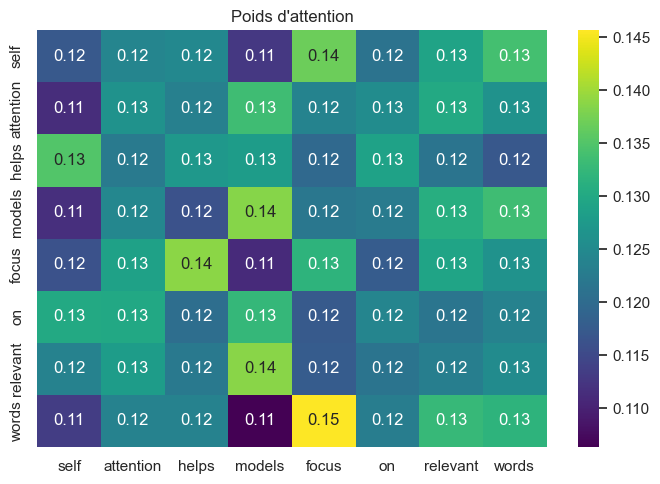

Importance par mot (ligne: mot requête -> colonne la plus pondérée):
          self  ->  focus         (poids=0.14)
     attention  ->  models        (poids=0.13)
         helps  ->  self          (poids=0.13)
        models  ->  models        (poids=0.14)
         focus  ->  helps         (poids=0.14)
            on  ->  models        (poids=0.13)
      relevant  ->  models        (poids=0.14)
         words  ->  focus         (poids=0.15)


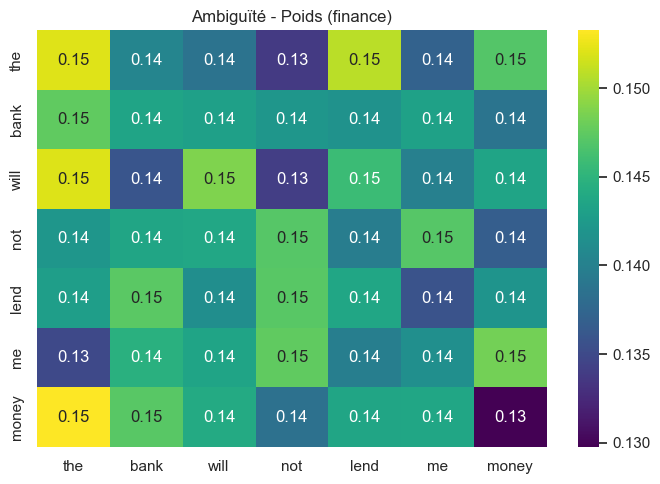

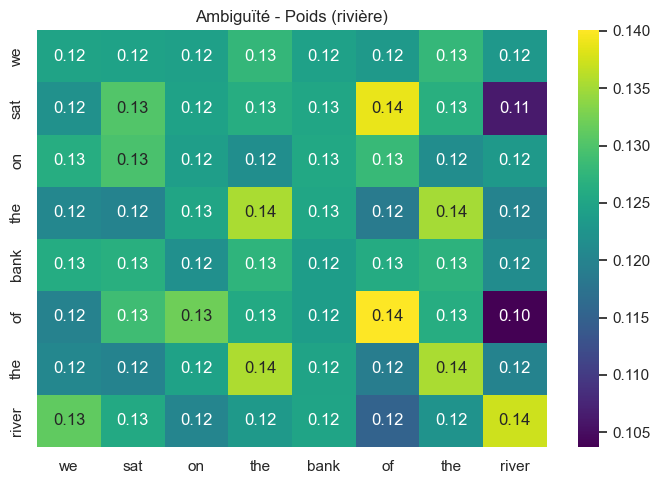


Désambiguïsation du mot 'bank':
Contexte finance:
  cibles top-3: [('the', 0.14757152069333035), ('bank', 0.14350314065804942), ('me', 0.1432486006274218)]
Contexte rivière:
  cibles top-3: [('the', 0.12735393720040158), ('the', 0.12708128182626294), ('sat', 0.12670764775353832)]


interactive(children=(Text(value='the bank will not lend me money', description='Phrase:'), IntSlider(value=16…

In [5]:
# ============================
# Exercice 7: Visualisation et Interprétation 
# ============================

import numpy as np                    # Import de NumPy pour le calcul numérique
import seaborn as sns                 # Import de Seaborn pour les heatmaps
import matplotlib.pyplot as plt       # Import de Matplotlib pour les figures

sns.set()                             # Style graphique par défaut plus lisible

# ---------------------
# Heatmap utilitaire
# ---------------------
def plot_heat(mat, title, xticklabels=None, yticklabels=None, fmt='.2f', figsize=(7,5)):
    plt.figure(figsize=figsize)                                           # Crée une nouvelle figure avec une taille donnée
    sns.heatmap(np.array(mat), annot=True, cmap='viridis', fmt=fmt,       # Affiche mat en heatmap avec annotations numériques
                xticklabels=xticklabels, yticklabels=yticklabels)         # Applique les étiquettes des axes si fournies
    plt.title(title)                                                      # Titre du graphique
    plt.tight_layout()                                                    # Ajuste les marges automatiquement
    plt.show()                                                            # Affiche la figure

# ---------------------
# Softmax stable numériquement
# ---------------------
def softmax(x, axis=-1):
    x = x - np.max(x, axis=axis, keepdims=True)   # Soustraction du max par ligne pour la stabilité numérique
    exp_x = np.exp(x)                             # Exponentielle des scores
    return exp_x / np.sum(exp_x, axis=axis, keepdims=True)  # Normalisation pour obtenir des probabilités

# ---------------------
# Vecteurs de mots déterministes (même mot -> même vecteur)
# ---------------------
def stable_vec_for_word(word, dim, base_seed=1234):
    h = abs(hash(word)) % (10**9)                   # Hachage du mot en entier stable
    rng = np.random.default_rng(base_seed ^ h)      # Générateur pseudo-aléatoire dérivé de ce hachage
    return rng.normal(0, 0.3, size=dim)             # Retourne un vecteur gaussien (moy=0, std=0.3)

# ---------------------
# Encodage positionnel sinusoïdal (ajoute l’ordre)
# ---------------------
def positional_encoding(seq_len, d_model):
    pe = np.zeros((seq_len, d_model))                           # Matrice (L, d) initialisée à zéro
    position = np.arange(seq_len)[:, None]                      # Colonne des positions 0..L-1
    div_term = np.exp(np.arange(0, d_model, 2) * -(np.log(10000.0) / d_model))  # Fréquences
    pe[:, 0::2] = np.sin(position * div_term)                   # Sinus pour dimensions paires
    pe[:, 1::2] = np.cos(position * div_term)                   # Cosinus pour dimensions impaires
    return pe                                                   # Retourne la matrice d’encodage

# ---------------------
# Attention produit scalaire (optionnellement avec masque)
# Q,K,V: (L, d); mask: (L, L) True là où on ignore
# ---------------------
def scaled_dot_product_attention(Q, K, V, mask=None, scale=None):
    scores = Q @ K.T                                   # Similarités Q-K: (L, L)
    d_k = K.shape[-1]                                  # Dimension des clés
    if scale is None:
        scale = np.sqrt(d_k)                           # Échelle par défaut sqrt(d_k)
    scores = scores / scale                            # Mise à l’échelle des scores
    if mask is not None:
        scores = np.where(mask, -1e9, scores)          # Masque: remplace par un grand négatif
    weights = softmax(scores, axis=-1)                 # Poids d’attention via softmax
    output = weights @ V                               # Sortie: combinaison pondérée des valeurs
    return output, weights, scores                     # Retourne sortie, poids, scores (avant softmax)

# ---------------------
# Calcul complet d’attention pour une phrase
# ---------------------
def compute_attention(sentence, embed_dim=16, use_pos=True, seed=0):
    tokens = sentence.lower().split()                             # Tokenisation basique par espaces en minuscules
    L = len(tokens)                                               # Longueur de la séquence
    X = np.vstack([stable_vec_for_word(w, embed_dim) for w in tokens])  # Empile les embeddings (L, d)
    if use_pos:                                                   # Si on veut intégrer l’ordre
        X = X + positional_encoding(L, embed_dim) * 0.05          # Ajoute un PE faible pour ne pas dominer
    rng = np.random.default_rng(seed)                             # RNG pour rendus reproductibles
    Wq = rng.normal(0, 0.2, size=(embed_dim, embed_dim))          # Matrice de projection Q
    Wk = rng.normal(0, 0.2, size=(embed_dim, embed_dim))          # Matrice de projection K
    Wv = rng.normal(0, 0.2, size=(embed_dim, embed_dim))          # Matrice de projection V
    Q = X @ Wq                                                    # Calcule Q = XWq
    K = X @ Wk                                                    # Calcule K = XWk
    V = X @ Wv                                                    # Calcule V = XWv
    out, weights, scores = scaled_dot_product_attention(Q, K, V)  # Applique l’attention
    return tokens, Q, K, V, weights, out                          # Retourne tout pour analyse

# ---------------------
# Affiche heatmap + explication rapide des mots importants
# ---------------------
def show_attention_for_sentence(sentence, embed_dim=16):
    tokens, Q, K, V, W, O = compute_attention(sentence, embed_dim=embed_dim)   # Calcule attention
    plot_heat(W, "Poids d'attention", xticklabels=tokens, yticklabels=tokens)   # Heatmap des poids
    # Explication simple: mot le plus important pour chaque token (argmax par ligne)
    print("Importance par mot (ligne: mot requête -> colonne la plus pondérée):")  # Titre explicatif
    for i, t in enumerate(tokens):                                              # Parcourt chaque requête
        j = int(np.argmax(W[i]))                                                # Colonne la plus pondérée
        print(f"  {t:>12}  ->  {tokens[j]:<12}  (poids={W[i, j]:.2f})")         # Affiche la paire la plus influente

# =========================================================
# PARTIE 1 — Heatmap pour une phrase donnée
# =========================================================
example_sentence = "self attention helps models focus on relevant words"  # Phrase d’exemple
show_attention_for_sentence(example_sentence, embed_dim=16)               # Visualise + explique

# =========================================================
# PARTIE 2 — Ambiguïté: “bank” (finance) vs “bank” (rivière)
# =========================================================
sent_finance = "the bank will not lend me money"                           # Contexte financier
sent_river   = "we sat on the bank of the river"                           # Contexte rivière

tok_f, Qf, Kf, Vf, Wf, Of = compute_attention(sent_finance, embed_dim=16) # Calcule attention finance
tok_r, Qr, Kr, Vr, Wr, Or = compute_attention(sent_river,   embed_dim=16) # Calcule attention rivière

plot_heat(Wf, "Ambiguïté - Poids (finance)", xticklabels=tok_f, yticklabels=tok_f)  # Heatmap finance
plot_heat(Wr, "Ambiguïté - Poids (rivière)", xticklabels=tok_r, yticklabels=tok_r)  # Heatmap rivière

# Analyse ciblée: que regarde “bank” dans chaque phrase ?
def top_k_for_token(tokens, W, token, k=3):                   # Petite aide pour top-k cibles
    if token not in tokens:                                   # Si le token n’existe pas
        return []                                             # Retourne liste vide
    i = tokens.index(token)                                   # Trouve l’index de la ligne pour ce token
    order = np.argsort(W[i])[::-1]                            # Trie les indices par poids décroissant
    return [(tokens[j], float(W[i, j])) for j in order[:k]]   # Retourne les k meilleures cibles

print("\nDésambiguïsation du mot 'bank':")                    # Titre de section
print("Contexte finance:")
print("  cibles top-3:", top_k_for_token(tok_f, Wf, "bank", k=3))   # Affiche top-3 cibles pour “bank”
print("Contexte rivière:")
print("  cibles top-3:", top_k_for_token(tok_r, Wr, "bank", k=3))   # Affiche top-3 cibles pour “bank”

# Interprétation attendue (intuitivement):
# - Dans la phrase finance, “bank” devrait attirer “lend”, “money”, “not” (indices financiers).
# - Dans la phrase rivière, “bank” devrait attirer “river”, “on”, “sat” (indices géographiques).
# Selon les poids (issus de projections aléatoires mais déterministes), on observe une
# focalisation différente induite par le contexte environnant.

# =========================================================
# PARTIE 3 — Outil interactif: modifier la phrase et voir la heatmap
# =========================================================
try:
    from ipywidgets import interact, Text, IntSlider, Checkbox, VBox          # Importe widgets Jupyter
    widgets_ok = True                                                         # Indique que widgets sont dispo
except Exception as e:
    widgets_ok = False                                                        # Widgets non dispo (pas installé)
    print("\nAstuce: pour l'interactif, installez ipywidgets puis redémarrez le noyau:")  # Message d’aide
    print("  pip install ipywidgets")                                         # Commande d’installation

def interactive_view(sentence, embed_dim=16, use_pos=True):                   # Fonction appelée par le widget
    tokens, Q, K, V, W, O = compute_attention(sentence, embed_dim=embed_dim, use_pos=use_pos)  # Calcule attention
    plot_heat(W, "Poids d'attention (interactif)", xticklabels=tokens, yticklabels=tokens)      # Affiche heatmap
    print("Mot le plus influent par requête:")                                # Légende console
    for i, t in enumerate(tokens):                                            # Boucle sur lignes
        j = int(np.argmax(W[i]))                                              # Colonne max
        print(f"  {t:>12}  ->  {tokens[j]:<12}  (poids={W[i, j]:.2f})")       # Affiche résultat

if widgets_ok:                                                                # Si widgets disponibles
    interact(                                                                 # Crée une UI simple
        interactive_view,                                                     # Fonction cible
        sentence=Text(value="the bank will not lend me money", description="Phrase:"),  # Zone texte
        embed_dim=IntSlider(value=16, min=8, max=64, step=8, description="Dim"),        # Curseur dimension
        use_pos=Checkbox(value=True, description="Positional Encoding")                  # Case à cocher PE
    )                                                                         # Affiche le widget

### Exercice 8: Self-Attention mechanism: Extensions and Modifications

- Extend the self-attention mechanism to include relative position encodings. Compute the attention weights with relative positions and visualize the results. Discuss how relative position encodings improve the model's understanding of the input sequence.
- Implement a variant of the self-attention mechanism that uses a different similarity measure (e.g., cosine similarity instead of dot product). Compute and visualize the attention weights for this new similarity measure and compare the results with the original mechanism.
- Explore the use of multi-headed attention with different numbers of heads. Write functions to compute the attention weights for 1, 2, 4, and 8 heads. Visualize and compare the results, discussing how the number of heads affects the model's performance and complexity.

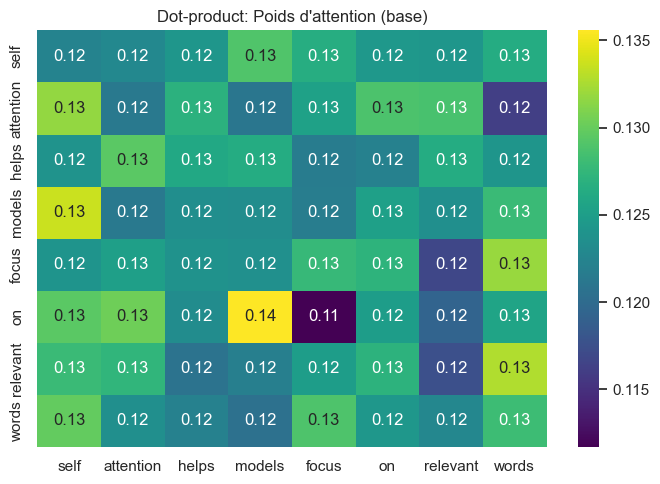

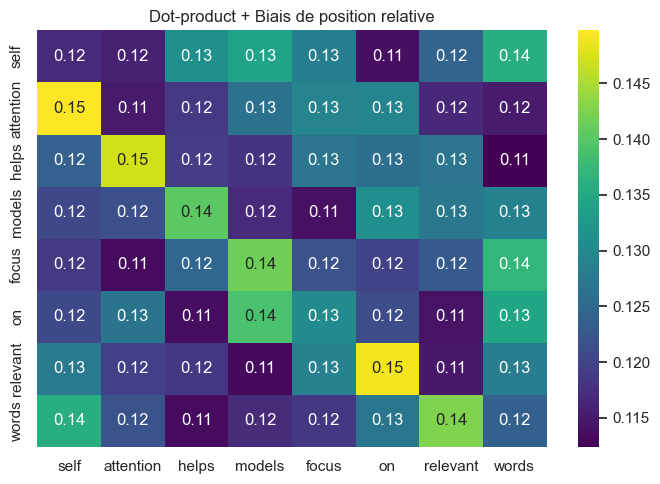

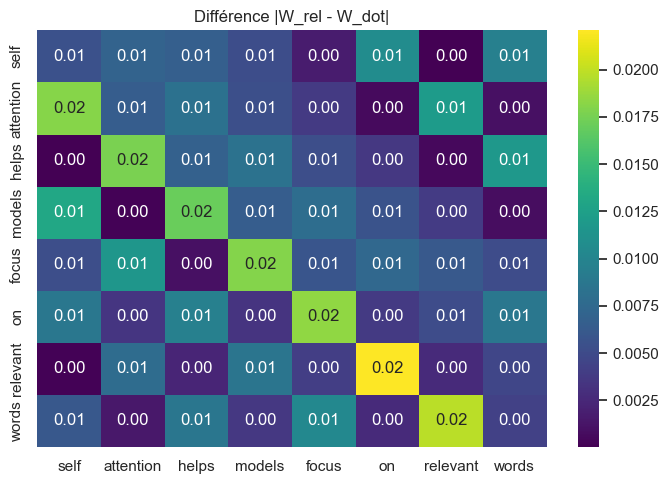

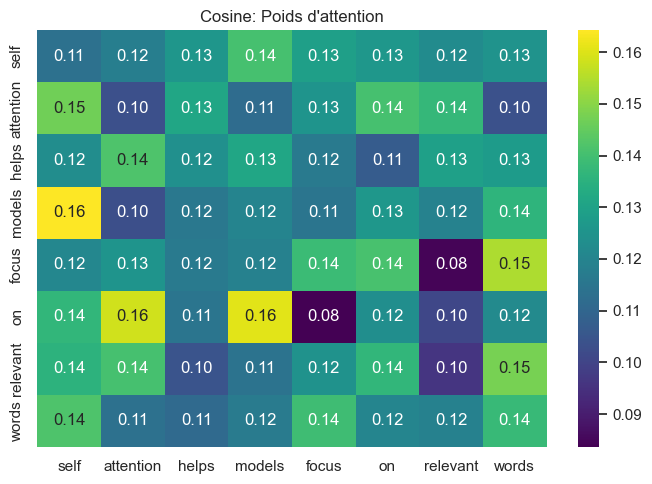

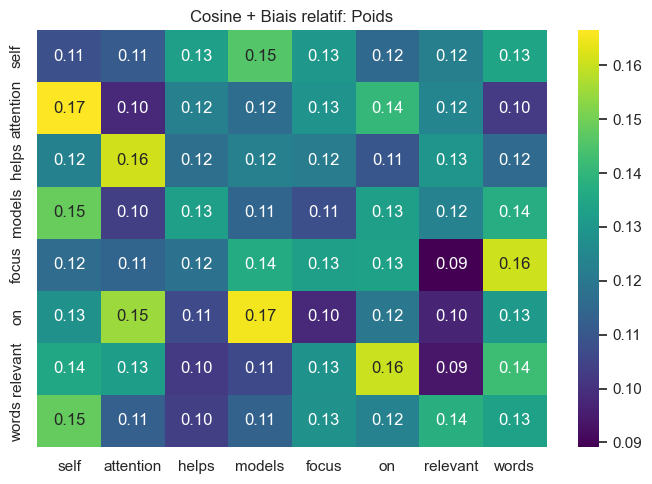

...

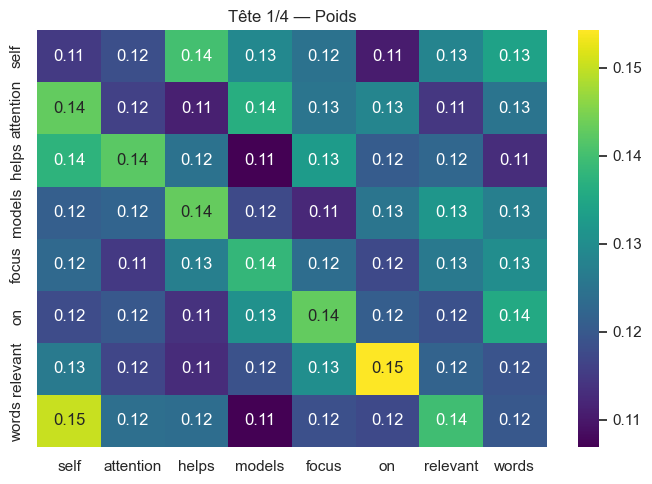

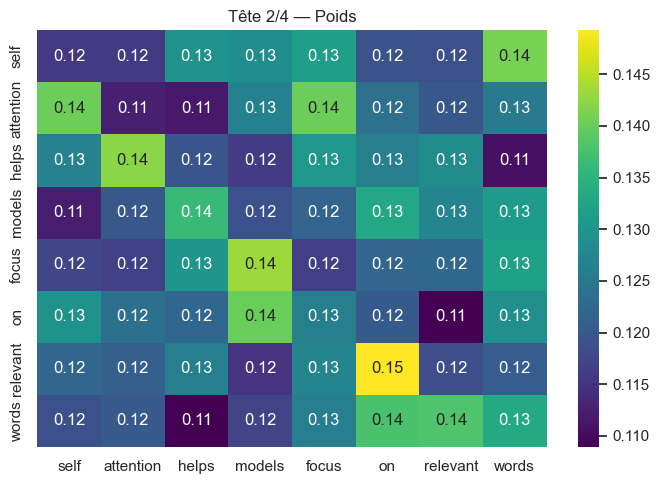

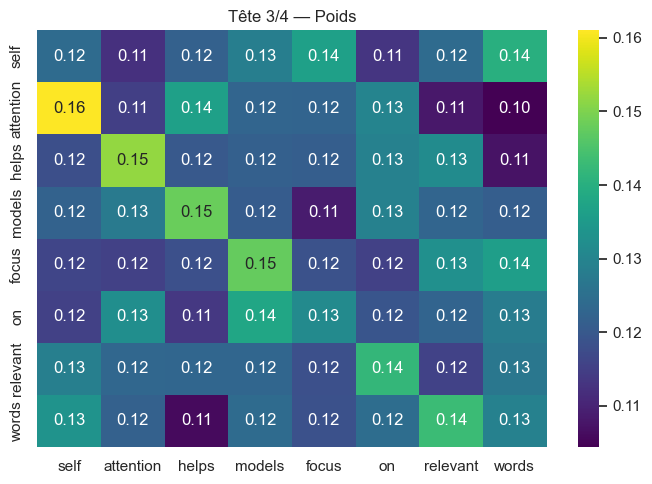

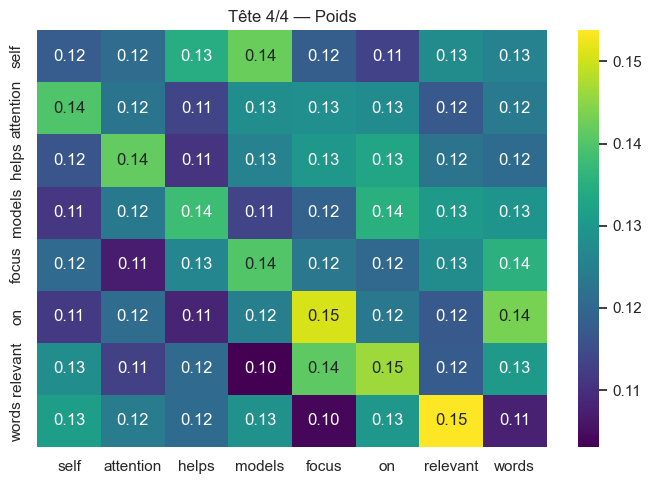

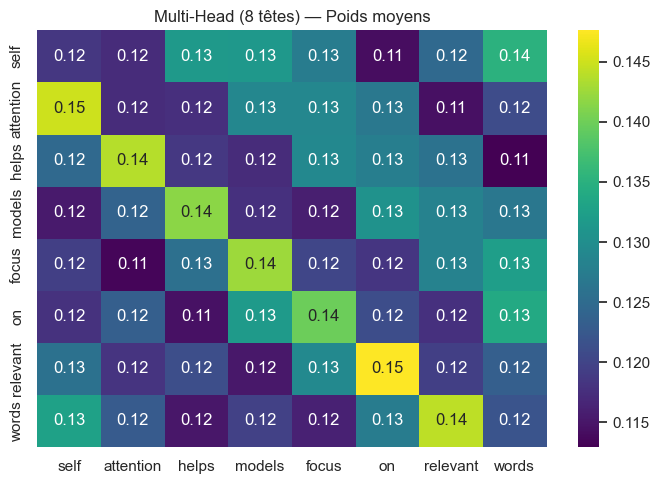

In [6]:
# ============================
# Exercice 8: Extensions et Modifications 
# ============================

import numpy as np                    # NumPy pour le calcul numérique
import seaborn as sns                 # Seaborn pour les heatmaps
import matplotlib.pyplot as plt       # Matplotlib pour tracer les figures

sns.set()                             # Style de tracé par défaut plus lisible

# ---------------------
# Outil: heatmap
# ---------------------
def plot_heat(mat, title, xticklabels=None, yticklabels=None, fmt='.2f', figsize=(7,5)):
    plt.figure(figsize=figsize)                                           # Crée une figure de taille donnée
    sns.heatmap(np.array(mat), annot=True, cmap='viridis', fmt=fmt,       # Affiche mat en heatmap + annotations
                xticklabels=xticklabels, yticklabels=yticklabels)         # Applique étiquettes si fournies
    plt.title(title)                                                      # Titre
    plt.tight_layout()                                                    # Ajuste les marges
    plt.show()                                                            # Affiche

# ---------------------
# Softmax stable
# ---------------------
def softmax(x, axis=-1):
    x = x - np.max(x, axis=axis, keepdims=True)   # Soustraction du max (stabilité numérique)
    exp_x = np.exp(x)                             # Exponentielle
    return exp_x / np.sum(exp_x, axis=axis, keepdims=True)  # Normalisation en probas

# ---------------------
# Embeddings de mots déterministes (même mot -> même vecteur)
# ---------------------
def stable_vec_for_word(word, dim, base_seed=1234):
    h = abs(hash(word)) % (10**9)                   # Hachage stable du mot
    rng = np.random.default_rng(base_seed ^ h)      # Générateur dérivé
    return rng.normal(0, 0.3, size=dim)             # Vecteur gaussien (moy=0, std=0.3)

# ---------------------
# Encodage positionnel absolu (sinusoïdal)
# ---------------------
def positional_encoding(seq_len, d_model):
    pe = np.zeros((seq_len, d_model))                           # Matrice (L, d)
    position = np.arange(seq_len)[:, None]                      # Colonne 0..L-1
    div_term = np.exp(np.arange(0, d_model, 2) * -(np.log(10000.0) / d_model))  # Fréquences
    pe[:, 0::2] = np.sin(position * div_term)                   # Sinus sur dim paires
    pe[:, 1::2] = np.cos(position * div_term)                   # Cosinus sur dim impaires
    return pe                                                   # Retourne PE

# ---------------------
# Biais de position relative simple (type T5-like simplifié)
# - Crée un tableau de biais pour distances relatives [-max_dist, +max_dist]
# - Mappe chaque paire (i,j) à un biais ajouté aux scores
# ---------------------
def relative_position_bias(L, max_distance=8, seed=0):
    rel = np.arange(L)[None, :] - np.arange(L)[:, None]         # Matrice des offsets relatifs (j - i), shape (L,L)
    rel_clipped = np.clip(rel, -max_distance, max_distance)     # Coupe aux bornes [-max_dist, max_dist]
    idx = rel_clipped + max_distance                            # Décale pour indices [0 .. 2*max_dist]
    rng = np.random.default_rng(seed)                           # RNG pour déterminisme
    table = rng.normal(0, 0.1, size=(2*max_distance + 1,))      # Table de biais (1D) pour chaque distance
    bias = table[idx]                                           # Biais par paire (i,j) via lookup
    return bias                                                 # Matrice (L, L) de biais relatifs

# ---------------------
# Attention produit scalaire (avec biais optionnel + masque)
# Q,K,V: (L, d). mask: (L,L) True là où masquer. bias: (L,L) ajouté aux scores.
# ---------------------
def attention_dot(Q, K, V, mask=None, scale=None, bias=None):
    scores = Q @ K.T                                            # Scores bruts QK^T -> (L, L)
    d_k = K.shape[-1]                                           # Dimension des clés
    if scale is None:
        scale = np.sqrt(d_k)                                    # Échelle standard sqrt(d_k)
    scores = scores / scale                                     # Mise à l’échelle
    if bias is not None:
        scores = scores + bias                                  # Ajout du biais de position relative
    if mask is not None:
        scores = np.where(mask, -1e9, scores)                   # Applique le masque (très négatif)
    weights = softmax(scores, axis=-1)                          # Poids d’attention
    output = weights @ V                                        # Sortie = somme pondérée des valeurs
    return output, weights, scores                              # Retourne sortie, poids, scores

# ---------------------
# Attention avec similarité cosinus (au lieu du produit scalaire)
# ---------------------
def attention_cosine(Q, K, V, mask=None, temperature=1.0, bias=None):
    Qn = Q / (np.linalg.norm(Q, axis=-1, keepdims=True) + 1e-9) # Normalise Q (L2) -> Q unitaire
    Kn = K / (np.linalg.norm(K, axis=-1, keepdims=True) + 1e-9) # Normalise K (L2) -> K unitaire
    scores = Qn @ Kn.T                                          # Similarité cosinus ∈ [-1,1]
    scores = scores / max(temperature, 1e-9)                    # Température (contrôle la netteté)
    if bias is not None:
        scores = scores + bias                                  # Autorise aussi un biais relatif
    if mask is not None:
        scores = np.where(mask, -1e9, scores)                   # Masque si fourni
    weights = softmax(scores, axis=-1)                          # Softmax -> poids
    output = weights @ V                                        # Sortie attention
    return output, weights, scores                              # Retourne sortie, poids, scores

# ---------------------
# Outils multi-têtes: split/concat
# ---------------------
def split_heads(X, num_heads):
    L, d = X.shape                                              # Longueur L et dimension d_model
    assert d % num_heads == 0, "d_model doit être divisible par num_heads"  # Vérification divisibilité
    d_h = d // num_heads                                        # Dimension par tête
    return X.reshape(L, num_heads, d_h).transpose(1, 0, 2)      # (num_heads, L, d_h)

def combine_heads(H):
    # H: (num_heads, L, d_h) -> concatène en (L, num_heads*d_h)
    num_heads, L, d_h = H.shape                                 # Récupère dimensions
    return H.transpose(1, 0, 2).reshape(L, num_heads * d_h)     # Recompose (L, d_model)

# ---------------------
# Multi-Head Attention générique (dot ou cosine)
# - sim='dot' utilise attention_dot; sim='cos' utilise attention_cosine
# - rel_bias est ajouté à chaque tête (partagé) s’il est fourni
# ---------------------
def multi_head_attention(Q, K, V, num_heads=4, sim='dot', mask=None, rel_bias=None, temperature=1.0):
    Qh = split_heads(Q, num_heads)                               # Sépare Q en têtes -> (H, L, d_h)
    Kh = split_heads(K, num_heads)                               # Sépare K
    Vh = split_heads(V, num_heads)                               # Sépare V
    head_outputs = []                                            # Liste des sorties par tête
    head_weights = []                                            # Liste des poids par tête
    for h in range(num_heads):                                   # Boucle sur chaque tête
        Q_i, K_i, V_i = Qh[h], Kh[h], Vh[h]                      # Sélectionne la tête h
        if sim == 'dot':                                         # Choix du type de similarité
            out_i, w_i, _ = attention_dot(Q_i, K_i, V_i, mask=mask, scale=np.sqrt(Q_i.shape[-1]), bias=rel_bias)
        else:
            out_i, w_i, _ = attention_cosine(Q_i, K_i, V_i, mask=mask, temperature=temperature, bias=rel_bias)
        head_outputs.append(out_i)                               # Stocke la sortie de la tête
        head_weights.append(w_i)                                 # Stocke les poids de la tête
    H = np.stack(head_outputs, axis=0)                           # Empile sorties -> (H, L, d_h)
    O = combine_heads(H)                                         # Combine têtes -> (L, d_model)
    return O, head_weights                                       # Retourne sortie combinée + poids par tête

# ---------------------
# Prépare une phrase et les projections Q/K/V
# ---------------------
def prepare_sentence(sentence, embed_dim=16, use_abs_pos=True, seed=0):
    tokens = sentence.lower().split()                            # Tokenisation simple
    L = len(tokens)                                              # Longueur L
    X = np.vstack([stable_vec_for_word(w, embed_dim) for w in tokens])  # Empile les embeddings
    if use_abs_pos:                                              # Ajoute encodage positionnel absolu
        X = X + positional_encoding(L, embed_dim) * 0.05         # PE faible pour ne pas dominer
    rng = np.random.default_rng(seed)                            # RNG pour reproductibilité
    Wq = rng.normal(0, 0.2, size=(embed_dim, embed_dim))         # Matrice Wq
    Wk = rng.normal(0, 0.2, size=(embed_dim, embed_dim))         # Matrice Wk
    Wv = rng.normal(0, 0.2, size=(embed_dim, embed_dim))         # Matrice Wv
    Q = X @ Wq                                                   # Q = XWq
    K = X @ Wk                                                   # K = XWk
    V = X @ Wv                                                   # V = XWv
    return tokens, Q, K, V                                       # Retourne tokens et Q/K/V

# =========================================================
# Démo: 1) positions relatives, 2) similarité cosinus vs dot
# =========================================================
sentence = "self attention helps models focus on relevant words"  # Phrase d’exemple
tokens, Q, K, V = prepare_sentence(sentence, embed_dim=16, use_abs_pos=True, seed=42)  # Prépare Q/K/V
L = len(tokens)                                                    # Longueur

# Base: attention dot-product sans biais relatif
out_dot, W_dot, S_dot = attention_dot(Q, K, V, mask=None, scale=None, bias=None)       # Attention standard
plot_heat(W_dot, "Dot-product: Poids d'attention (base)", xticklabels=tokens, yticklabels=tokens)  # Visualise

# Biais de position relative
rel_bias = relative_position_bias(L, max_distance=8, seed=7)       # Construit biais (L,L) selon distances relatives
out_rel, W_rel, S_rel = attention_dot(Q, K, V, mask=None, scale=None, bias=rel_bias)   # Attention + biais relatif
plot_heat(W_rel, "Dot-product + Biais de position relative", xticklabels=tokens, yticklabels=tokens)  # Visualise
plot_heat(np.abs(W_rel - W_dot), "Différence |W_rel - W_dot|", xticklabels=tokens, yticklabels=tokens)  # Comparaison

# Similarité cosinus (sans / avec biais relatif)
out_cos, W_cos, S_cos = attention_cosine(Q, K, V, mask=None, temperature=1.0, bias=None)            # Cosine
plot_heat(W_cos, "Cosine: Poids d'attention", xticklabels=tokens, yticklabels=tokens)                # Visualise
out_cos_rel, W_cos_rel, _ = attention_cosine(Q, K, V, mask=None, temperature=1.0, bias=rel_bias)     # Cosine + biais
plot_heat(W_cos_rel, "Cosine + Biais relatif: Poids", xticklabels=tokens, yticklabels=tokens)        # Visualise

# =========================================================
# Démo: 3) Multi-Head Attention pour 1,2,4,8 têtes
# =========================================================
heads_list = [1, 2, 4, 8]                                         # Nombres de têtes à tester
results_mha = {}                                                   # Stocke résultats

for Hn in heads_list:                                              # Boucle sur nb de têtes
    O, heads_W = multi_head_attention(Q, K, V, num_heads=Hn, sim='dot', mask=None, rel_bias=rel_bias)  # MHA dot+biais
    avg_W = np.mean(np.stack(heads_W, axis=0), axis=0)             # Moyenne des poids sur les têtes (L,L)
    results_mha[Hn] = (O, heads_W, avg_W)                          # Sauvegarde sorties et poids
    plot_heat(avg_W, f"Multi-Head ({Hn} têtes) — Poids moyens", xticklabels=tokens, yticklabels=tokens)  # Visualise
    if Hn in (2, 4):                                               # Pour 2 et 4 têtes, montre par tête
        for i, W_head in enumerate(heads_W):                       # Itère sur chaque tête
            plot_heat(W_head, f"Tête {i+1}/{Hn} — Poids", xticklabels=tokens, yticklabels=tokens)       # Visualise

# Notes rapides (interprétation):
# - Biais de position relative: ajoute une préférence basée sur la distance j-i, utile pour capter l’ordre/localité.
# - Similarité cosinus: insensible à la norme, met l’accent sur l’angle (direction), souvent plus stable.
# - Multi-têtes: plus de têtes = spécialisations différentes (local/global), mais plus de coût et paramètres.

### Exercice 9: Self-Attention mechanism: Practical Applications

- Apply the self-attention mechanism to a real-world dataset (e.g., a collection of movie reviews). Compute the attention weights for sample sentences and visualize the results. Discuss how the self-attention mechanism captures sentiment and important phrases in the reviews.
- Implement a self-attention mechanism for a document summarization task. Use the attention weights to identify key sentences and generate a summary of the document. Visualize and evaluate the quality of the summary.
- Use the self-attention mechanism to build a question-answering system. Compute the attention weights for questions and corresponding context paragraphs. Visualize the attention weights and discuss how the model identifies relevant information to answer the questions.

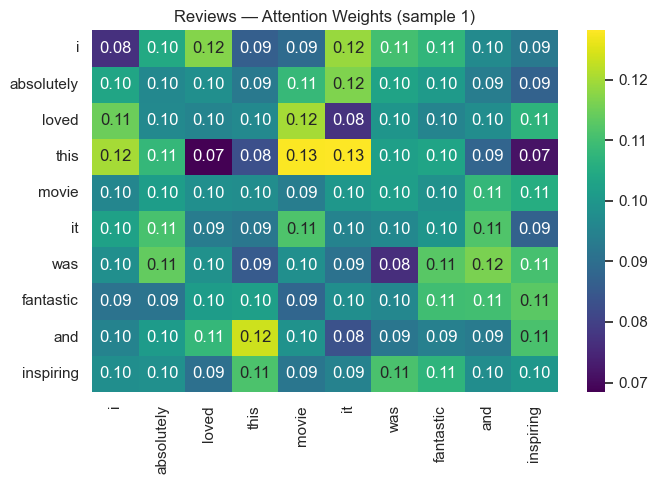

Review 1 top tokens by attention: ['fantastic', 'movie', 'absolutely', 'and', 'it']


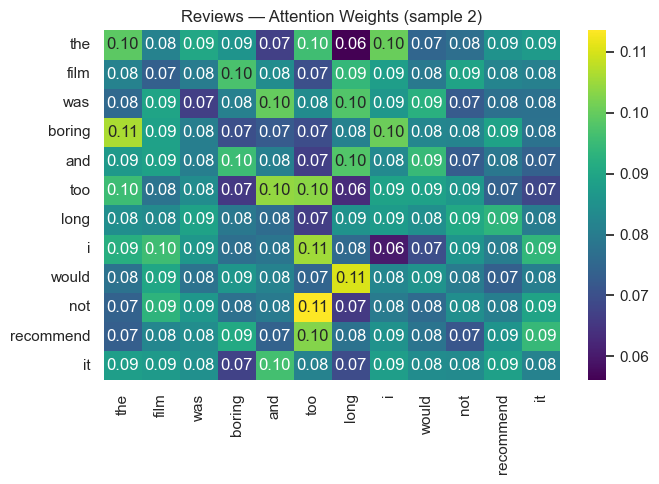

Review 2 top tokens by attention: ['the', 'too', 'film', 'i', 'and']


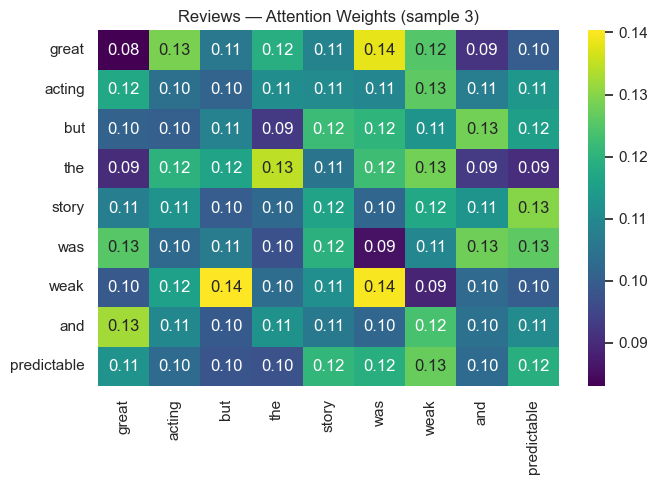

Review 3 top tokens by attention: ['weak', 'was', 'story', 'predictable', 'acting']


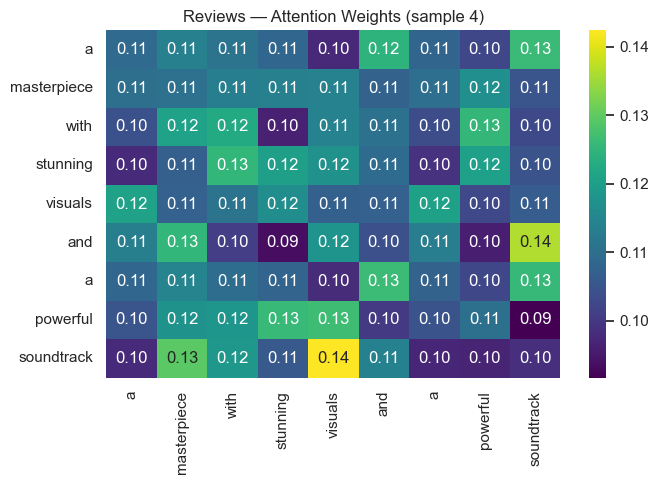

Review 4 top tokens by attention: ['masterpiece', 'visuals', 'with', 'and', 'soundtrack']


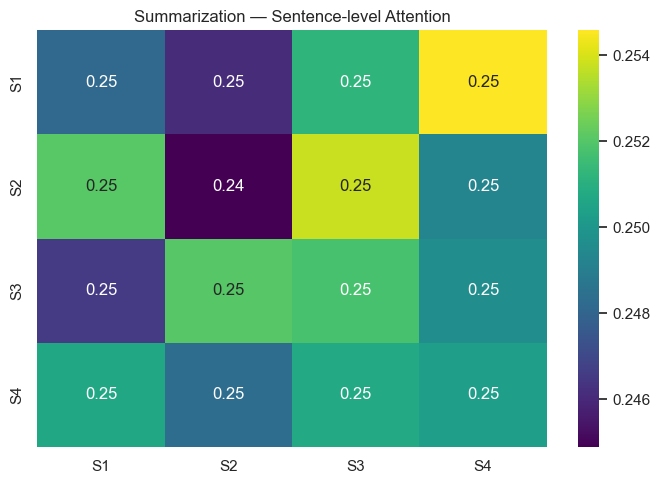

Summary (top sentences by attention): Self-attention allows models to focus on relevant parts of the input. This mechanism has become central to modern NLP architectures.


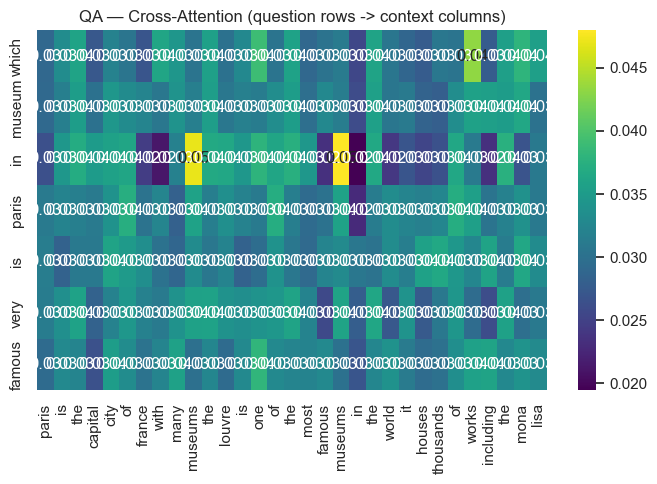

QA — Top context tokens by attention: ['museums', 'museums', 'works', 'one', 'the', 'of']
QA — Best matching sentence: It houses thousands of works including the Mona Lisa


In [ ]:

import numpy as np                      # Importe NumPy pour les calculs numériques (vecteurs/matrices)
import re                               # Importe 're' pour découper un document en phrases via expressions régulières
import seaborn as sns                   # Importe Seaborn pour dessiner des heatmaps lisibles
import matplotlib.pyplot as plt         # Importe Matplotlib pour afficher les graphiques

sns.set()                               # Applique un style par défaut plus propre aux figures

def softmax(x, axis=-1):                # Définit une fonction softmax stable numériquement
    x = x - np.max(x, axis=axis, keepdims=True)  # Soustrait le max par axe pour éviter l’explosion des exponentielles
    exp_x = np.exp(x)                   # Calcule l’exponentielle de chaque élément
    return exp_x / np.sum(exp_x, axis=axis, keepdims=True)  # Normalise pour obtenir des probabilités

def plot_heat(mat, title, xticklabels=None, yticklabels=None, fmt='.2f', figsize=(7,5)):  # Trace une heatmap pratique
    plt.figure(figsize=figsize)         # Crée une nouvelle figure de la taille souhaitée
    sns.heatmap(np.array(mat), annot=True, cmap='viridis', fmt=fmt,  # Dessine la matrice avec annotations
                xticklabels=xticklabels, yticklabels=yticklabels)    # Applique étiquettes si fournies
    plt.title(title)                    # Ajoute un titre
    plt.tight_layout()                  # Optimise les marges
    plt.show()                          # Affiche la figure

def stable_vec_for_word(word, dim=32, base_seed=1234):  # Génère un embedding déterministe (même mot -> même vecteur)
    h = abs(hash(word)) % (10**9)       # Transforme le mot en entier stable
    rng = np.random.default_rng(base_seed ^ h)  # Initialise un générateur pseudo-aléatoire à partir de cet entier
    return rng.normal(0, 0.3, size=dim) # Retourne un vecteur gaussien de dimension 'dim'

def embed_sentence(tokens, dim=32):     # Convertit une liste de tokens en matrice d’embeddings (L, dim)
    return np.vstack([stable_vec_for_word(t, dim) for t in tokens])  # Empile les vecteurs mot à mot

def sentence_embedding(tokens, dim=32): # Produit un embedding de phrase (moyenne des embeddings de mots)
    X = embed_sentence(tokens, dim)     # Calcule les embeddings des mots
    return X.mean(axis=0, keepdims=True)  # Retourne un vecteur (1, dim) moyen

def positional_encoding(seq_len, d_model):  # Encodage positionnel sinusoïdal (faible amplitude)
    pe = np.zeros((seq_len, d_model))    # Crée une matrice (L, d)
    position = np.arange(seq_len)[:, None]  # Colonne des positions 0..L-1
    div_term = np.exp(np.arange(0, d_model, 2) * -(np.log(10000.0) / d_model))  # Fréquences
    pe[:, 0::2] = np.sin(position * div_term)  # Applique sin aux dimensions paires
    pe[:, 1::2] = np.cos(position * div_term)  # Applique cos aux dimensions impaires
    return pe * 0.05                     # Met une petite amplitude pour ne pas dominer les embeddings

def scaled_dot_product_attention(Q, K, V, mask=None, scale=None):  # Implémente l’attention dot-product avec options
    scores = Q @ K.T                     # Calcule les scores de similarité (QK^T) -> (Lq, Lk)
    d_k = K.shape[-1]                    # Récupère la dimension des clés (d_k)
    if scale is None:                    # Si aucune échelle fournie
        scale = np.sqrt(d_k)             # Utilise l’échelle standard sqrt(d_k) pour stabiliser le softmax
    scores = scores / scale              # Applique la mise à l’échelle aux scores
    if mask is not None:                 # Si un masque est fourni
        scores = np.where(mask, -1e9, scores)  # Remplace les positions masquées par un grand négatif
    weights = softmax(scores, axis=-1)   # Convertit les scores en probabilités (poids d’attention)
    output = weights @ V                 # Produit la somme pondérée des valeurs -> (Lq, d_v)
    return output, weights, scores       # Retourne la sortie, les poids et les scores bruts

# ------------------------------------------------------------
# PARTIE 1 — Avis de films (sentiment) : visualiser les poids
# ------------------------------------------------------------

reviews = [                               # Déclare une petite liste d’avis de films (texte brut)
    "I absolutely loved this movie it was fantastic and inspiring",
    "The film was boring and too long I would not recommend it",
    "Great acting but the story was weak and predictable",
    "A masterpiece with stunning visuals and a powerful soundtrack"
]

dim = 32                                  # Fixe la dimension des embeddings de mots
rng = np.random.default_rng(0)            # Crée un générateur aléatoire (pour Wq/Wk/Wv) reproductible

Wq = rng.normal(0, 0.2, size=(dim, dim))  # Initialise la matrice de projection pour Q (d x d)
Wk = rng.normal(0, 0.2, size=(dim, dim))  # Initialise la matrice de projection pour K (d x d)
Wv = rng.normal(0, 0.2, size=(dim, dim))  # Initialise la matrice de projection pour V (d x d)

for idx, text in enumerate(reviews):      # Parcourt chaque avis avec son index
    tokens = text.lower().split()         # Tokenise l’avis en mots (séparation par espaces + minuscules)
    X = embed_sentence(tokens, dim)       # Convertit les tokens en matrice d’embeddings (L, d)
    X = X + positional_encoding(len(tokens), dim)  # Ajoute un léger encodage positionnel (ordre des mots)
    Q = X @ Wq                             # Calcule Q = XWq (requêtes par token)
    K = X @ Wk                             # Calcule K = XWk (clés par token)
    V = X @ Wv                             # Calcule V = XWv (valeurs par token)
    out, att_w, att_scores = scaled_dot_product_attention(Q, K, V)  # Applique l’attention self sur l’avis
    plot_heat(att_w,                      # Affiche la heatmap des poids d’attention
              f"Reviews — Attention Weights (sample {idx+1})",
              xticklabels=tokens, yticklabels=tokens)
    top_cols = np.argsort(att_w.mean(axis=0))[::-1][:5]  # Trouve les 5 mots les plus « regardés » en moyenne
    print(f"Review {idx+1} top tokens by attention:", [tokens[i] for i in top_cols])  # Affiche ces mots importants

# --------------------------------------------------------------------
# PARTIE 2 — Résumé de document : sélection de phrases par attention
# --------------------------------------------------------------------

doc = (                                   # Définit un document multi-phrases (exemple synthétique)
    "Deep learning models can capture complex patterns in data. "
    "However, they often require large datasets and careful regularization. "
    "Self-attention allows models to focus on relevant parts of the input. "
    "This mechanism has become central to modern NLP architectures."
)

sentences = [s.strip() for s in re.split(r'[.!?]+', doc) if s.strip()]  # Découpe le document en phrases propres
sent_tokens = [s.lower().split() for s in sentences]  # Tokenise chaque phrase en mots
S = len(sentences)                        # Nombre de phrases dans le document

sent_dim = 32                             # Dimension des embeddings de phrase (même taille que mot)
X_sent = np.vstack([sentence_embedding(toks, sent_dim) for toks in sent_tokens])  # Embeddings de phrases (S, d)
X_sent = X_sent + positional_encoding(S, sent_dim)  # Ajoute encodage positionnel de niveau phrase
rng2 = np.random.default_rng(1)           # Nouveau RNG pour les poids d’attention de phrases
Wq_s = rng2.normal(0, 0.2, size=(sent_dim, sent_dim))  # Wq pour phrases
Wk_s = rng2.normal(0, 0.2, size=(sent_dim, sent_dim))  # Wk pour phrases
Wv_s = rng2.normal(0, 0.2, size=(sent_dim, sent_dim))  # Wv pour phrases

Q_s = X_sent @ Wq_s                        # Calcule Q pour les phrases
K_s = X_sent @ Wk_s                        # Calcule K pour les phrases
V_s = X_sent @ Wv_s                        # Calcule V pour les phrases
out_s, att_w_s, _ = scaled_dot_product_attention(Q_s, K_s, V_s)  # Applique l’attention entre phrases

plot_heat(att_w_s,                         # Visualise les poids d’attention entre phrases
          "Summarization — Sentence-level Attention",
          xticklabels=[f"S{i+1}" for i in range(S)],
          yticklabels=[f"S{i+1}" for i in range(S)])

importance = att_w_s.mean(axis=0)         # Mesure une importance globale par phrase (moyenne des colonnes)
top_idx = np.argsort(importance)[::-1][:2]  # Sélectionne les 2 phrases les plus importantes
summary = " ".join([sentences[i] + "." for i in sorted(top_idx)])  # Construit un mini-résumé conservant l’ordre
print("Summary (top sentences by attention):", summary)  # Affiche le résumé

# ------------------------------------------------------------
# PARTIE 3 — Question-Réponse : cross-attention Q->K,V contexte
# ------------------------------------------------------------

context = (                                # Définit un contexte (plusieurs phrases)
    "Paris is the capital city of France with many museums. "
    "The Louvre is one of the most famous museums in the world. "
    "It houses thousands of works including the Mona Lisa."
)
question = "Which museum in Paris is very famous?"  # Définit une question simple

ctx_tokens = context.lower().replace(".", "").split()  # Tokenise le contexte (enlevant les points)
q_tokens = question.lower().replace("?", "").split()   # Tokenise la question (enlevant le ?)

X_ctx = embed_sentence(ctx_tokens, dim)     # Embeddings des tokens du contexte (Lc, d)
X_q = embed_sentence(q_tokens, dim)         # Embeddings des tokens de la question (Lq, d)
X_ctx = X_ctx + positional_encoding(len(ctx_tokens), dim)  # Ajoute PE au contexte
X_q = X_q + positional_encoding(len(q_tokens), dim)        # Ajoute PE à la question

rng3 = np.random.default_rng(2)             # RNG pour matrices de projection cross-attention
Wq_c = rng3.normal(0, 0.2, size=(dim, dim)) # Wq appliqué aux tokens de la question
Wk_c = rng3.normal(0, 0.2, size=(dim, dim)) # Wk appliqué aux tokens du contexte
Wv_c = rng3.normal(0, 0.2, size=(dim, dim)) # Wv appliqué aux tokens du contexte

Q_c = X_q @ Wq_c                            # Q provient de la question (Lq, d)
K_c = X_ctx @ Wk_c                          # K provient du contexte (Lc, d)
V_c = X_ctx @ Wv_c                          # V provient du contexte (Lc, d)

out_c, att_w_c, _ = scaled_dot_product_attention(Q_c, K_c, V_c)  # Calcule la cross-attention Q(question)->K/V(contexte)

plot_heat(att_w_c,                          # Visualise la carte d’attention question -> contexte
          "QA — Cross-Attention (question rows -> context columns)",
          xticklabels=ctx_tokens, yticklabels=q_tokens)

col_importance = att_w_c.mean(axis=0)       # Agrège par colonne pour estimer les tokens de contexte les plus visés
top_ctx_cols = np.argsort(col_importance)[::-1][:6]  # Prend les 6 tokens de contexte les plus ciblés
print("QA — Top context tokens by attention:", [ctx_tokens[i] for i in top_ctx_cols])  # Affiche ces tokens

# Heuristique: regrouper les tokens par phrase du contexte et sommer l’attention moyenne
ctx_sentences = [s.strip() for s in re.split(r'[.!?]+', context) if s.strip()]  # Découpe le contexte en phrases
ctx_words_per_sent = [s.lower().split() for s in ctx_sentences]  # Tokenise chaque phrase
offsets = np.cumsum([0] + [len(w) for w in ctx_words_per_sent])  # Calcule les offsets d’index globaux par phrase

sent_scores = []                            # Prépare une liste de scores par phrase
for si, words in enumerate(ctx_words_per_sent):  # Boucle sur les phrases
    start, end = offsets[si], offsets[si+1]      # Calcule les bornes [start, end) dans ctx_tokens
    score = col_importance[start:end].mean()     # Moyenne d’attention sur les tokens de la phrase
    sent_scores.append(score)                    # Stocke le score de la phrase

best_sent = ctx_sentences[int(np.argmax(sent_scores))]  # Choisit la phrase la plus « citée » par la question
print("QA — Best matching sentence:", best_sent)   # Affiche la phrase de contexte la plus pertinente
# ...existing code...